### RPV analysis for District 1

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd

pd.set_option('display.max_columns', None)

import numpy as np

import maup
import warnings; warnings.filterwarnings('ignore', 'GeoSeries.isna', UserWarning)
maup.progress.enabled = True

from pyei.goodmans_er import GoodmansER, GoodmansERBayes
from pyei.two_by_two import TwoByTwoEI
from pyei.r_by_c import RowByColumnEI

import arviz as az

from tqdm import tqdm

/opt/miniconda3/envs/gerry2024/lib/python3.12/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)


### Precinct file:

In [2]:
D1_precincts_df = pd.read_csv("./Data/District precinct files/D1 precincts/D1_precincts_with_data.csv")

In [3]:
D1_precincts_df

,Unnamed: 0,Precinct,District,TOTPOP20,VAP20,HVAP20,AAPIVAP20,BVAP20,AMINVAP20,WVAP20,DVAP22,HDVAP22,AAPIDVAP22,BDVAP22,AMINDVAP22,WDVAP22,Candace Avalos Condensed Rank 1,Jamie Dunphy Condensed Rank 1,Loretta Smith Condensed Rank 1,Noah Ernst Condensed Rank 1,Terrence Hayes Condensed Rank 1,Steph Routh Condensed Rank 1,Timur Ender Condensed Rank 1,Doug Clove Condensed Rank 1,Peggy Sue Owens Condensed Rank 1,David Linn Condensed Rank 1,Joe Allen Condensed Rank 1,Michael (Mike) Sands Condensed Rank 1,Deian Salazar Condensed Rank 1,Cayle Tern Condensed Rank 1,Thomas Shervey Condensed Rank 1,Joe Furi Condensed Rank 1,Uncertified Write In Condensed Rank 1,Candace Avalos Condensed Rank 2,Jamie Dunphy Condensed Rank 2,Loretta Smith Condensed Rank 2,Noah Ernst Condensed Rank 2,Terrence Hayes Condensed Rank 2,Steph Routh Condensed Rank 2,Timur Ender Condensed Rank 2,Doug Clove Condensed Rank 2,Peggy Sue Owens Condensed Rank 2,David Linn Condensed Rank 2,Joe Allen Condensed Rank 2,Michael (Mike) Sands Condensed Rank 2,Deian Salazar Condensed Rank 2,Cayle Tern Condensed Rank 2,Thomas Shervey Condensed Rank 2,Joe Furi Condensed Rank 2,Uncertified Write In Condensed Rank 2,Candace Avalos Condensed Rank 3,Jamie Dunphy Condensed Rank 3,Loretta Smith Condensed Rank 3,Noah Ernst Condensed Rank 3,Terrence Hayes Condensed Rank 3,Steph Routh Condensed Rank 3,Timur Ender Condensed Rank 3,Doug Clove Condensed Rank 3,Peggy Sue Owens Condensed Rank 3,David Linn Condensed Rank 3,Joe Allen Condensed Rank 3,Michael (Mike) Sands Condensed Rank 3,Deian Salazar Condensed Rank 3,Cayle Tern Condensed Rank 3,Thomas Shervey Condensed Rank 3,Joe Furi Condensed Rank 3,Uncertified Write In Condensed Rank 3,Candace Avalos Condensed Rank 4,Jamie Dunphy Condensed Rank 4,Loretta Smith Condensed Rank 4,Noah Ernst Condensed Rank 4,Terrence Hayes Condensed Rank 4,Steph Routh Condensed Rank 4,Timur Ender Condensed Rank 4,Doug Clove Condensed Rank 4,Peggy Sue Owens Condensed Rank 4,David Linn Condensed Rank 4,Joe Allen Condensed Rank 4,Michael (Mike) Sands Condensed Rank 4,Deian Salazar Condensed Rank 4,Cayle Tern Condensed Rank 4,Thomas Shervey Condensed Rank 4,Joe Furi Condensed Rank 4,Uncertified Write In Condensed Rank 4,Candace Avalos Condensed Rank 5,Jamie Dunphy Condensed Rank 5,Loretta Smith Condensed Rank 5,Noah Ernst Condensed Rank 5,Terrence Hayes Condensed Rank 5,Steph Routh Condensed Rank 5,Timur Ender Condensed Rank 5,Doug Clove Condensed Rank 5,Peggy Sue Owens Condensed Rank 5,David Linn Condensed Rank 5,Joe Allen Condensed Rank 5,Michael (Mike) Sands Condensed Rank 5,Deian Salazar Condensed Rank 5,Cayle Tern Condensed Rank 5,Thomas Shervey Condensed Rank 5,Joe Furi Condensed Rank 5,Uncertified Write In Condensed Rank 5,Candace Avalos Condensed Rank 6,Jamie Dunphy Condensed Rank 6,Loretta Smith Condensed Rank 6,Noah Ernst Condensed Rank 6,Terrence Hayes Condensed Rank 6,Steph Routh Condensed Rank 6,Timur Ender Condensed Rank 6,Doug Clove Condensed Rank 6,Peggy Sue Owens Condensed Rank 6,David Linn Condensed Rank 6,Joe Allen Condensed Rank 6,Michael (Mike) Sands Condensed Rank 6,Deian Salazar Condensed Rank 6,Cayle Tern Condensed Rank 6,Thomas Shervey Condensed Rank 6,Joe Furi Condensed Rank 6,Uncertified Write In Condensed Rank 6,Condensed total votes,Candace Avalos Condensed Borda 654321,Jamie Dunphy Condensed Borda 654321,Loretta Smith Condensed Borda 654321,Noah Ernst Condensed Borda 654321,Terrence Hayes Condensed Borda 654321,Steph Routh Condensed Borda 654321,Timur Ender Condensed Borda 654321,Doug Clove Condensed Borda 654321,Peggy Sue Owens Condensed Borda 654321,David Linn Condensed Borda 654321,Joe Allen Condensed Borda 654321,Michael (Mike) Sands Condensed Borda 654321,Deian Salazar Condensed Borda 654321,Cayle Tern Condensed Borda 654321,Thomas Shervey Condensed Borda 654321,Joe Furi Condensed Borda 654321,Uncertified Write In Condensed Borda 654321,Condensed Borda 654321 total,Candace Avalos Condensed Borda 521000,Jamie Dunphy Condensed Borda 5

### Precinct C112 has no population and no votes, and Precinct M4809 has no population and 8 votes (which is even worse!), so let's remove these two precincts.

In [4]:
D1_precincts_df = D1_precincts_df.drop([22, 26]).reset_index(drop=True)

In [5]:
D1_precincts_df 

,Unnamed: 0,Precinct,District,TOTPOP20,VAP20,HVAP20,AAPIVAP20,BVAP20,AMINVAP20,WVAP20,DVAP22,HDVAP22,AAPIDVAP22,BDVAP22,AMINDVAP22,WDVAP22,Candace Avalos Condensed Rank 1,Jamie Dunphy Condensed Rank 1,Loretta Smith Condensed Rank 1,Noah Ernst Condensed Rank 1,Terrence Hayes Condensed Rank 1,Steph Routh Condensed Rank 1,Timur Ender Condensed Rank 1,Doug Clove Condensed Rank 1,Peggy Sue Owens Condensed Rank 1,David Linn Condensed Rank 1,Joe Allen Condensed Rank 1,Michael (Mike) Sands Condensed Rank 1,Deian Salazar Condensed Rank 1,Cayle Tern Condensed Rank 1,Thomas Shervey Condensed Rank 1,Joe Furi Condensed Rank 1,Uncertified Write In Condensed Rank 1,Candace Avalos Condensed Rank 2,Jamie Dunphy Condensed Rank 2,Loretta Smith Condensed Rank 2,Noah Ernst Condensed Rank 2,Terrence Hayes Condensed Rank 2,Steph Routh Condensed Rank 2,Timur Ender Condensed Rank 2,Doug Clove Condensed Rank 2,Peggy Sue Owens Condensed Rank 2,David Linn Condensed Rank 2,Joe Allen Condensed Rank 2,Michael (Mike) Sands Condensed Rank 2,Deian Salazar Condensed Rank 2,Cayle Tern Condensed Rank 2,Thomas Shervey Condensed Rank 2,Joe Furi Condensed Rank 2,Uncertified Write In Condensed Rank 2,Candace Avalos Condensed Rank 3,Jamie Dunphy Condensed Rank 3,Loretta Smith Condensed Rank 3,Noah Ernst Condensed Rank 3,Terrence Hayes Condensed Rank 3,Steph Routh Condensed Rank 3,Timur Ender Condensed Rank 3,Doug Clove Condensed Rank 3,Peggy Sue Owens Condensed Rank 3,David Linn Condensed Rank 3,Joe Allen Condensed Rank 3,Michael (Mike) Sands Condensed Rank 3,Deian Salazar Condensed Rank 3,Cayle Tern Condensed Rank 3,Thomas Shervey Condensed Rank 3,Joe Furi Condensed Rank 3,Uncertified Write In Condensed Rank 3,Candace Avalos Condensed Rank 4,Jamie Dunphy Condensed Rank 4,Loretta Smith Condensed Rank 4,Noah Ernst Condensed Rank 4,Terrence Hayes Condensed Rank 4,Steph Routh Condensed Rank 4,Timur Ender Condensed Rank 4,Doug Clove Condensed Rank 4,Peggy Sue Owens Condensed Rank 4,David Linn Condensed Rank 4,Joe Allen Condensed Rank 4,Michael (Mike) Sands Condensed Rank 4,Deian Salazar Condensed Rank 4,Cayle Tern Condensed Rank 4,Thomas Shervey Condensed Rank 4,Joe Furi Condensed Rank 4,Uncertified Write In Condensed Rank 4,Candace Avalos Condensed Rank 5,Jamie Dunphy Condensed Rank 5,Loretta Smith Condensed Rank 5,Noah Ernst Condensed Rank 5,Terrence Hayes Condensed Rank 5,Steph Routh Condensed Rank 5,Timur Ender Condensed Rank 5,Doug Clove Condensed Rank 5,Peggy Sue Owens Condensed Rank 5,David Linn Condensed Rank 5,Joe Allen Condensed Rank 5,Michael (Mike) Sands Condensed Rank 5,Deian Salazar Condensed Rank 5,Cayle Tern Condensed Rank 5,Thomas Shervey Condensed Rank 5,Joe Furi Condensed Rank 5,Uncertified Write In Condensed Rank 5,Candace Avalos Condensed Rank 6,Jamie Dunphy Condensed Rank 6,Loretta Smith Condensed Rank 6,Noah Ernst Condensed Rank 6,Terrence Hayes Condensed Rank 6,Steph Routh Condensed Rank 6,Timur Ender Condensed Rank 6,Doug Clove Condensed Rank 6,Peggy Sue Owens Condensed Rank 6,David Linn Condensed Rank 6,Joe Allen Condensed Rank 6,Michael (Mike) Sands Condensed Rank 6,Deian Salazar Condensed Rank 6,Cayle Tern Condensed Rank 6,Thomas Shervey Condensed Rank 6,Joe Furi Condensed Rank 6,Uncertified Write In Condensed Rank 6,Condensed total votes,Candace Avalos Condensed Borda 654321,Jamie Dunphy Condensed Borda 654321,Loretta Smith Condensed Borda 654321,Noah Ernst Condensed Borda 654321,Terrence Hayes Condensed Borda 654321,Steph Routh Condensed Borda 654321,Timur Ender Condensed Borda 654321,Doug Clove Condensed Borda 654321,Peggy Sue Owens Condensed Borda 654321,David Linn Condensed Borda 654321,Joe Allen Condensed Borda 654321,Michael (Mike) Sands Condensed Borda 654321,Deian Salazar Condensed Borda 654321,Cayle Tern Condensed Borda 654321,Thomas Shervey Condensed Borda 654321,Joe Furi Condensed Borda 654321,Uncertified Write In Condensed Borda 654321,Condensed Borda 654321 total,Candace Avalos Condensed Borda 521000,Jamie Dunphy Condensed Borda 5

### Let's start with DVAP demographics for the district.

In [6]:
D1_precincts_df[['DVAP22', 'HDVAP22', 'AAPIDVAP22', 'BDVAP22', 'AMINDVAP22', 'WDVAP22']].sum()

DVAP22        110336.609663
HDVAP22        10834.163691
AAPIDVAP22     16195.549597
BDVAP22         9937.059772
AMINDVAP22      2688.600027
WDVAP22        70681.236577
dtype: float64

In [7]:
[(col+" pct:", D1_precincts_df[col].sum()/D1_precincts_df['DVAP22'].sum()) for col in ['HDVAP22', 'AAPIDVAP22', 'BDVAP22', 'AMINDVAP22', 'WDVAP22']]

[('HDVAP22 pct:', 0.09819192128642946),
 ('AAPIDVAP22 pct:', 0.1467830998799974),
 ('BDVAP22 pct:', 0.09006131149200342),
 ('AMINDVAP22 pct:', 0.02436725249163504),
 ('WDVAP22 pct:', 0.6405964148499346)]

### Create percentage columns for each of these, as well as a percentage column for POCDVAP22:

In [8]:
D1_precincts_df['POCDVAP22'] = D1_precincts_df['DVAP22'] - D1_precincts_df['WDVAP22']

In [9]:
for col in ['HDVAP22', 'AAPIDVAP22', 'BDVAP22', 'AMINDVAP22', 'WDVAP22', 'POCDVAP22']:
    D1_precincts_df[col+' pct'] = D1_precincts_df[col]/D1_precincts_df['DVAP22']

### What are the ranges of these percentages over precincts like?

(array([0., 0., 0., 1., 1., 1., 0., 1., 5., 6., 4., 3., 2., 1., 1., 0., 0.,
        0., 0., 0., 1., 0., 0., 0.]),
 array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
        0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21,
        0.22, 0.23, 0.24]),
 <BarContainer object of 24 artists>)

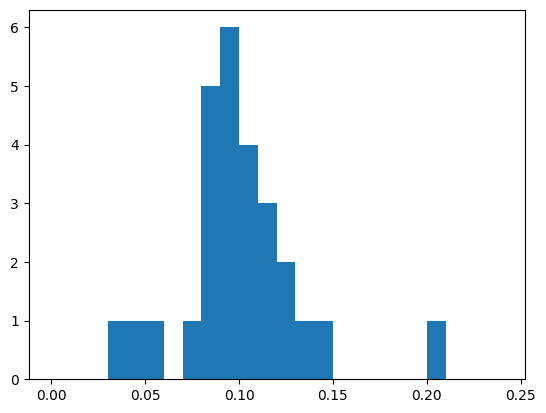

In [10]:
plt.hist(D1_precincts_df['HDVAP22 pct'], bins = [0.01*x for x in range(25)])

(array([0., 0., 1., 0., 0., 0., 0., 2., 0., 0., 2., 1., 5., 1., 4., 6., 3.,
        0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.]),
 array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
        0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21,
        0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29]),
 <BarContainer object of 29 artists>)

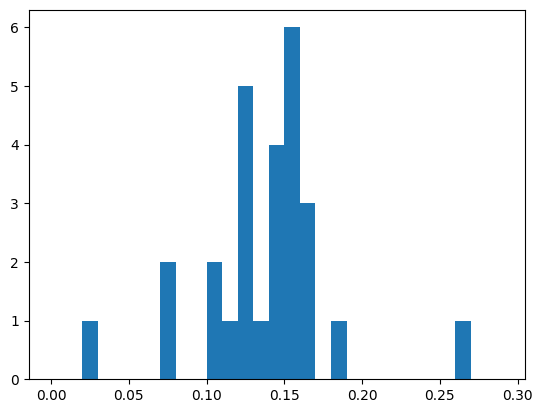

In [11]:
plt.hist(D1_precincts_df['AAPIDVAP22 pct'], bins = [0.01*x for x in range(30)])

(array([1., 1., 0., 0., 0., 1., 4., 4., 7., 1., 1., 1., 2., 1., 1., 1., 0.,
        0., 1.]),
 array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
        0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19]),
 <BarContainer object of 19 artists>)

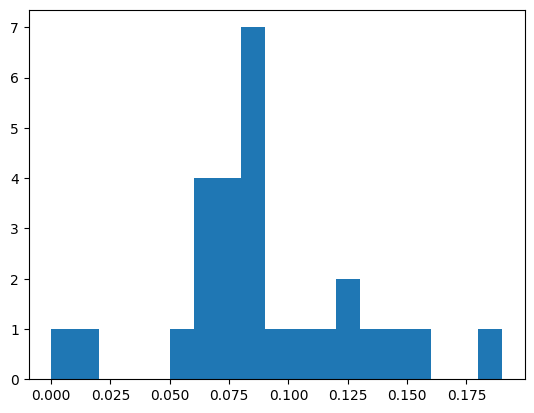

In [12]:
plt.hist(D1_precincts_df['BDVAP22 pct'], bins = [0.01*x for x in range(20)])

(array([ 0.,  7., 13.,  4.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         1.]),
 array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
        0.11, 0.12, 0.13, 0.14]),
 <BarContainer object of 14 artists>)

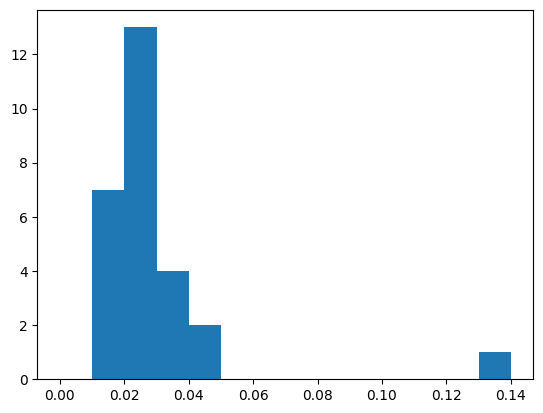

In [13]:
plt.hist(D1_precincts_df['AMINDVAP22 pct'], bins = [0.01*x for x in range(15)])

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 2., 2., 2.,
        3., 0., 1., 3., 3., 2., 2., 0., 0., 0., 0., 0., 1., 2., 0.]),
 array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
        0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21,
        0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32,
        0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43,
        0.44, 0.45, 0.46, 0.47, 0.48, 0.49]),
 <BarContainer object of 49 artists>)

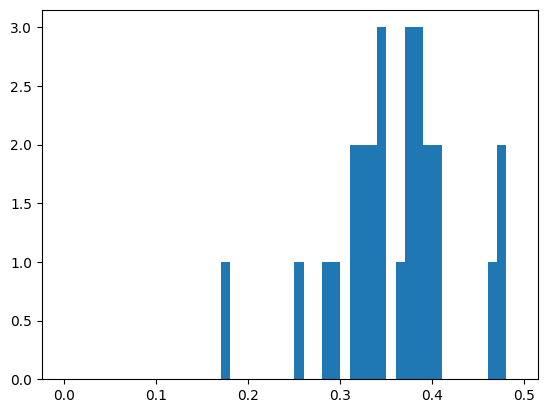

In [14]:
plt.hist(D1_precincts_df['POCDVAP22 pct'], bins = [0.01*x for x in range(50)])

### So there's some variation - much less for AMIN, which just has one very small outlier (5 people out of 36 = 14%).
### So let's skip AMIN and do the rest.

### Use the orignal condensed versions of the Rank 1 and Borda scores, because they're just not that difference from the viable-condensed versions.

### For election data, how did candidates' total district-wide scores compare for Rank 1 scores vs. Borda 654321 and Borda 521000 scores?

In [15]:
D1_candidates = [
    'Candace Avalos',
    'Jamie Dunphy',
    'Loretta Smith',
    'Noah Ernst',
    'Terrence Hayes',
    'Steph Routh',
    'Timur Ender'
]

D1_candidates_reversed = list(reversed(D1_candidates))

In [16]:
rank1_total = [D1_precincts_df[name + ' Condensed Rank 1'].sum() for name in D1_candidates_reversed]
borda654321_total = [D1_precincts_df[name + ' Condensed Borda 654321'].sum() for name in D1_candidates_reversed]
borda521000_total = [D1_precincts_df[name + ' Condensed Borda 521000'].sum() for name in D1_candidates_reversed]

rank1_pct = [x/sum(rank1_total) for x in rank1_total]
borda654321_pct = [x/sum(borda654321_total) for x in borda654321_total]
borda521000_pct = [x/sum(borda521000_total) for x in borda521000_total]

ind = np.arange(len(D1_candidates))


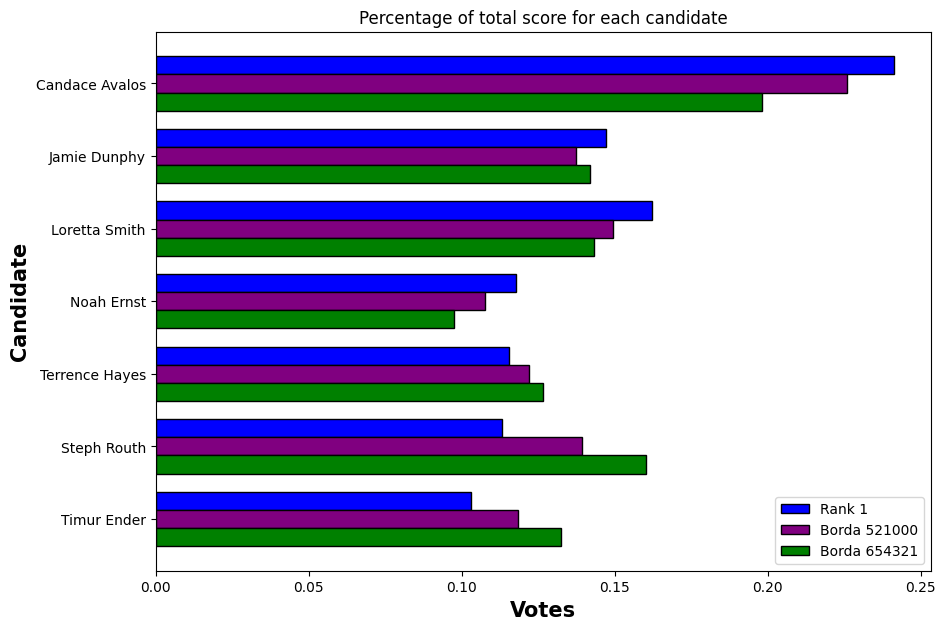

In [17]:
fig = plt.subplots(figsize =(10, len(D1_candidates)))

barWidth = 0.25

# Set position of bar on Y axis
br2 = np.arange(len(D1_candidates))
br1 = [x + barWidth for x in br2]
br3= [x - barWidth for x in br2]


rank1_plot = plt.barh(br1, rank1_pct, color = 'blue', height = barWidth, edgecolor = 'black')
borda521000_plot = plt.barh(br2, borda521000_pct, color= 'purple', height = barWidth, edgecolor = 'black')
borda654321_plot = plt.barh(br3, borda654321_pct, color= 'green', height = barWidth, edgecolor = 'black')

plt.title('Percentage of total score for each candidate')

plt.ylabel('Candidate', fontweight ='bold', fontsize = 15)
plt.xlabel('Votes', fontweight ='bold', fontsize = 15)
plt.yticks(ind, tuple(D1_candidates_reversed))

plt.legend((rank1_plot[0], borda521000_plot[0], borda654321_plot[0]), 
           ('Rank 1', 'Borda 521000', 'Borda 654321'))


plt.show()

### Construct voter percentage columns for each "election" (Rank 1, Borda, Ballot length):

In [18]:
for name in D1_candidates:
    D1_precincts_df[name + ' Rank 1 pct'] = D1_precincts_df[name + ' Condensed Rank 1']/D1_precincts_df['Condensed total votes']
    D1_precincts_df[name + ' Borda 654321 pct' ] = D1_precincts_df[name + ' Condensed Borda 654321']/D1_precincts_df['Condensed Borda 654321 total']
    D1_precincts_df[name + ' Borda 521000 pct' ] = D1_precincts_df[name + ' Condensed Borda 521000']/D1_precincts_df['Condensed Borda 521000 total']

for r in [1,2,3,4,5,6]:
    D1_precincts_df['Ballot length ' + str(r) + ' pct'] = D1_precincts_df['Ballot length ' + str(r)]/D1_precincts_df['Ballot length total']
    

### Do both Goodman's ER (with precincts weighted by population) and EI.
### For each candidate, do each minority racial group separately, as well as POC combined.

### Rank 1 scores:

Candace Avalos , Hispanic
Goodmans ER, weighted by population
        Est. fraction of Hispanic
        voters who voted for Candace Avalos is
        0.877
        Est. fraction of non- Hispanic
        voters who voted for Candace Avalos is
        0.120
        
Candace Avalos , Asian
Goodmans ER, weighted by population
        Est. fraction of Asian
        voters who voted for Candace Avalos is
        0.339
        Est. fraction of non- Asian
        voters who voted for Candace Avalos is
        0.169
        
Candace Avalos , Black
Goodmans ER, weighted by population
        Est. fraction of Black
        voters who voted for Candace Avalos is
        -0.227
        Est. fraction of non- Black
        voters who voted for Candace Avalos is
        0.235
        
Candace Avalos , AMIN
Goodmans ER, weighted by population
        Est. fraction of AMIN
        voters who voted for Candace Avalos is
        1.098
        Est. fraction of non- AMIN
        voters who voted for Candac

/opt/miniconda3/envs/gerry2024/lib/python3.12/site-packages/pyei/goodmans_er.py:109: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


Goodmans ER, weighted by population
        Est. fraction of POC
        voters who voted for Steph Routh is
        0.174
        Est. fraction of non- POC
        voters who voted for Steph Routh is
        0.044
        
Timur Ender , Hispanic
Goodmans ER, weighted by population
        Est. fraction of Hispanic
        voters who voted for Timur Ender is
        0.107
        Est. fraction of non- Hispanic
        voters who voted for Timur Ender is
        0.080
        
Timur Ender , Asian
Goodmans ER, weighted by population
        Est. fraction of Asian
        voters who voted for Timur Ender is
        0.110
        Est. fraction of non- Asian
        voters who voted for Timur Ender is
        0.078
        
Timur Ender , Black
Goodmans ER, weighted by population
        Est. fraction of Black
        voters who voted for Timur Ender is
        -0.027
        Est. fraction of non- Black
        voters who voted for Timur Ender is
        0.094
        
Timur Ender , AMIN
Goo

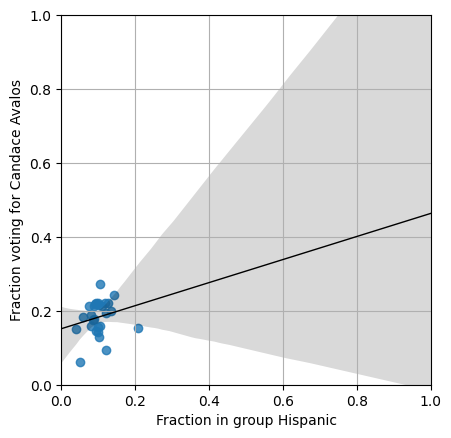

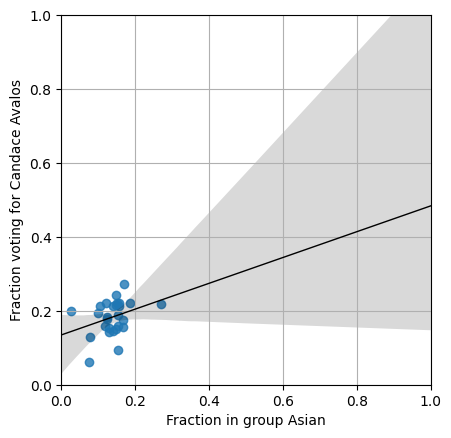

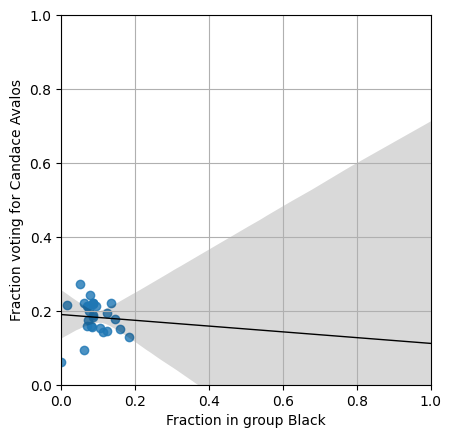

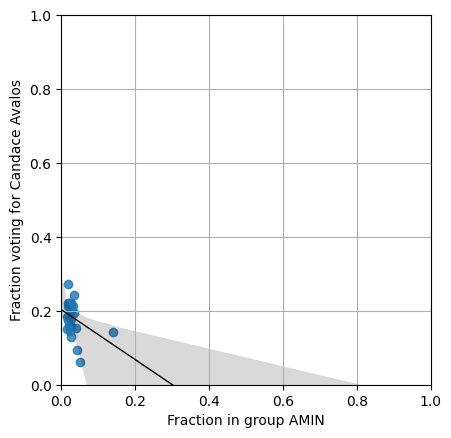

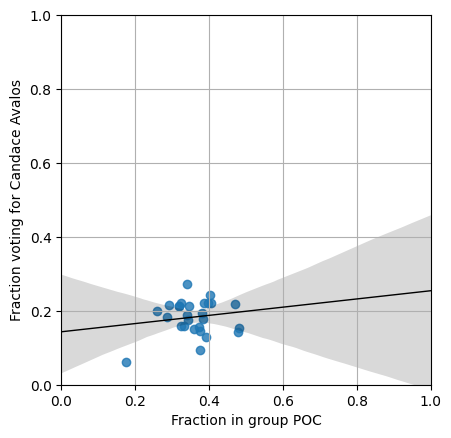

...

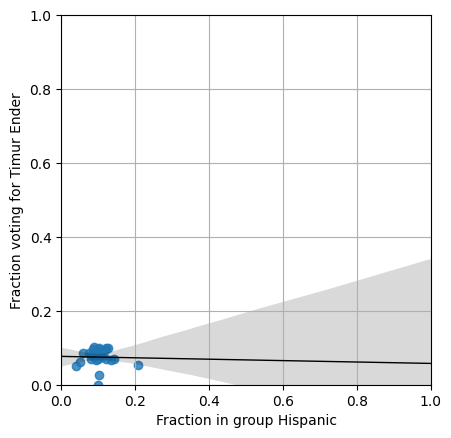

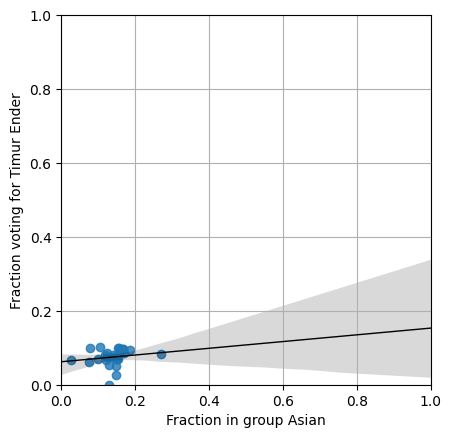

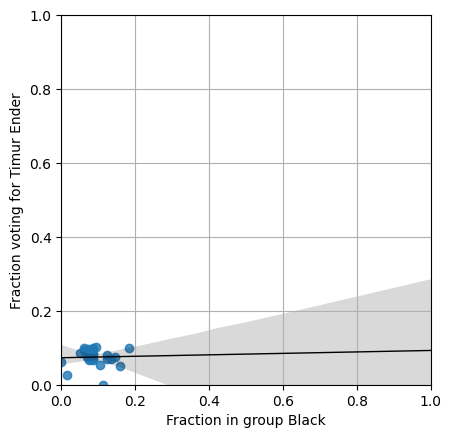

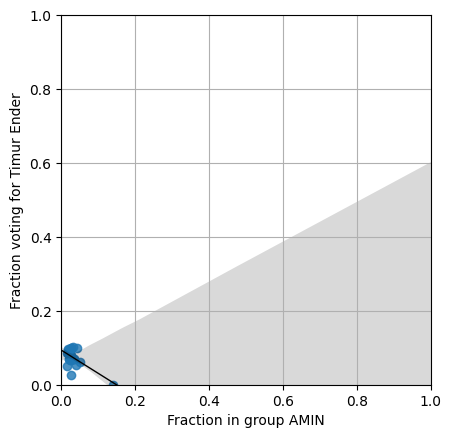

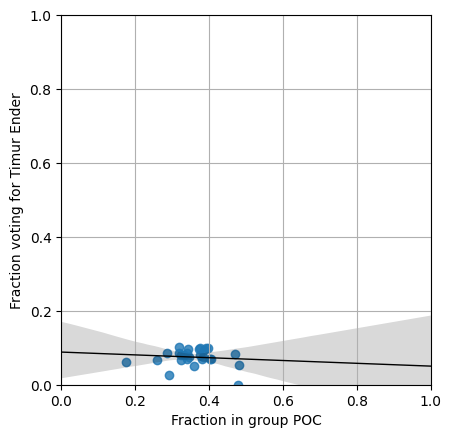

In [19]:
precinct_names = D1_precincts_df['Precinct']
demographic_groups = ["Hispanic", "Asian", "Black", "AMIN", "POC"]
election = "Rank 1"
election_total_votes = "Condensed total votes"

pop_pct_dict = {
    "Hispanic" : "HDVAP22 pct", 
    "Asian" : "AAPIDVAP22 pct", 
    "Black" : "BDVAP22 pct", 
    "AMIN": "AMINDVAP22 pct",
    "POC": "POCDVAP22 pct",
    "White" : "WDVAP22 pct"
}


for i in range(len(D1_candidates)):
    for demographic_group_name in demographic_groups:   
        candidate_name = D1_candidates[i]
        votes_fraction = np.array(D1_precincts_df[candidate_name + " " + election + " pct"])
        precinct_votes = np.array(D1_precincts_df[election_total_votes])

        print(candidate_name, ',', demographic_group_name)
        group_fraction = np.array(D1_precincts_df[pop_pct_dict[demographic_group_name]])

        # Fitting Goodman's ER - precincts weighted by population
        # Create a GoodmansER object
        goodmans_er = GoodmansER(is_weighted_regression=True)

        # Fit the model
        goodmans_er.fit(
            group_fraction,
            votes_fraction,
            precinct_votes,
            demographic_group_name=demographic_group_name,
            candidate_name=candidate_name
         )

        goodmans_er.plot(line_kws={"color":"black", "lw": 1})
        
        # Generate a simple report to summarize the results
        print(goodmans_er.summary())
    

### The plot still isn't matching the report. Just look at the first output:

Candace Avalos , Hispanic
Goodmans ER, weighted by population
        Est. fraction of Hispanic
        voters who voted for Candace Avalos is
        0.877
        Est. fraction of non- Hispanic
        voters who voted for Candace Avalos is
        0.120
        


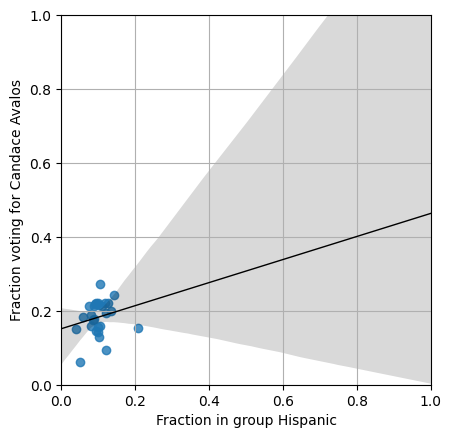

In [20]:
precinct_names = D1_precincts_df['Precinct']
demographic_groups = ["Hispanic", "Asian", "Black", "AMIN", "POC"]
election = "Rank 1"
election_total_votes = "Condensed total votes"

pop_pct_dict = {
    "Hispanic" : "HDVAP22 pct", 
    "Asian" : "AAPIDVAP22 pct", 
    "Black" : "BDVAP22 pct", 
    "AMIN": "AMINDVAP22 pct",
    "POC": "POCDVAP22 pct",
    "White" : "WDVAP22 pct"
}


for i in range(1):
    for demographic_group_name in demographic_groups[0:1]:   
        candidate_name = D1_candidates[i]
        votes_fraction = np.array(D1_precincts_df[candidate_name + " " + election + " pct"])
        precinct_votes = np.array(D1_precincts_df[election_total_votes])

        print(candidate_name, ',', demographic_group_name)
        group_fraction = np.array(D1_precincts_df[pop_pct_dict[demographic_group_name]])

        # Fitting Goodman's ER - precincts weighted by population
        # Create a GoodmansER object
        goodmans_er = GoodmansER(is_weighted_regression=True)

        # Fit the model
        goodmans_er.fit(
            group_fraction,
            votes_fraction,
            precinct_votes,
            demographic_group_name=demographic_group_name,
            candidate_name=candidate_name
         )

        goodmans_er.plot(line_kws={"color":"black", "lw": 1})
        
        # Generate a simple report to summarize the results
        print(goodmans_er.summary())
    

### Now do 2x2 EI, one candidate/election at a time.

Candace Avalos , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

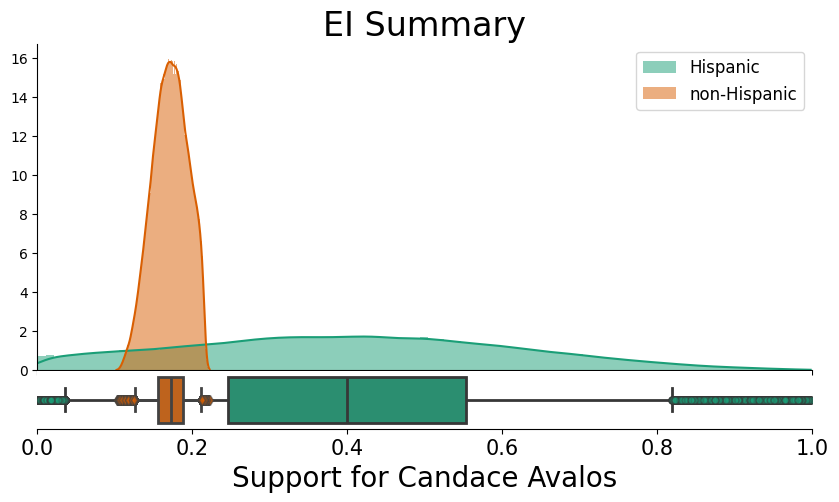

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Candace Avalos is
        0.403
        The posterior mean for the district-level voting preference of
        non-Hispanic for Candace Avalos is
        0.171
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Candace Avalos is
        [0.0352213  0.81930421]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Candace Avalos is
        [0.12603988 0.21135491]
        
Candace Avalos , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

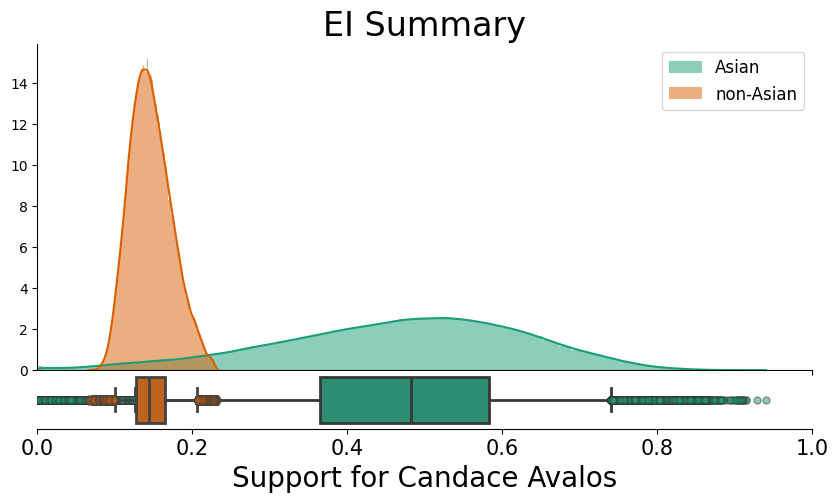

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Candace Avalos is
        0.468
        The posterior mean for the district-level voting preference of
        non-Asian for Candace Avalos is
        0.147
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Candace Avalos is
        [0.1262545  0.73966113]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Candace Avalos is
        [0.09993041 0.20540027]
        
Candace Avalos , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

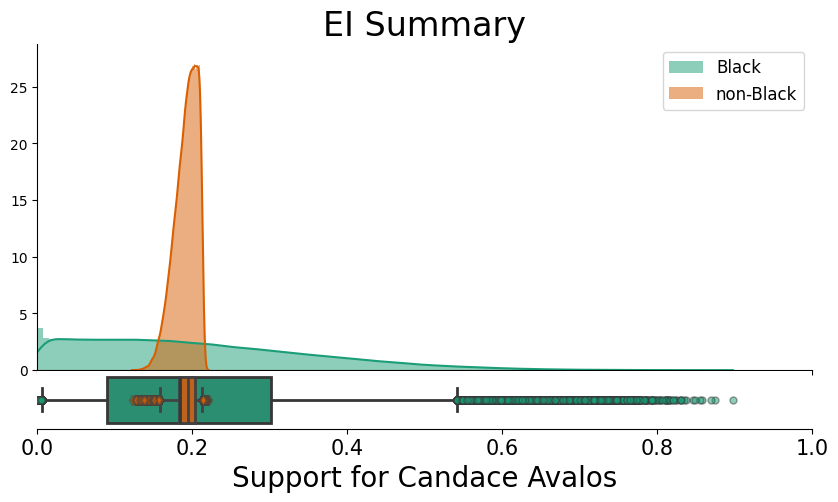

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Candace Avalos is
        0.208
        The posterior mean for the district-level voting preference of
        non-Black for Candace Avalos is
        0.192
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Candace Avalos is
        [0.00664664 0.54150911]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Candace Avalos is
        [0.15844807 0.21276659]
        
Candace Avalos , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

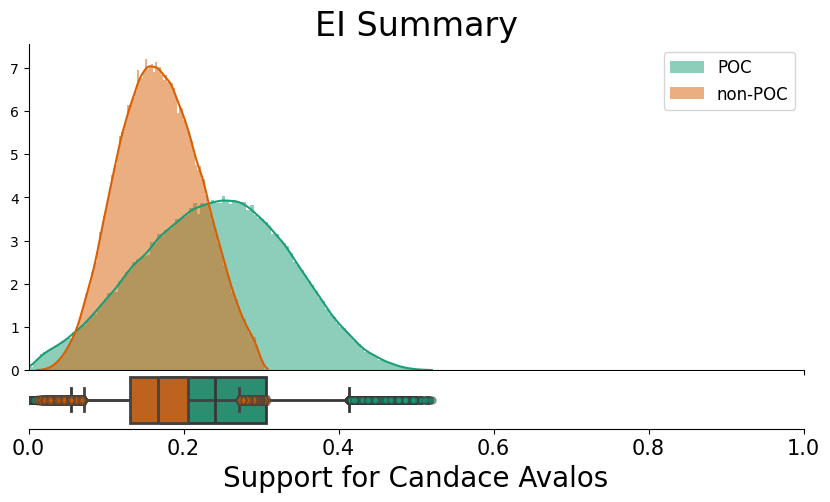

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Candace Avalos is
        0.239
        The posterior mean for the district-level voting preference of
        non-POC for Candace Avalos is
        0.169
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Candace Avalos is
        [0.05531072 0.41379076]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Candace Avalos is
        [0.07098169 0.27160728]
        
Jamie Dunphy , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

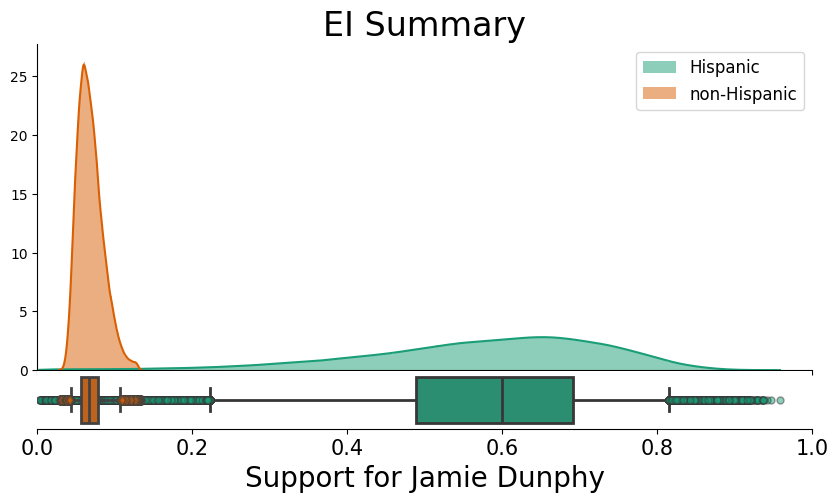

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Jamie Dunphy is
        0.578
        The posterior mean for the district-level voting preference of
        non-Hispanic for Jamie Dunphy is
        0.068
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Jamie Dunphy is
        [0.22317645 0.81497976]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Jamie Dunphy is
        [0.04294053 0.10699082]
        
Jamie Dunphy , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

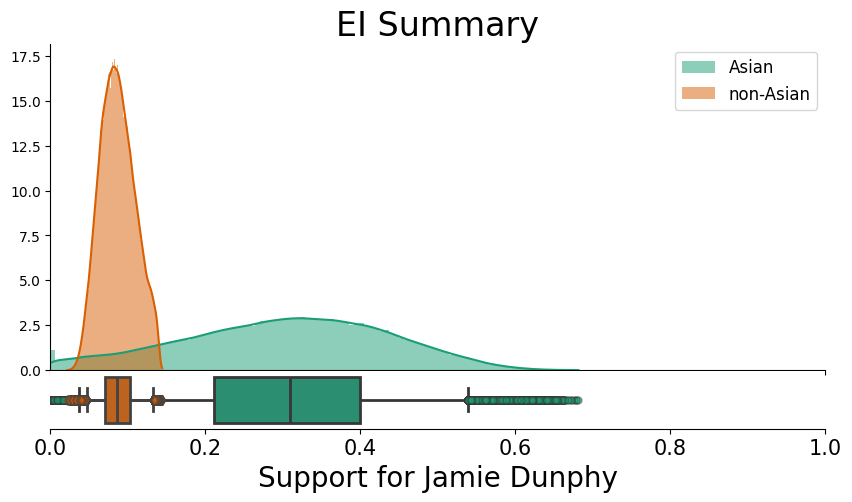

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Jamie Dunphy is
        0.302
        The posterior mean for the district-level voting preference of
        non-Asian for Jamie Dunphy is
        0.087
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Jamie Dunphy is
        [0.0364742  0.53866947]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Jamie Dunphy is
        [0.04650993 0.13235221]
        
Jamie Dunphy , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

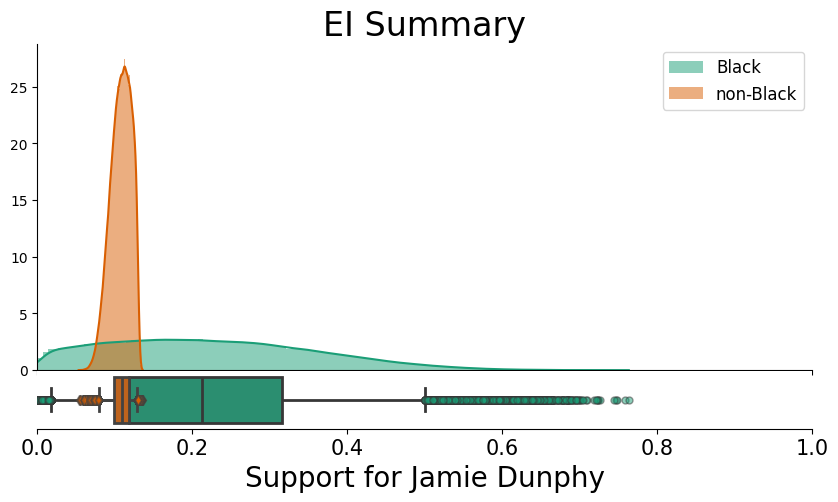

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Jamie Dunphy is
        0.224
        The posterior mean for the district-level voting preference of
        non-Black for Jamie Dunphy is
        0.108
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Jamie Dunphy is
        [0.01741996 0.50069276]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Jamie Dunphy is
        [0.08013267 0.12888653]
        
Jamie Dunphy , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

There were 12 divergences after tuning. Increase `target_accept` or reparameterize.


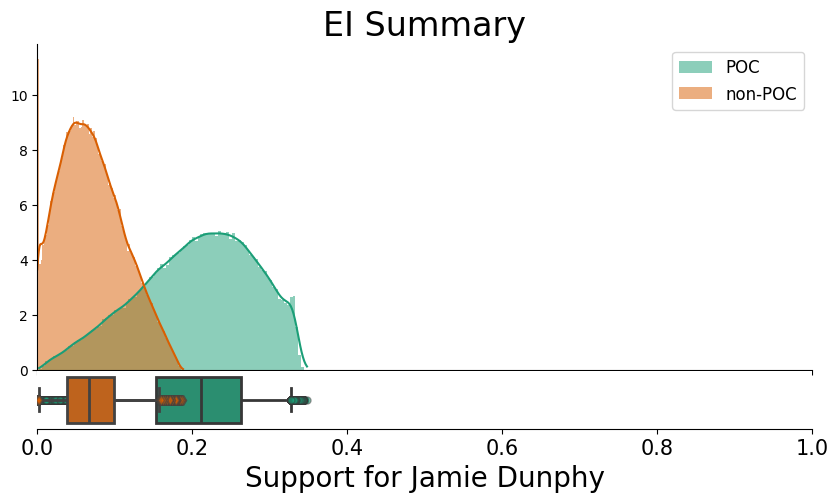

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Jamie Dunphy is
        0.205
        The posterior mean for the district-level voting preference of
        non-POC for Jamie Dunphy is
        0.070
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Jamie Dunphy is
        [0.0491855  0.32689859]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Jamie Dunphy is
        [0.00246661 0.15742612]
        
Loretta Smith , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

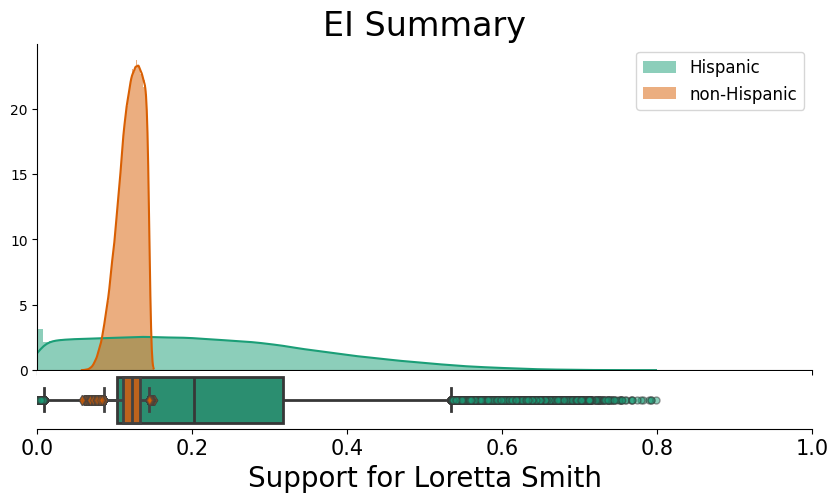

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Loretta Smith is
        0.220
        The posterior mean for the district-level voting preference of
        non-Hispanic for Loretta Smith is
        0.120
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Loretta Smith is
        [0.00819858 0.53393943]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Loretta Smith is
        [0.08642231 0.14366642]
        
Loretta Smith , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

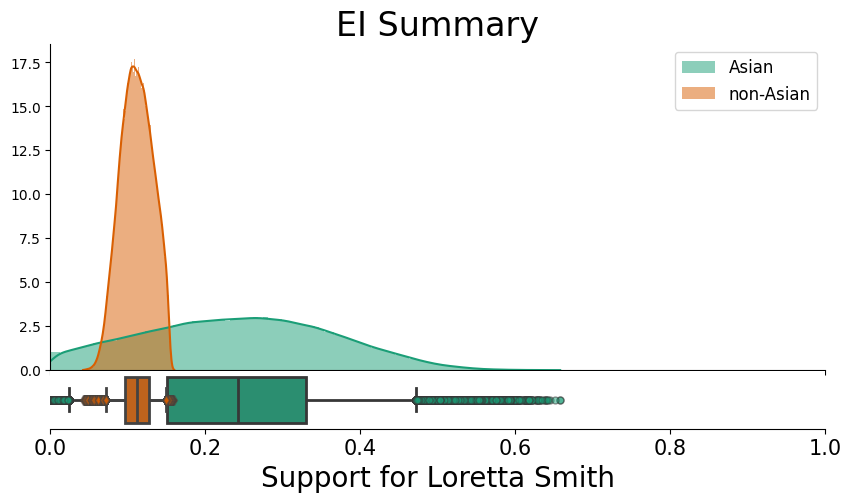

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Loretta Smith is
        0.241
        The posterior mean for the district-level voting preference of
        non-Asian for Loretta Smith is
        0.111
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Loretta Smith is
        [0.0241813  0.47161553]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Loretta Smith is
        [0.07205759 0.14868385]
        
Loretta Smith , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

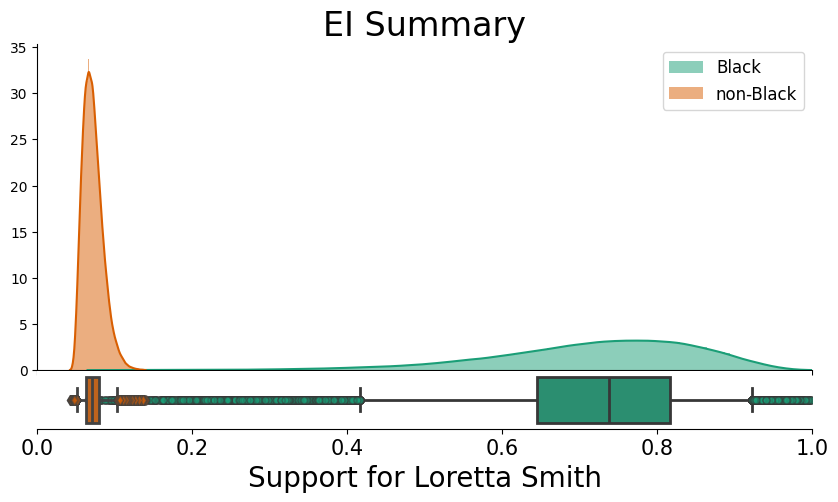

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Loretta Smith is
        0.720
        The posterior mean for the district-level voting preference of
        non-Black for Loretta Smith is
        0.072
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Loretta Smith is
        [0.415987   0.92150179]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Loretta Smith is
        [0.05173344 0.10223494]
        
Loretta Smith , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

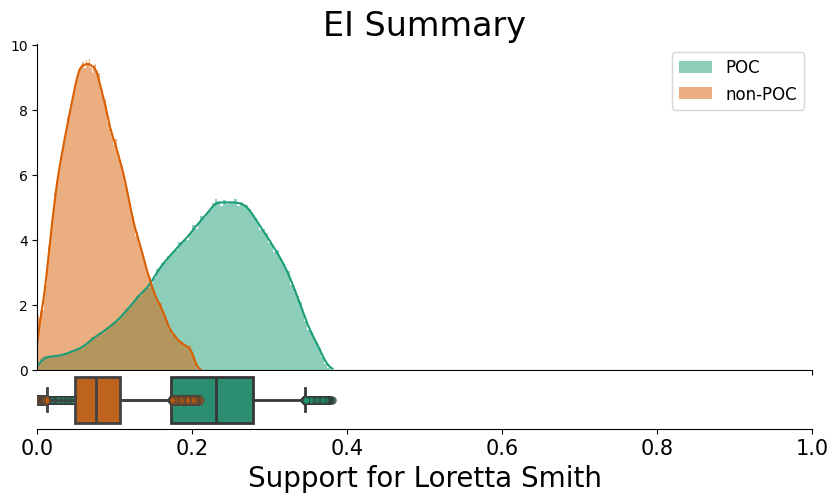

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Loretta Smith is
        0.222
        The posterior mean for the district-level voting preference of
        non-POC for Loretta Smith is
        0.080
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Loretta Smith is
        [0.05432001 0.34482312]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Loretta Smith is
        [0.01247254 0.17293752]
        
Noah Ernst , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

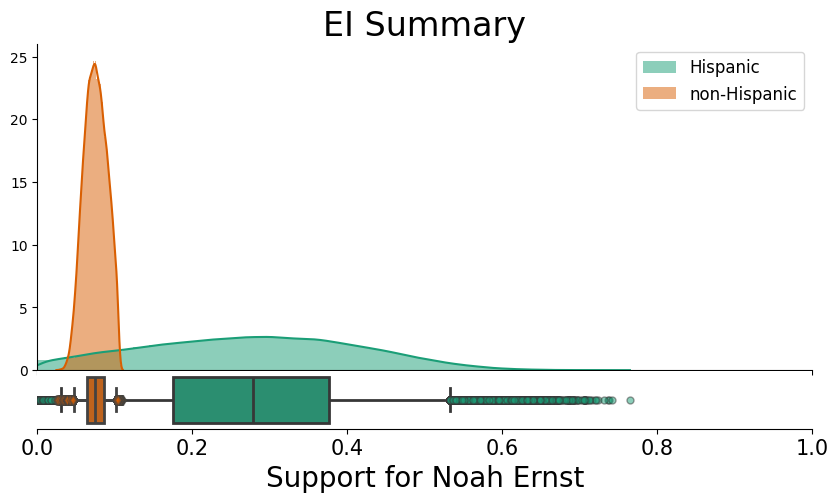

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Noah Ernst is
        0.277
        The posterior mean for the district-level voting preference of
        non-Hispanic for Noah Ernst is
        0.075
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Noah Ernst is
        [0.0310516  0.53227929]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Noah Ernst is
        [0.04751487 0.10171824]
        
Noah Ernst , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

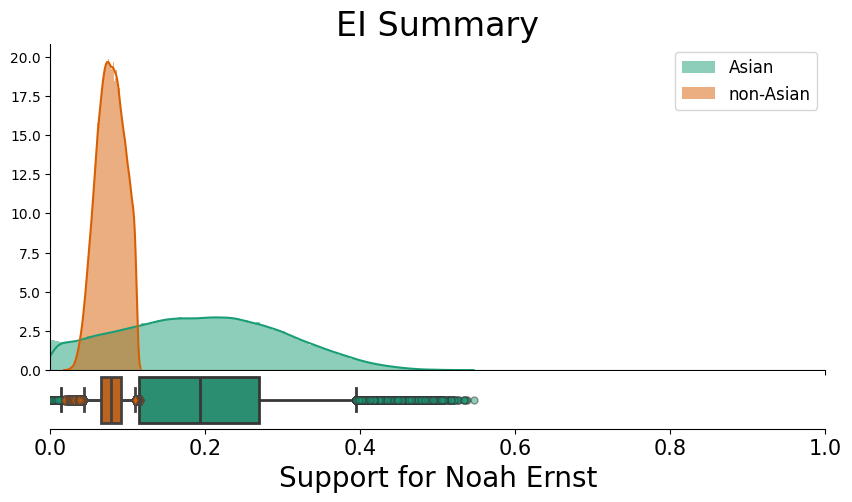

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Noah Ernst is
        0.194
        The posterior mean for the district-level voting preference of
        non-Asian for Noah Ernst is
        0.078
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Noah Ernst is
        [0.01356933 0.3944784 ]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Noah Ernst is
        [0.0436085  0.10878173]
        
Noah Ernst , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

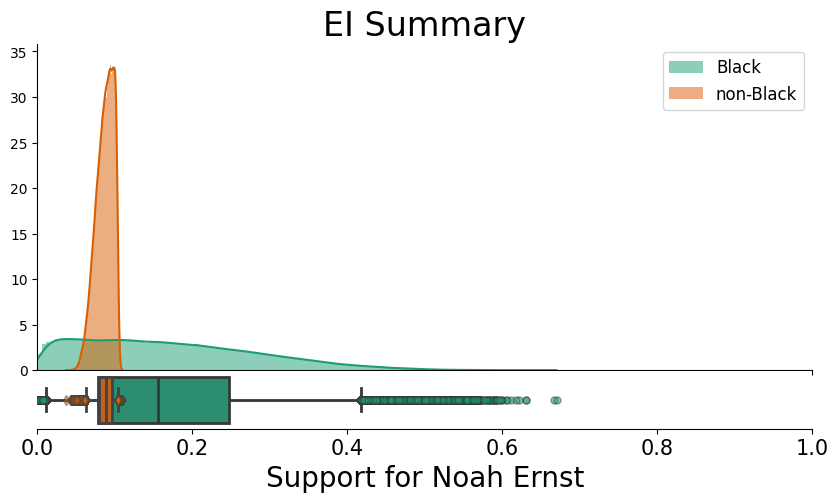

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Noah Ernst is
        0.171
        The posterior mean for the district-level voting preference of
        non-Black for Noah Ernst is
        0.087
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Noah Ernst is
        [0.01113193 0.41757873]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Noah Ernst is
        [0.06256226 0.10348988]
        
Noah Ernst , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

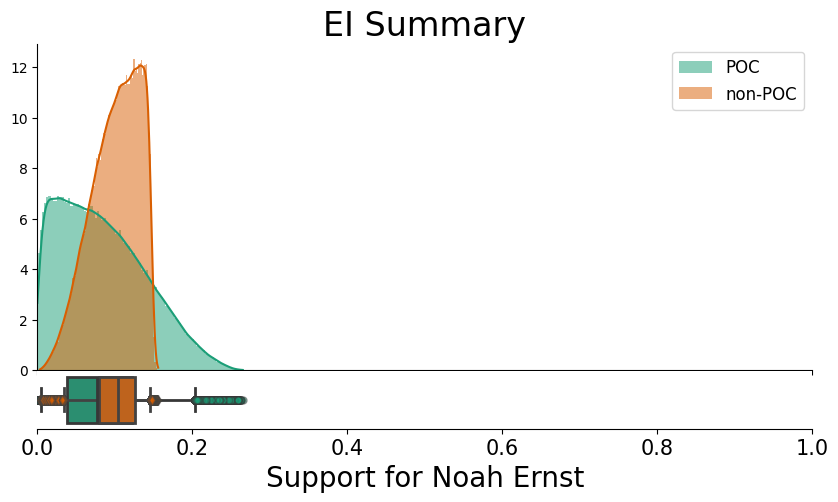

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Noah Ernst is
        0.084
        The posterior mean for the district-level voting preference of
        non-POC for Noah Ernst is
        0.101
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Noah Ernst is
        [0.00498578 0.20285057]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Noah Ernst is
        [0.03490309 0.1454445 ]
        
Terrence Hayes , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

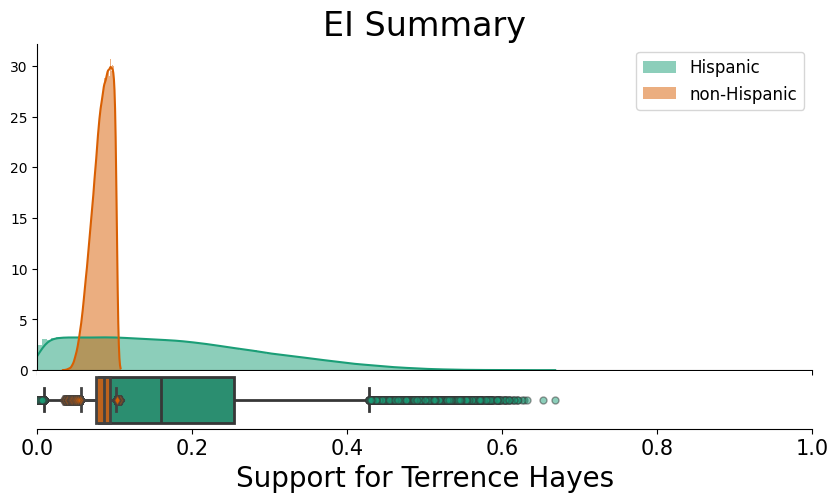

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Terrence Hayes is
        0.175
        The posterior mean for the district-level voting preference of
        non-Hispanic for Terrence Hayes is
        0.084
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Terrence Hayes is
        [0.00922229 0.42849428]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Terrence Hayes is
        [0.05640615 0.10210756]
        
Terrence Hayes , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

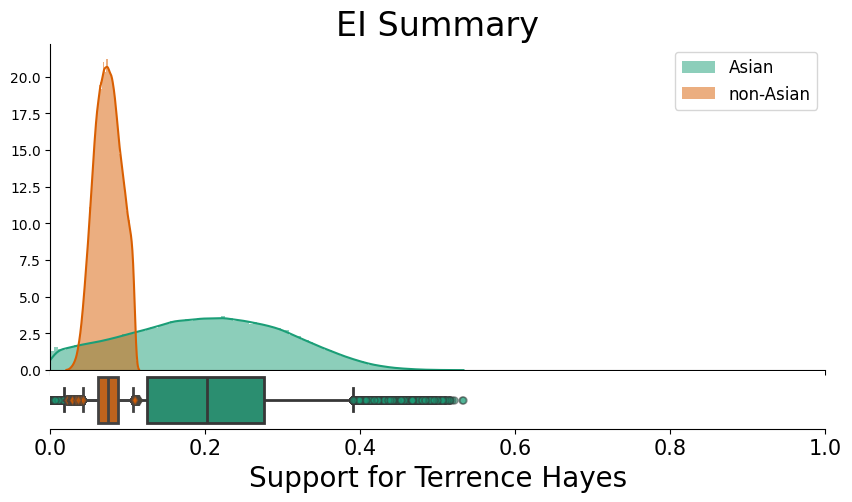

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Terrence Hayes is
        0.201
        The posterior mean for the district-level voting preference of
        non-Asian for Terrence Hayes is
        0.074
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Terrence Hayes is
        [0.01730408 0.39000041]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Terrence Hayes is
        [0.04233255 0.10585359]
        
Terrence Hayes , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

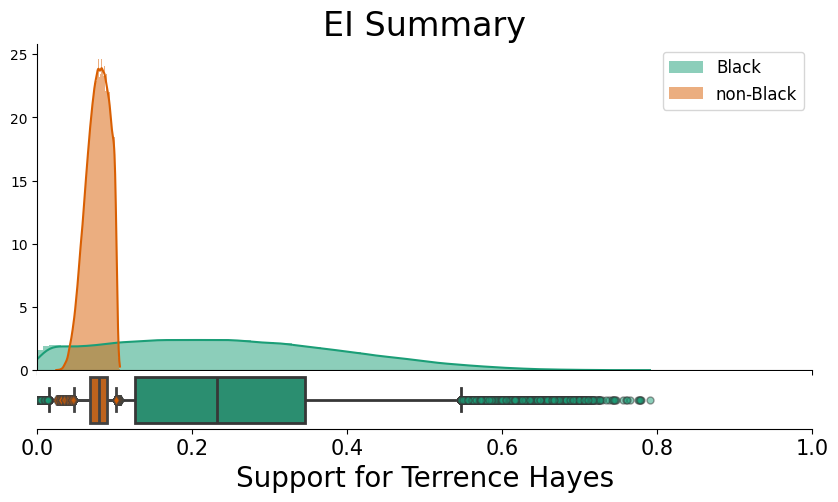

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Terrence Hayes is
        0.243
        The posterior mean for the district-level voting preference of
        non-Black for Terrence Hayes is
        0.078
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Terrence Hayes is
        [0.01442438 0.54616609]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Terrence Hayes is
        [0.04770534 0.10110701]
        
Terrence Hayes , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

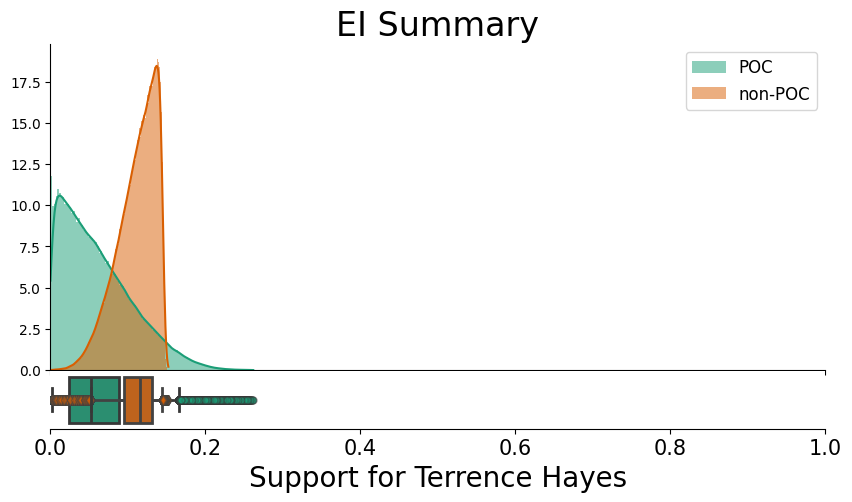

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Terrence Hayes is
        0.061
        The posterior mean for the district-level voting preference of
        non-POC for Terrence Hayes is
        0.111
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Terrence Hayes is
        [0.00210294 0.16616175]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Terrence Hayes is
        [0.05207103 0.14422271]
        
Steph Routh , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

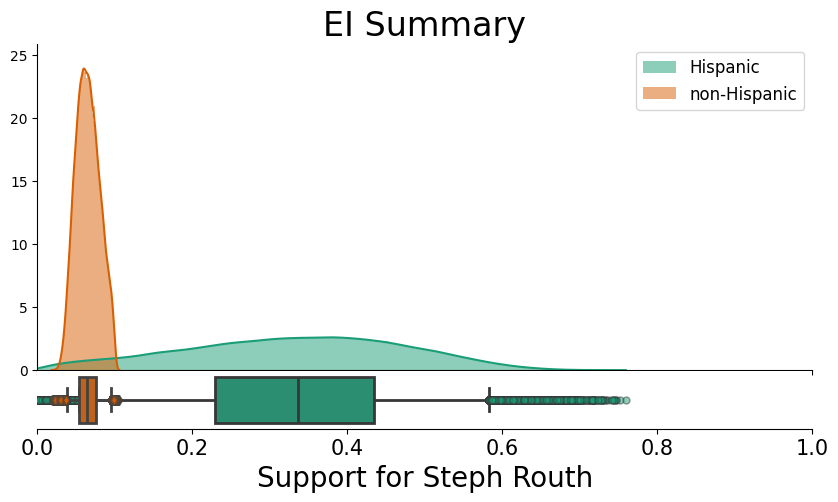

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Steph Routh is
        0.330
        The posterior mean for the district-level voting preference of
        non-Hispanic for Steph Routh is
        0.065
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Steph Routh is
        [0.05314387 0.582364  ]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Steph Routh is
        [0.03788697 0.09530646]
        
Steph Routh , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

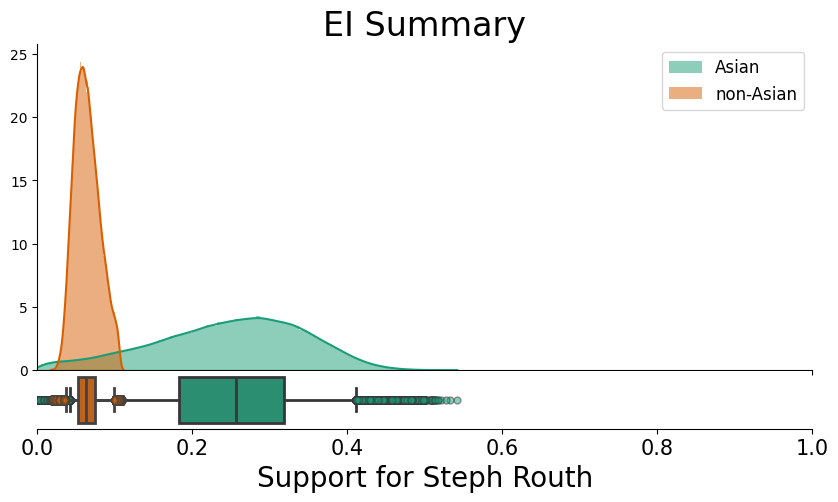

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Steph Routh is
        0.247
        The posterior mean for the district-level voting preference of
        non-Asian for Steph Routh is
        0.064
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Steph Routh is
        [0.04207634 0.41052583]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Steph Routh is
        [0.0364248  0.09935081]
        
Steph Routh , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

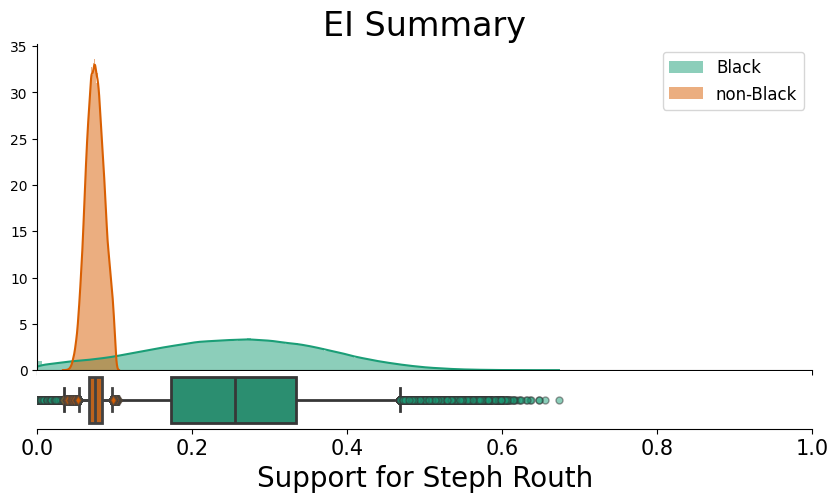

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Steph Routh is
        0.253
        The posterior mean for the district-level voting preference of
        non-Black for Steph Routh is
        0.075
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Steph Routh is
        [0.03409712 0.46784161]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Steph Routh is
        [0.05322882 0.09679779]
        
Steph Routh , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

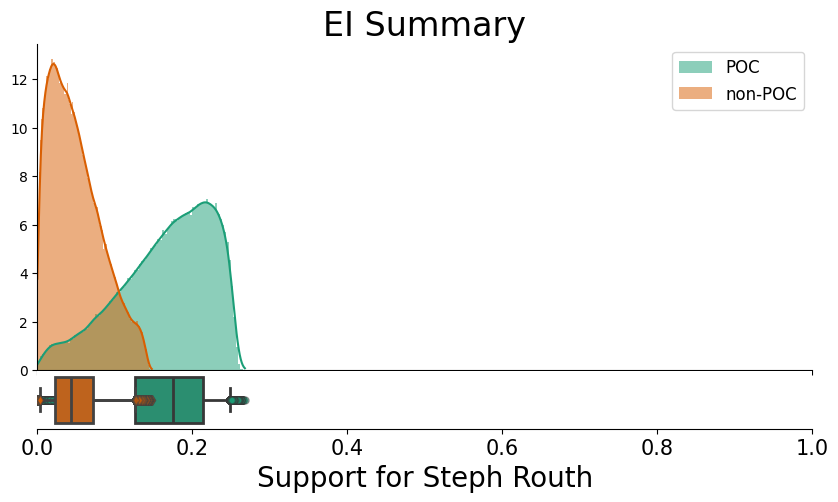

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Steph Routh is
        0.165
        The posterior mean for the district-level voting preference of
        non-POC for Steph Routh is
        0.050
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Steph Routh is
        [0.02931592 0.24883528]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Steph Routh is
        [0.00349133 0.12577547]
        
Timur Ender , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

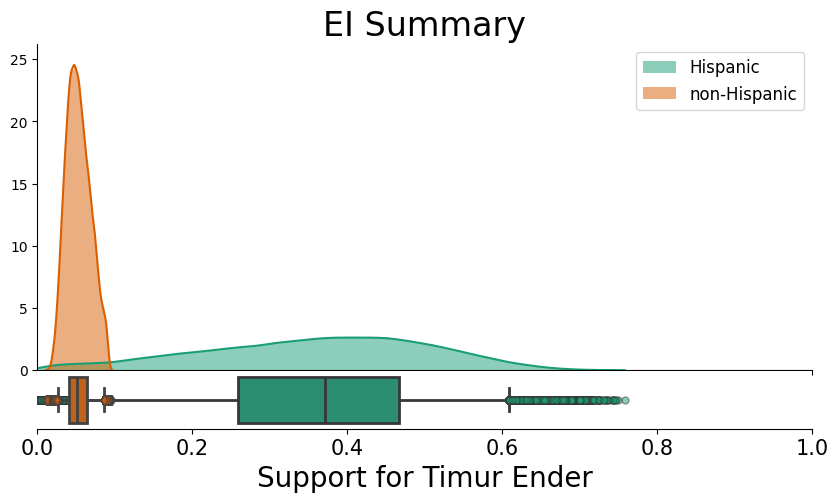

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Timur Ender is
        0.359
        The posterior mean for the district-level voting preference of
        non-Hispanic for Timur Ender is
        0.053
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Timur Ender is
        [0.05932246 0.60821884]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Timur Ender is
        [0.02643606 0.08546308]
        
Timur Ender , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

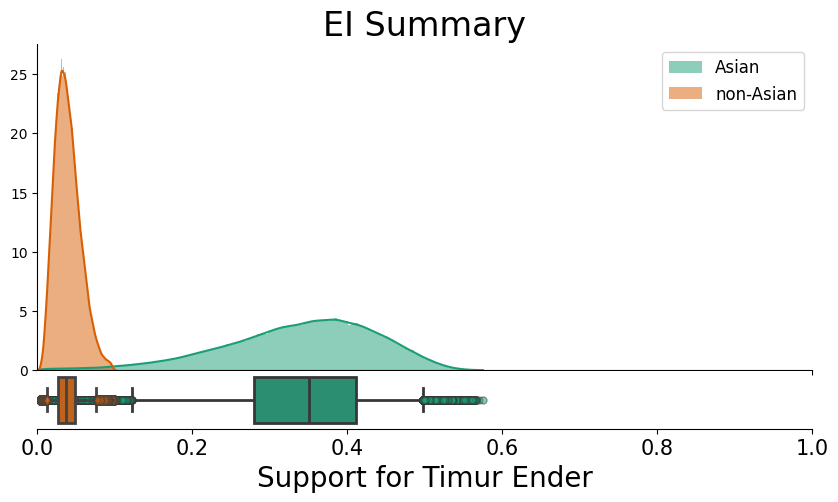

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Timur Ender is
        0.340
        The posterior mean for the district-level voting preference of
        non-Asian for Timur Ender is
        0.039
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Timur Ender is
        [0.12159513 0.49722065]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Timur Ender is
        [0.01284468 0.07627721]
        
Timur Ender , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

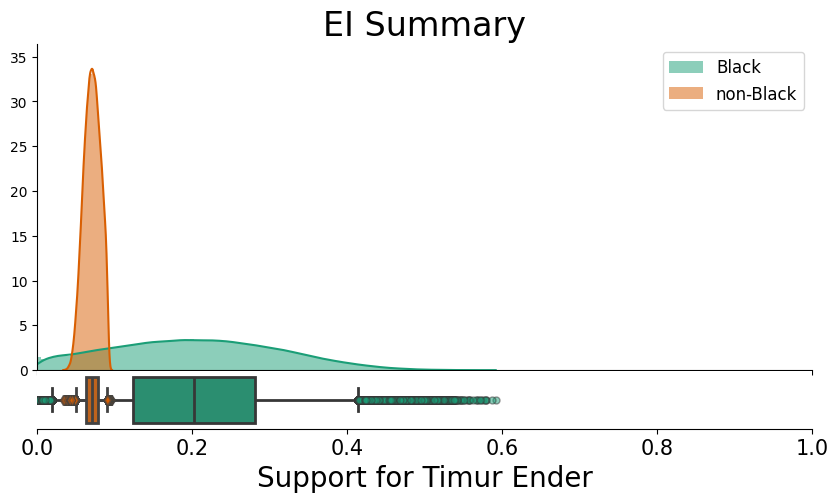

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Timur Ender is
        0.204
        The posterior mean for the district-level voting preference of
        non-Black for Timur Ender is
        0.071
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Timur Ender is
        [0.0185994  0.41325806]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Timur Ender is
        [0.04996594 0.08945242]
        
Timur Ender , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

There were 25 divergences after tuning. Increase `target_accept` or reparameterize.


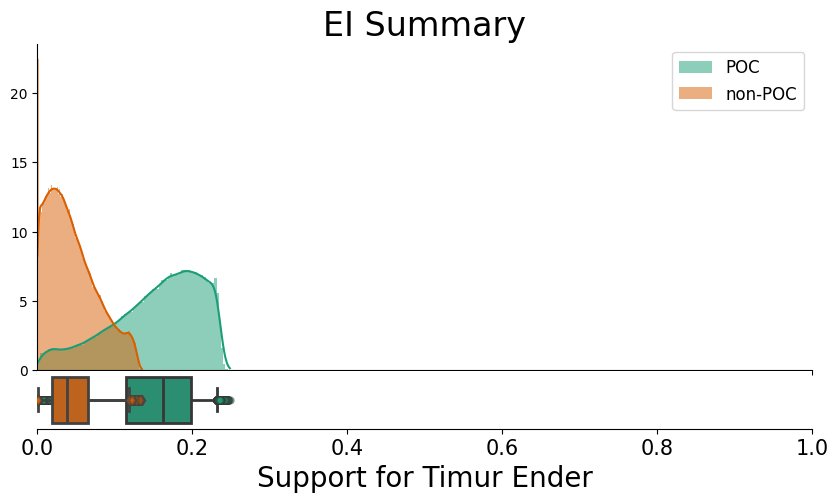

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Timur Ender is
        0.152
        The posterior mean for the district-level voting preference of
        non-POC for Timur Ender is
        0.045
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Timur Ender is
        [0.01993832 0.23243208]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Timur Ender is
        [0.00081505 0.11815523]
        
Other , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

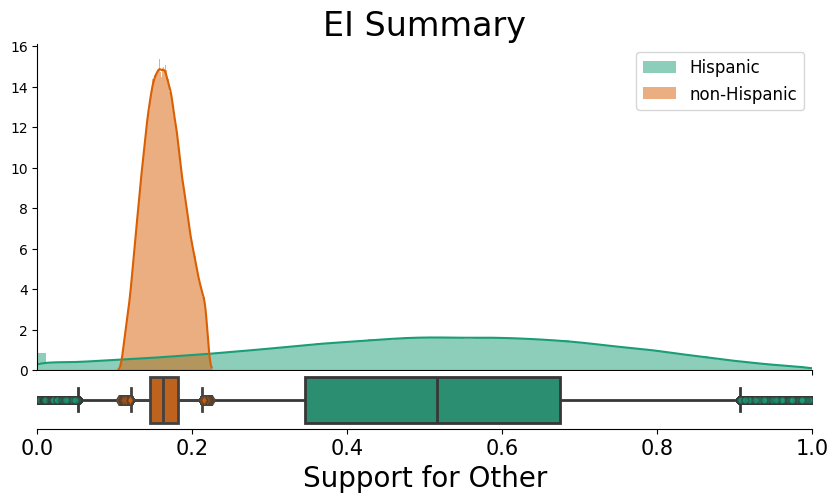

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Other is
        0.505
        The posterior mean for the district-level voting preference of
        non-Hispanic for Other is
        0.164
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Other is
        [0.0526665  0.90605802]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Other is
        [0.12012487 0.21261555]
        
Other , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

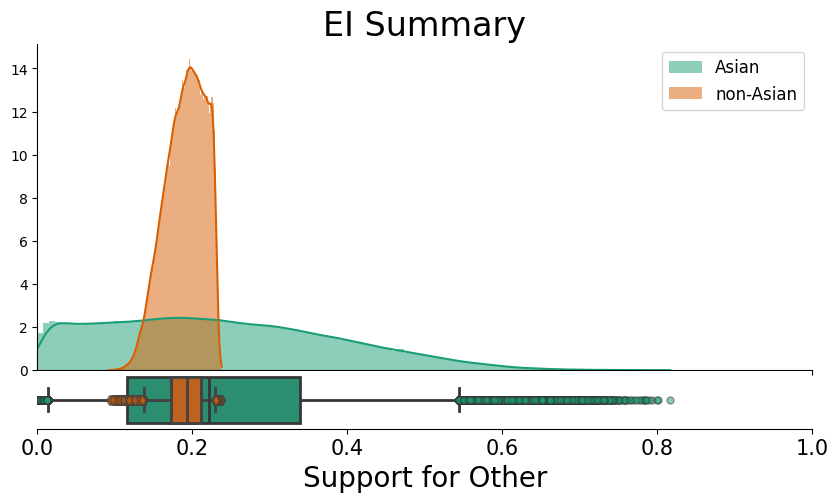

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Other is
        0.236
        The posterior mean for the district-level voting preference of
        non-Asian for Other is
        0.191
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Other is
        [0.01319205 0.54391036]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Other is
        [0.13764487 0.22915441]
        
Other , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

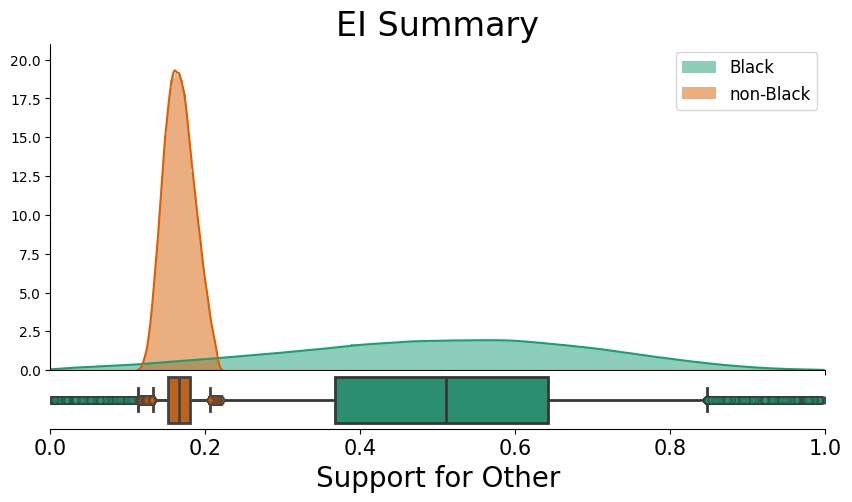

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Other is
        0.501
        The posterior mean for the district-level voting preference of
        non-Black for Other is
        0.166
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Other is
        [0.11350751 0.84708526]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Other is
        [0.13169228 0.20531547]
        
Other , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

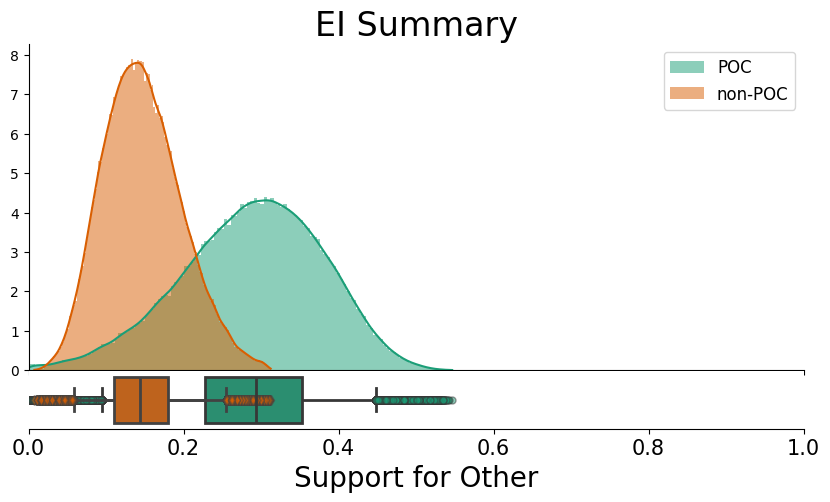

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Other is
        0.288
        The posterior mean for the district-level voting preference of
        non-POC for Other is
        0.147
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Other is
        [0.09429188 0.44846337]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Other is
        [0.05844399 0.25443337]
        


In [21]:
precinct_names = D1_precincts_df['Precinct']
demographic_groups = ["Hispanic", "Asian", "Black", "POC"]
election = "Rank 1"
election_total_votes = "Condensed total votes"

candidate_names = D1_candidates + ["Other"]
D1_precincts_df["Other " + election + " pct"] = 1 - D1_precincts_df[[name + " " + election + " pct" for name in D1_candidates]].sum(axis=1)

pop_pct_dict = {
    "Hispanic" : "HDVAP22 pct", 
    "Asian" : "AAPIDVAP22 pct", 
    "Black" : "BDVAP22 pct", 
    "POC": "POCDVAP22 pct",
    "White" : "WDVAP22 pct"
}


for i in range(len(candidate_names)):
    for demographic_group_name in demographic_groups:   
        candidate_name = candidate_names[i]
        votes_fraction = np.array(D1_precincts_df[candidate_name + " " + election + " pct"])
        precinct_votes = np.array(D1_precincts_df[election_total_votes])

        print(candidate_name, ',', demographic_group_name)
        group_fraction = np.array(D1_precincts_df[pop_pct_dict[demographic_group_name]])

        # Fitting a first 2 x 2 model

         # Create a TwobyTwoEI object
        ei_2by2 = TwoByTwoEI(model_name="king99_pareto_modification", pareto_scale=50, pareto_shape=10)

        # Fit the model
        ei_2by2.fit(group_fraction,
                votes_fraction,
                precinct_votes,
                demographic_group_name=demographic_group_name,
                candidate_name=candidate_name,
                precinct_names=precinct_names,
                draws=50000, # optional
                tune=10000, # optional
                target_accept=.999# optional
        )

        ei_2by2.plot()
        plt.show()

        # Plot the rhat and ess statistics and plot trace to see what's going on with these!
        #az.rhat(ei_2by2.sim_trace)
        #az.ess(ei_2by2.sim_trace)
        #az.plot_trace(ei_2by2.sim_trace, compact=True)

        # Generate a simple report to summarize the results
        print(ei_2by2.summary())

### Initial thoughts:

Individual non-White racial groups have terrible confidence intervals all around; grouping POC together is better.

That said, some candidates appear to do better with some racial groups:

- Avalos does okay with Hispanic, better with Asian, worse with Black; POC/White distributions have substantial overlap but she does slightly better with POC than with White.
- Dunphy does best with Hispanic, okay with Asian, and worse with Black; POC/White distributions have some overlap (but less than for Avalos) and he does better with POC than with White.
- Smith does very well with Black, worse with Hispanic and Asian; POC/White distributions have some overlap (but less than for Avalos) and she does better with POC than with White.
- Ernst doesn't do great with any minority group, but Hispanic is best; POC/White distributions have substantial overlap but he does slightly better with White than with POC.
- Hayes doesn't do great with any minority group, but Asian and Black are better than Hispanic; POC/White distributions have substantial overlap but he does slightly better with White than with POC.
- Routh does best with Hispanic, okay with Black and Asian; POC/White distributions have some overlap (but less than for Avalos) and she does better with POC than with White.
- Ender does okay with Hispanic and Asian, and worse with Black; POC/White distributions have some overlap (but less than for Avalos) and he does better with POC than with White.
- "Other" does well with Hispanic and Black but worse with Asian; POC/White distributions have substantial overlap but Other does slightly better with POC than with White.



### Would RxC be any clearer?  (Not likely!)

Running ['Hispanic', 'Asian', 'Black', 'White+Other'] x ['Candace Avalos', 'Jamie Dunphy', 'Loretta Smith', 'Noah Ernst', 'Terrence Hayes', 'Steph Routh', 'Timur Ender', 'Other'] EI
r = 4 rows (demographic groups)
c = 8 columns (candidates or voting outcomes)
number of precincts = 27


  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

/opt/miniconda3/envs/gerry2024/lib/python3.12/site-packages/jax/_src/interpreters/mlir.py:910: UserWarning: Some donated buffers were not usable: ShapedArray(float64[4,50000,27,4,7]).
See an explanation at https://jax.readthedocs.io/en/latest/faq.html#buffer-donation.
  warnings.warn("Some donated buffers were not usable:"


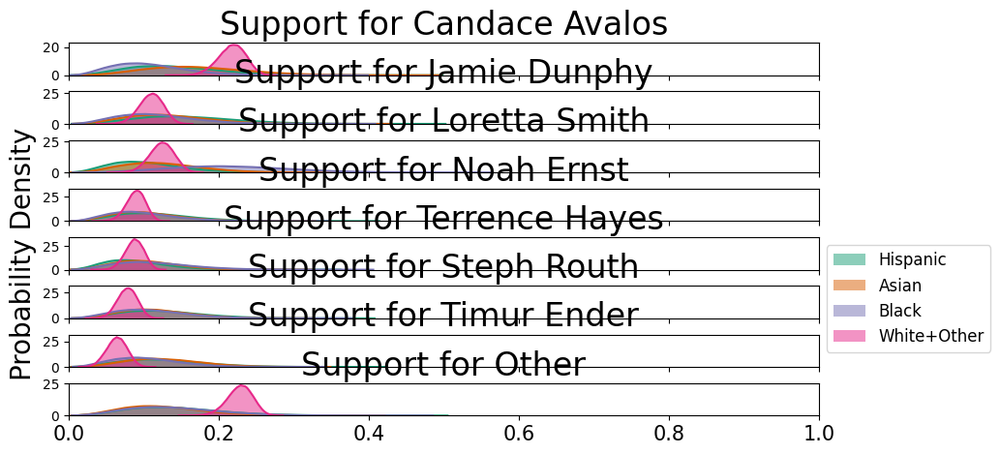


            Computed from the raw b_ samples by multiplying by group populations and then
            getting the proportion of the total pop
            (total pop=summed across all districts):
            The posterior mean for the district-level voting preference of
                Hispanic for Candace Avalos is
                0.141
                95% equal-tailed credible interval:  [0.0418595  0.27950571]
                The posterior mean for the district-level voting preference of
                Hispanic for Jamie Dunphy is
                0.157
                95% equal-tailed credible interval:  [0.04983213 0.29832549]
                The posterior mean for the district-level voting preference of
                Hispanic for Loretta Smith is
                0.104
                95% equal-tailed credible interval:  [0.02878372 0.21244857]
                The posterior mean for the district-level voting preference of
                Hispanic for Noah Ernst is
              

In [22]:
precinct_names = D1_precincts_df['Precinct']
demographic_group_names = ["Hispanic", "Asian", "Black", "White+Other"]
election = "Rank 1"
election_total_votes = "Condensed total votes"

candidate_names = D1_candidates + ["Other"]
D1_precincts_df["Other " + election + " pct"] = 1 - D1_precincts_df[[name + " " + election + " pct" for name in D1_candidates]].sum(axis=1)

D1_precincts_df['W+ODVAP22 pct'] = 1 - D1_precincts_df[['HDVAP22 pct', 'AAPIDVAP22 pct', 'BDVAP22 pct']].sum(axis=1)

votes_fractions = np.array(D1_precincts_df[[name + " " + election + " pct" for name in candidate_names]]).T
precinct_votes = np.array(D1_precincts_df[election_total_votes])

group_fractions = np.array(D1_precincts_df[['HDVAP22 pct', 'AAPIDVAP22 pct', 'BDVAP22 pct', 'W+ODVAP22 pct']]).T

ei = RowByColumnEI(model_name='multinomial-dirichlet')
ei.fit(group_fractions, votes_fractions, precinct_votes, demographic_group_names, candidate_names, draws=50000, target_accept=.999)

ei.plot()
plt.show()
print(ei.summary())

#ei.precinct_level_plot(D1_candidates[i])

### This doesn't look super usable.  What if we do it with POC combined?

Running ['POC', 'White'] x ['Candace Avalos', 'Jamie Dunphy', 'Loretta Smith', 'Noah Ernst', 'Terrence Hayes', 'Steph Routh', 'Timur Ender', 'Other'] EI
r = 2 rows (demographic groups)
c = 8 columns (candidates or voting outcomes)
number of precincts = 27


  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

/opt/miniconda3/envs/gerry2024/lib/python3.12/site-packages/jax/_src/interpreters/mlir.py:910: UserWarning: Some donated buffers were not usable: ShapedArray(float64[4,50000,27,2,7]).
See an explanation at https://jax.readthedocs.io/en/latest/faq.html#buffer-donation.
  warnings.warn("Some donated buffers were not usable:"


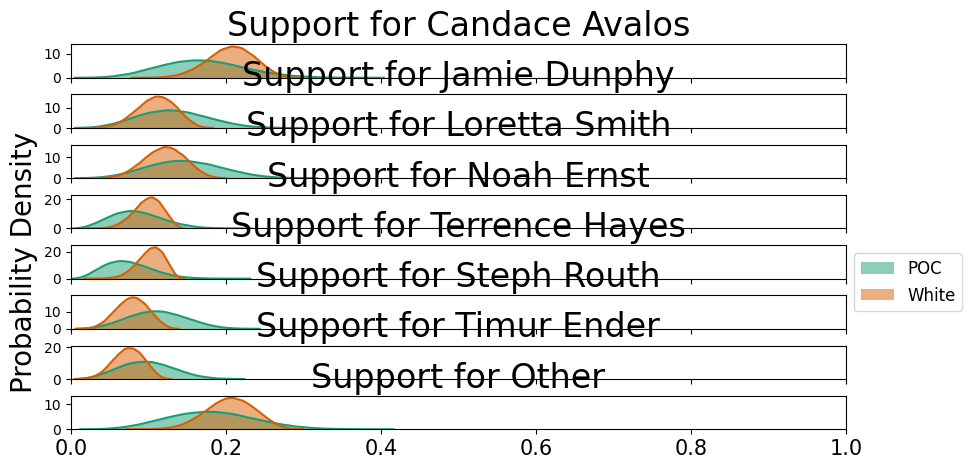


            Computed from the raw b_ samples by multiplying by group populations and then
            getting the proportion of the total pop
            (total pop=summed across all districts):
            The posterior mean for the district-level voting preference of
                POC for Candace Avalos is
                0.170
                95% equal-tailed credible interval:  [0.07152387 0.2799339 ]
                The posterior mean for the district-level voting preference of
                POC for Jamie Dunphy is
                0.132
                95% equal-tailed credible interval:  [0.0510445  0.22094106]
                The posterior mean for the district-level voting preference of
                POC for Loretta Smith is
                0.147
                95% equal-tailed credible interval:  [0.06023995 0.24073545]
                The posterior mean for the district-level voting preference of
                POC for Noah Ernst is
                0.085
            

In [23]:
precinct_names = D1_precincts_df['Precinct']
demographic_group_names = ["POC", "White"]
election = "Rank 1"
election_total_votes = "Condensed total votes"

candidate_names = D1_candidates + ["Other"]
D1_precincts_df["Other " + election + " pct"] = 1 - D1_precincts_df[[name + " " + election + " pct" for name in D1_candidates]].sum(axis=1)


votes_fractions = np.array(D1_precincts_df[[name + " " + election + " pct" for name in candidate_names]]).T
precinct_votes = np.array(D1_precincts_df[election_total_votes])

group_fractions = np.array(D1_precincts_df[['POCDVAP22 pct', 'WDVAP22 pct']]).T

ei = RowByColumnEI(model_name='multinomial-dirichlet')
ei.fit(group_fractions, votes_fractions, precinct_votes, demographic_group_names, candidate_names, draws=50000, target_accept=.999)

ei.plot()
plt.show()
print(ei.summary())

#ei.precinct_level_plot(D1_candidates[i])

### Not super informative!  Compared to 2x2 support for POC vs. White,
- Avalos has more POC support than White under 2x2, but reversed under 2xC. 
- Dunphy has more POC support under both models, but more pronounced under 2x2.
- Smith has more POC support under both models, but more pronounced under 2x2.
- Ernst has more White support under both models, with similar overlap.
- Hayes has more White support under both models, with similar overlap.
- Routh has more POC support under both models, but more pronounced under 2x2.
- Ender has more POC support under both models, but more pronounced under 2x2.
- Other has more POC support than White under 2x2, but reversed under 2xC. 




### Borda 654321 score:

### Goodman's ER, with plots.

Candace Avalos , Hispanic
Goodmans ER, weighted by population
        Est. fraction of Hispanic
        voters who voted for Candace Avalos is
        0.405
        Est. fraction of non- Hispanic
        voters who voted for Candace Avalos is
        0.118
        
Candace Avalos , Asian
Goodmans ER, weighted by population
        Est. fraction of Asian
        voters who voted for Candace Avalos is
        0.167
        Est. fraction of non- Asian
        voters who voted for Candace Avalos is
        0.142
        
Candace Avalos , Black
Goodmans ER, weighted by population
        Est. fraction of Black
        voters who voted for Candace Avalos is
        0.013
        Est. fraction of non- Black
        voters who voted for Candace Avalos is
        0.159
        
Candace Avalos , AMIN
Goodmans ER, weighted by population
        Est. fraction of AMIN
        voters who voted for Candace Avalos is
        0.814
        Est. fraction of non- AMIN
        voters who voted for Candace

/opt/miniconda3/envs/gerry2024/lib/python3.12/site-packages/pyei/goodmans_er.py:109: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


Goodmans ER, weighted by population
        Est. fraction of AMIN
        voters who voted for Steph Routh is
        0.846
        Est. fraction of non- AMIN
        voters who voted for Steph Routh is
        0.100
        
Steph Routh , POC
Goodmans ER, weighted by population
        Est. fraction of POC
        voters who voted for Steph Routh is
        0.157
        Est. fraction of non- POC
        voters who voted for Steph Routh is
        0.096
        
Timur Ender , Hispanic
Goodmans ER, weighted by population
        Est. fraction of Hispanic
        voters who voted for Timur Ender is
        0.212
        Est. fraction of non- Hispanic
        voters who voted for Timur Ender is
        0.085
        
Timur Ender , Asian
Goodmans ER, weighted by population
        Est. fraction of Asian
        voters who voted for Timur Ender is
        0.138
        Est. fraction of non- Asian
        voters who voted for Timur Ender is
        0.091
        
Timur Ender , Black
Goodman

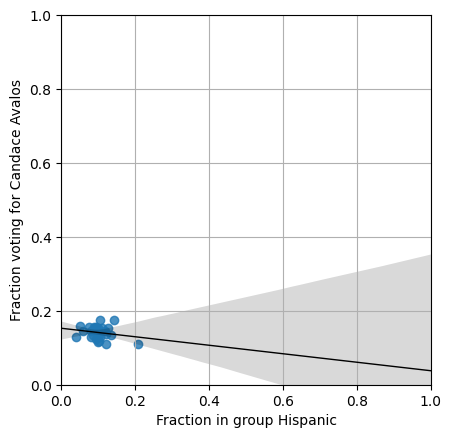

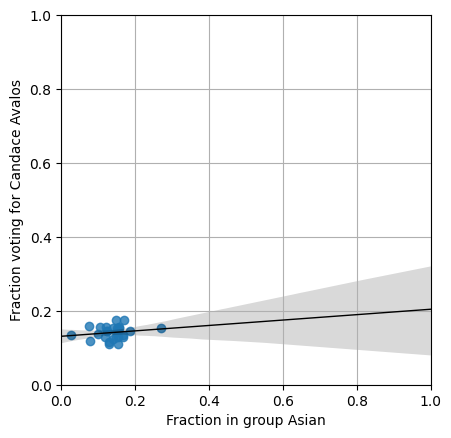

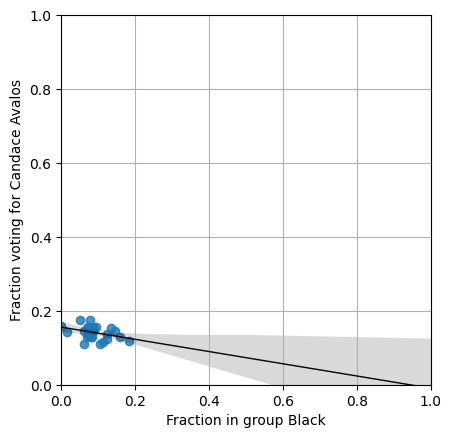

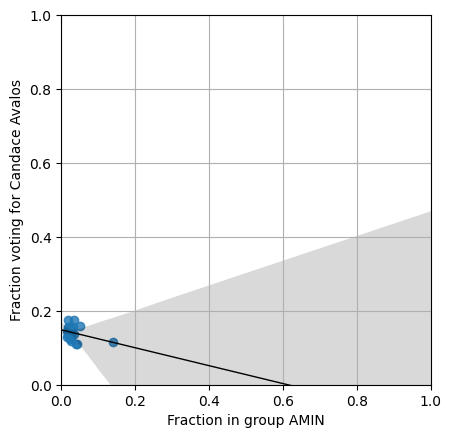

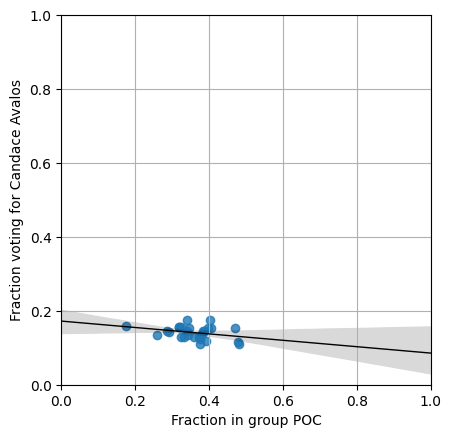

...

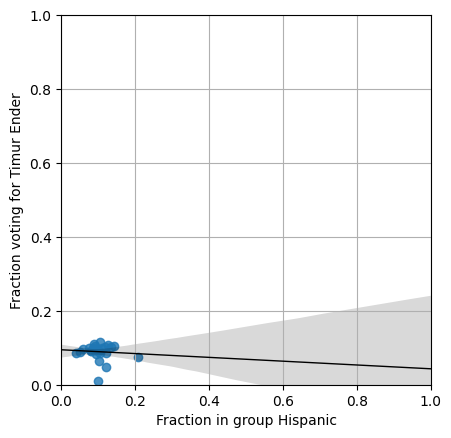

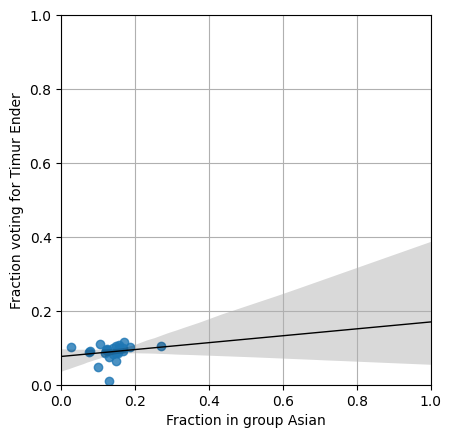

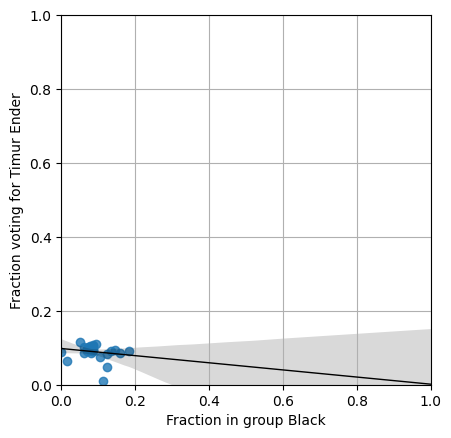

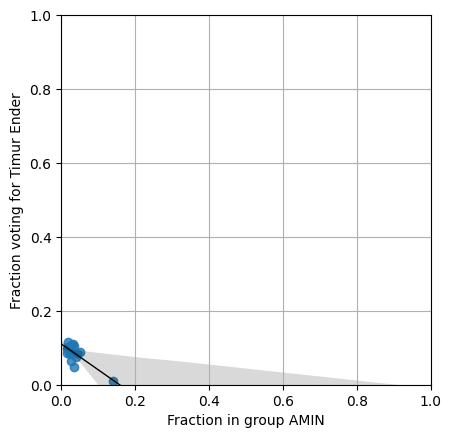

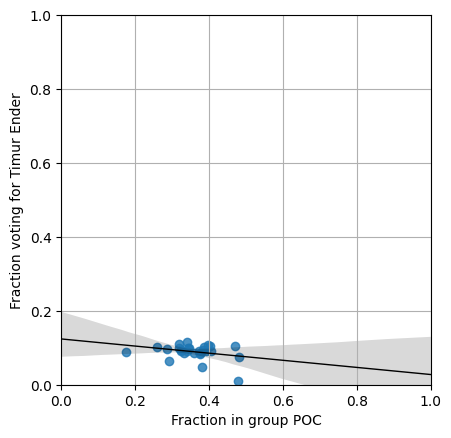

In [24]:
precinct_names = D1_precincts_df['Precinct']
demographic_groups = ["Hispanic", "Asian", "Black", "AMIN", "POC"]
election = "Borda 654321"
election_total_votes = "Condensed Borda 654321 total"


pop_pct_dict = {
    "Hispanic" : "HDVAP22 pct", 
    "Asian" : "AAPIDVAP22 pct", 
    "Black" : "BDVAP22 pct", 
    "AMIN": "AMINDVAP22 pct",
    "POC": "POCDVAP22 pct",
    "White" : "WDVAP22 pct"
}


for i in range(len(D1_candidates)):
    for demographic_group_name in demographic_groups:   
        candidate_name = D1_candidates[i]
        votes_fraction = np.array(D1_precincts_df[candidate_name + " " + election + " pct"])
        precinct_votes = np.array(D1_precincts_df[election_total_votes])

        print(candidate_name, ',', demographic_group_name)
        group_fraction = np.array(D1_precincts_df[pop_pct_dict[demographic_group_name]])

        # Fitting Goodman's ER - precincts weighted by population
        # Create a GoodmansER object
        goodmans_er = GoodmansER(is_weighted_regression=True)

        # Fit the model
        goodmans_er.fit(
            group_fraction,
            votes_fraction,
            precinct_votes,
            demographic_group_name=demographic_group_name,
            candidate_name=candidate_name
         )

        goodmans_er.plot(line_kws={"color":"black", "lw": 1})
        
        # Generate a simple report to summarize the results
        print(goodmans_er.summary())
    

### 2x2 EI:

Candace Avalos , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

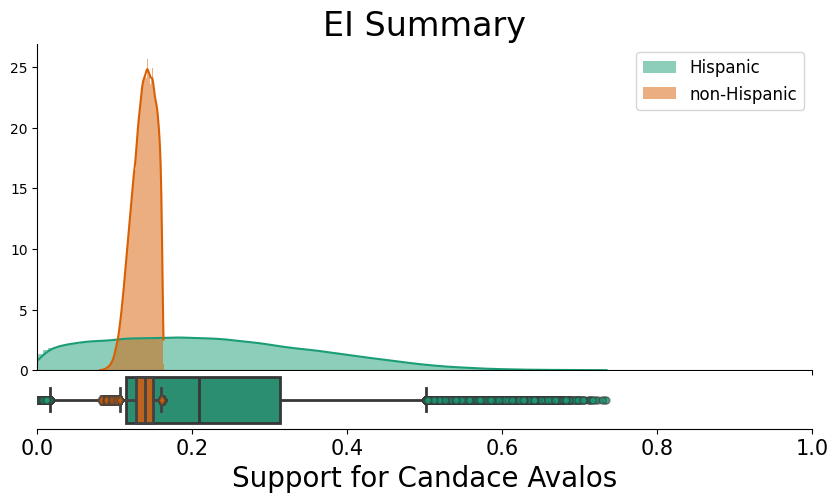

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Candace Avalos is
        0.221
        The posterior mean for the district-level voting preference of
        non-Hispanic for Candace Avalos is
        0.138
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Candace Avalos is
        [0.01610612 0.5013342 ]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Candace Avalos is
        [0.10711329 0.1598431 ]
        
Candace Avalos , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

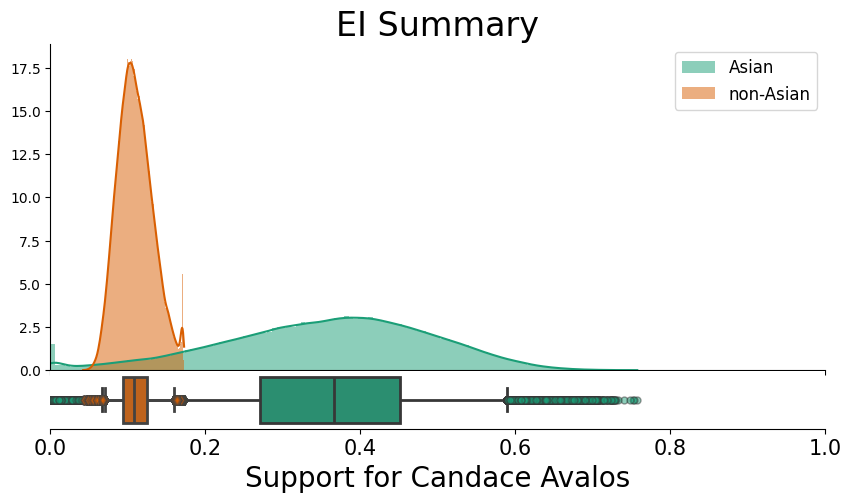

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Candace Avalos is
        0.356
        The posterior mean for the district-level voting preference of
        non-Asian for Candace Avalos is
        0.110
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Candace Avalos is
        [0.06617491 0.58914155]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Candace Avalos is
        [0.06991956 0.15942895]
        
Candace Avalos , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

There were 18821 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


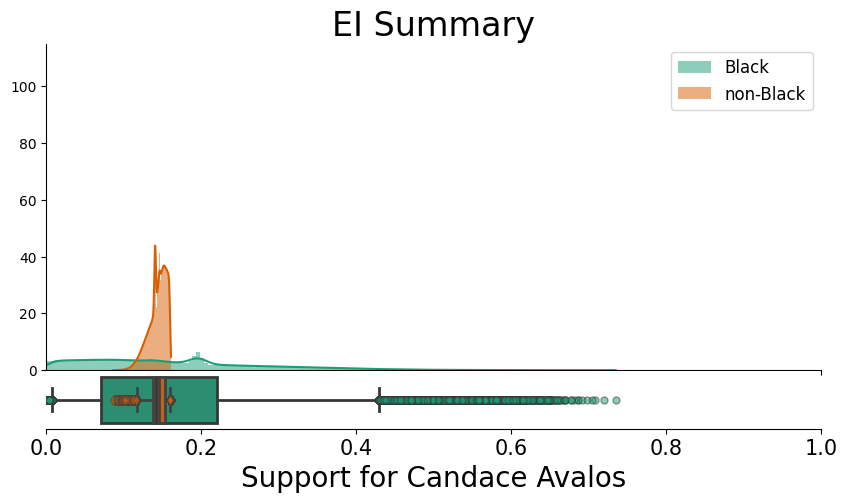

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Candace Avalos is
        0.161
        The posterior mean for the district-level voting preference of
        non-Black for Candace Avalos is
        0.144
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Candace Avalos is
        [0.00755812 0.42927907]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Candace Avalos is
        [0.11728136 0.15936246]
        
Candace Avalos , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

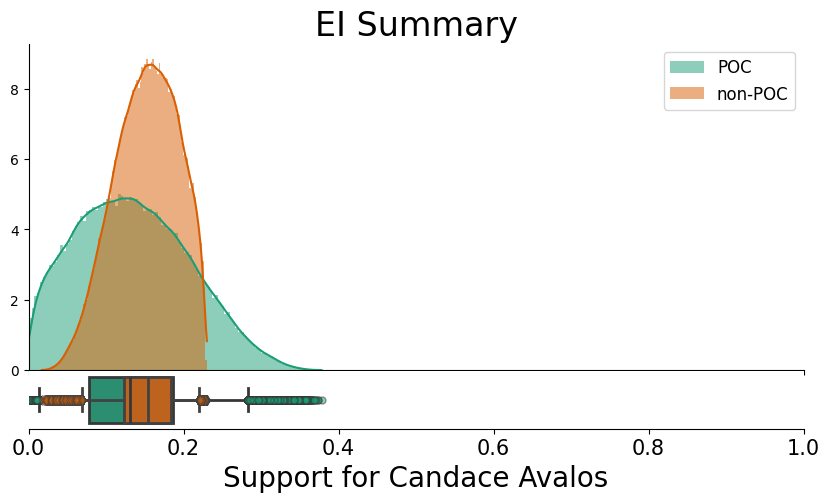

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Candace Avalos is
        0.135
        The posterior mean for the district-level voting preference of
        non-POC for Candace Avalos is
        0.152
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Candace Avalos is
        [0.0136309  0.28286862]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Candace Avalos is
        [0.06926088 0.22027121]
        
Jamie Dunphy , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

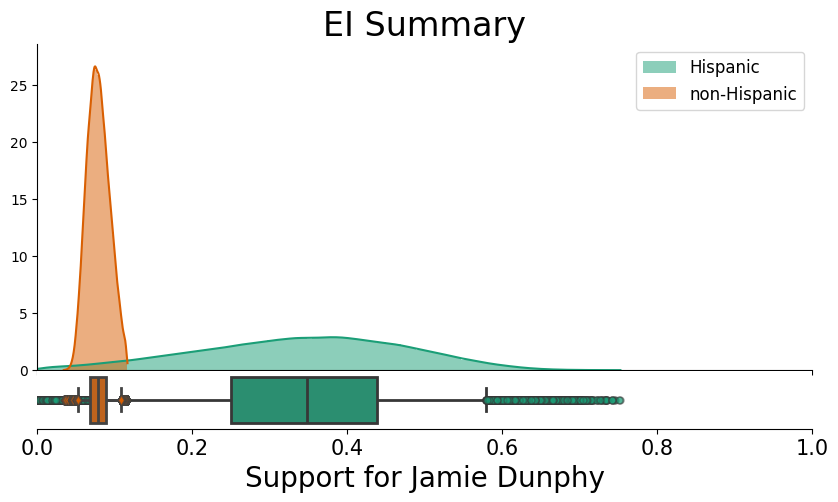

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Jamie Dunphy is
        0.342
        The posterior mean for the district-level voting preference of
        non-Hispanic for Jamie Dunphy is
        0.079
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Jamie Dunphy is
        [0.07234832 0.57952207]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Jamie Dunphy is
        [0.05285625 0.10784878]
        
Jamie Dunphy , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

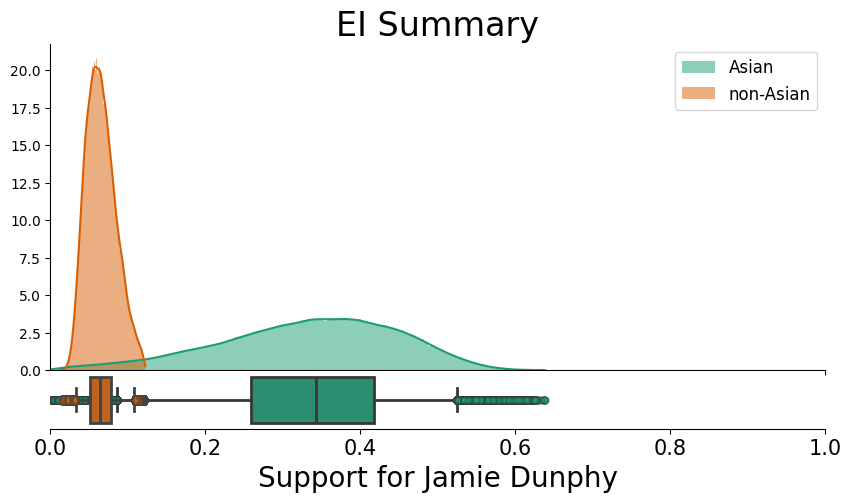

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Jamie Dunphy is
        0.333
        The posterior mean for the district-level voting preference of
        non-Asian for Jamie Dunphy is
        0.065
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Jamie Dunphy is
        [0.08573077 0.52488376]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Jamie Dunphy is
        [0.03313917 0.10747404]
        
Jamie Dunphy , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

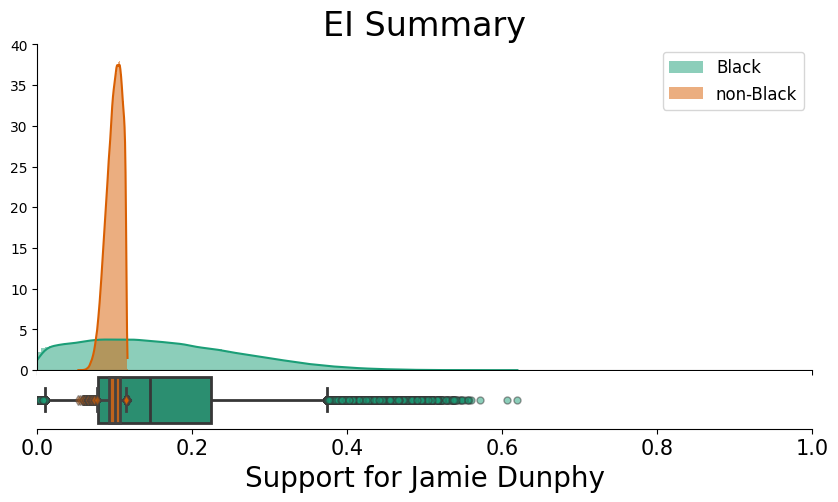

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Jamie Dunphy is
        0.157
        The posterior mean for the district-level voting preference of
        non-Black for Jamie Dunphy is
        0.099
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Jamie Dunphy is
        [0.01005069 0.37408578]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Jamie Dunphy is
        [0.07748282 0.11388855]
        
Jamie Dunphy , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

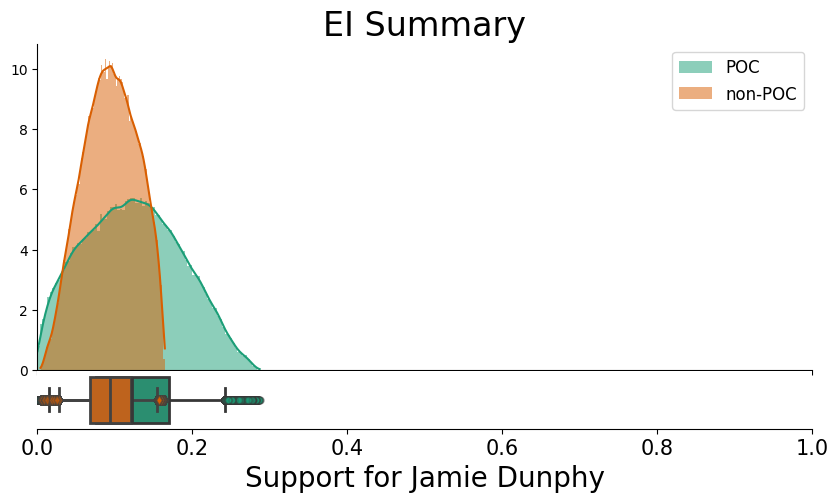

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Jamie Dunphy is
        0.124
        The posterior mean for the district-level voting preference of
        non-POC for Jamie Dunphy is
        0.094
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Jamie Dunphy is
        [0.01543487 0.24255625]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Jamie Dunphy is
        [0.02776149 0.15466117]
        
Loretta Smith , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

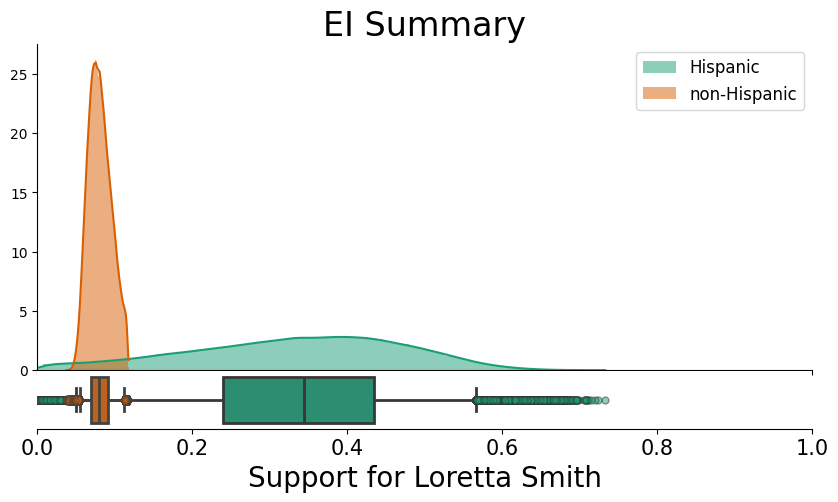

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Loretta Smith is
        0.333
        The posterior mean for the district-level voting preference of
        non-Hispanic for Loretta Smith is
        0.081
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Loretta Smith is
        [0.04945037 0.56583635]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Loretta Smith is
        [0.05564657 0.11139478]
        
Loretta Smith , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

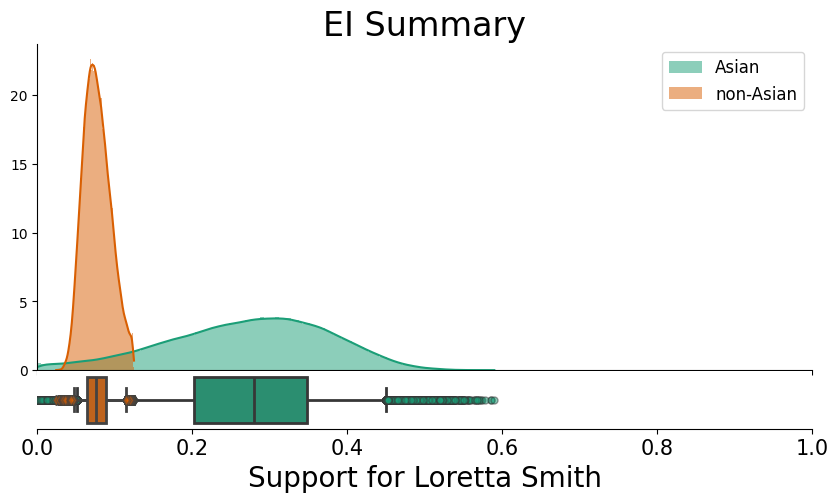

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Loretta Smith is
        0.272
        The posterior mean for the district-level voting preference of
        non-Asian for Loretta Smith is
        0.077
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Loretta Smith is
        [0.05169419 0.45028235]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Loretta Smith is
        [0.04687983 0.11470639]
        
Loretta Smith , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

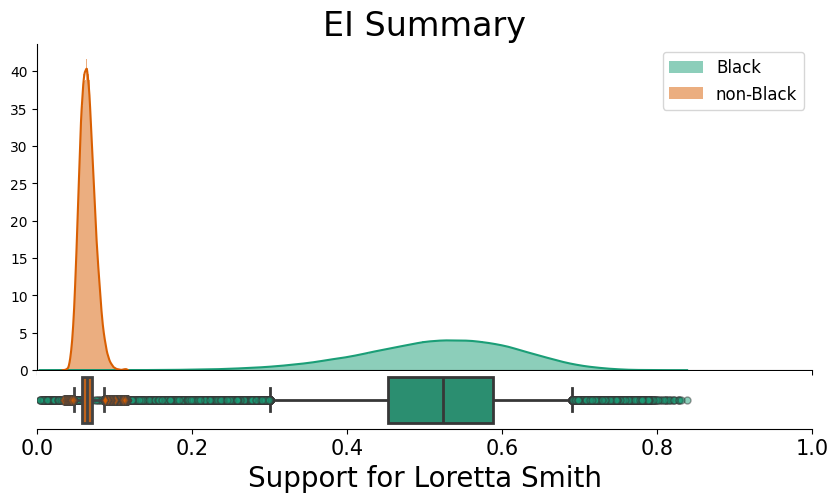

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Loretta Smith is
        0.516
        The posterior mean for the district-level voting preference of
        non-Black for Loretta Smith is
        0.065
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Loretta Smith is
        [0.29991745 0.69041775]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Loretta Smith is
        [0.0475488  0.08625055]
        
Loretta Smith , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


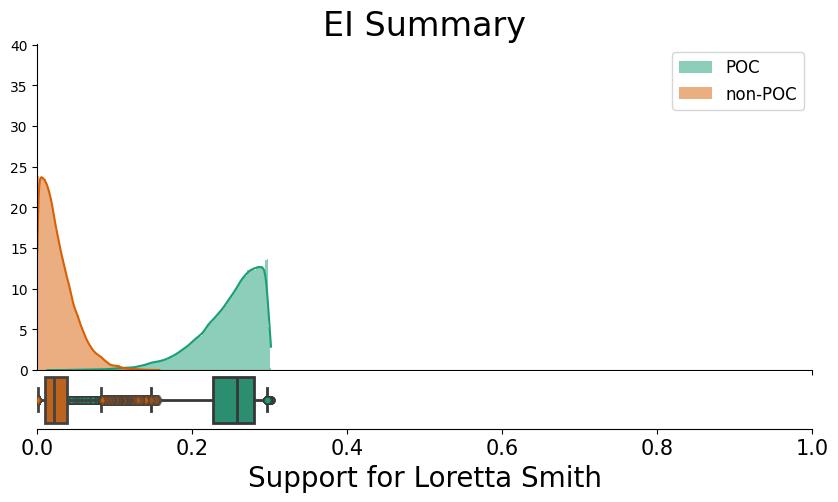

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Loretta Smith is
        0.248
        The posterior mean for the district-level voting preference of
        non-POC for Loretta Smith is
        0.027
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Loretta Smith is
        [0.14649642 0.29673812]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Loretta Smith is
        [0.0005168  0.08273901]
        
Noah Ernst , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

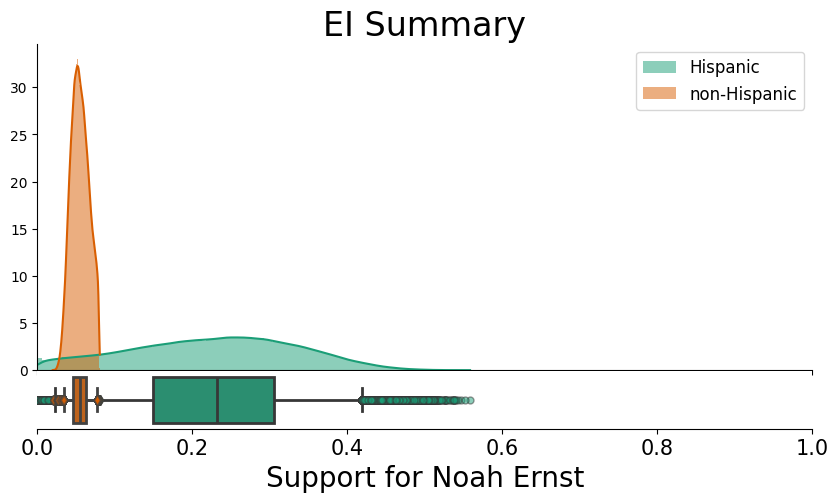

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Noah Ernst is
        0.226
        The posterior mean for the district-level voting preference of
        non-Hispanic for Noah Ernst is
        0.055
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Noah Ernst is
        [0.02254789 0.4190735 ]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Noah Ernst is
        [0.0344446  0.07710155]
        
Noah Ernst , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

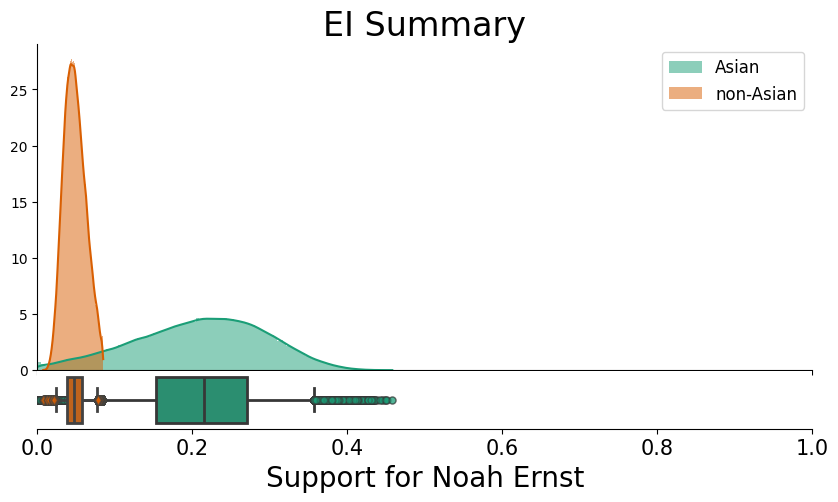

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Noah Ernst is
        0.210
        The posterior mean for the district-level voting preference of
        non-Asian for Noah Ernst is
        0.048
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Noah Ernst is
        [0.0392217 0.3570613]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Noah Ernst is
        [0.02374592 0.07744595]
        
Noah Ernst , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

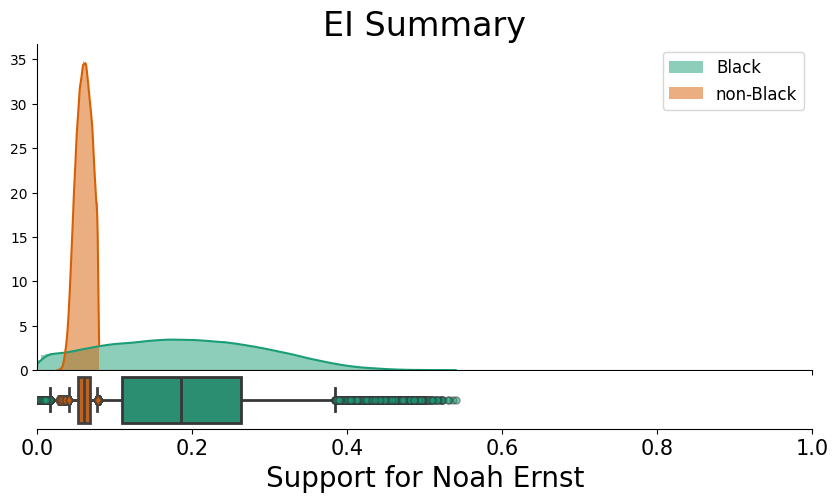

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Noah Ernst is
        0.188
        The posterior mean for the district-level voting preference of
        non-Black for Noah Ernst is
        0.060
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Noah Ernst is
        [0.0160514  0.38464376]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Noah Ernst is
        [0.04092298 0.07736446]
        
Noah Ernst , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

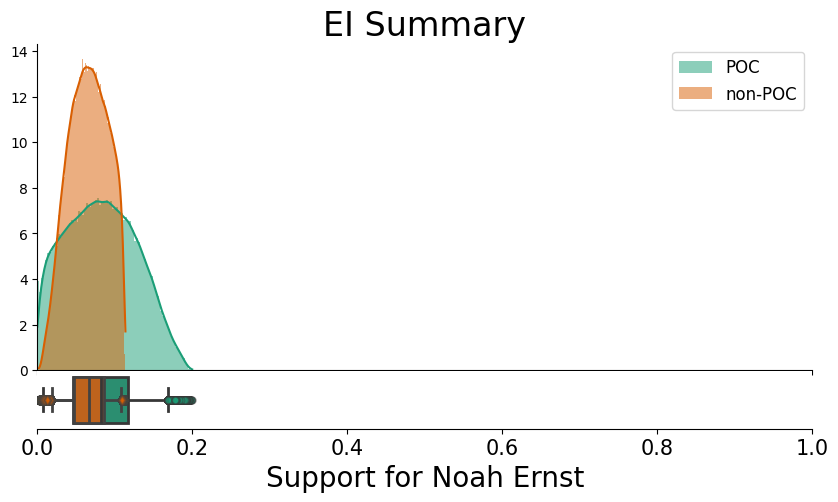

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Noah Ernst is
        0.083
        The posterior mean for the district-level voting preference of
        non-POC for Noah Ernst is
        0.066
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Noah Ernst is
        [0.00666464 0.16822699]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Noah Ernst is
        [0.01872261 0.10843042]
        
Terrence Hayes , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

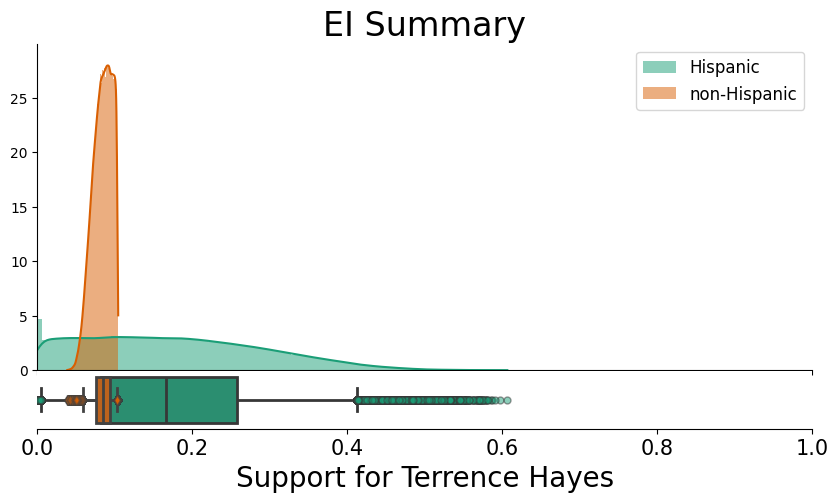

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Terrence Hayes is
        0.176
        The posterior mean for the district-level voting preference of
        non-Hispanic for Terrence Hayes is
        0.084
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Terrence Hayes is
        [0.00474566 0.41233619]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Terrence Hayes is
        [0.05844668 0.10247023]
        
Terrence Hayes , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

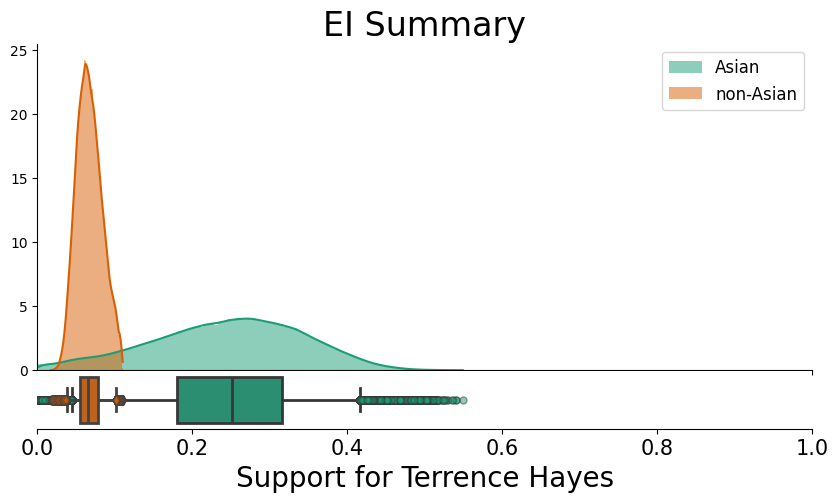

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Terrence Hayes is
        0.245
        The posterior mean for the district-level voting preference of
        non-Asian for Terrence Hayes is
        0.067
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Terrence Hayes is
        [0.04501689 0.41653204]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Terrence Hayes is
        [0.03828637 0.10135587]
        
Terrence Hayes , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

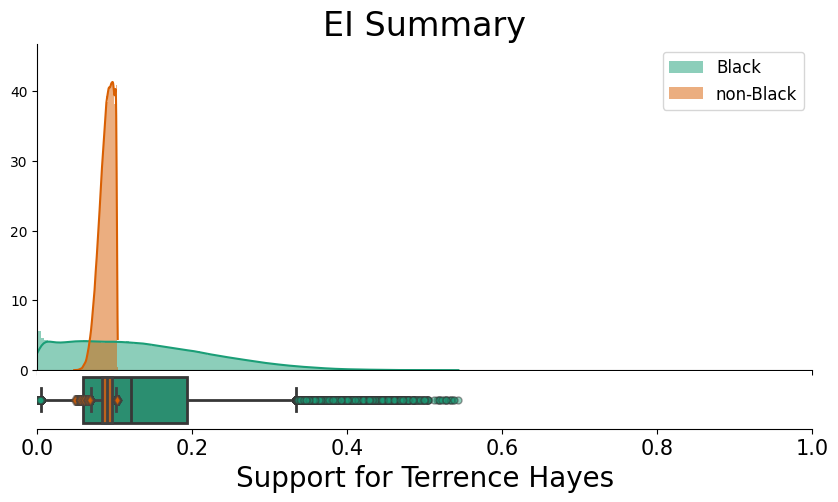

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Terrence Hayes is
        0.133
        The posterior mean for the district-level voting preference of
        non-Black for Terrence Hayes is
        0.089
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Terrence Hayes is
        [0.0044212  0.33393118]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Terrence Hayes is
        [0.06908673 0.10207821]
        
Terrence Hayes , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

There were 52 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


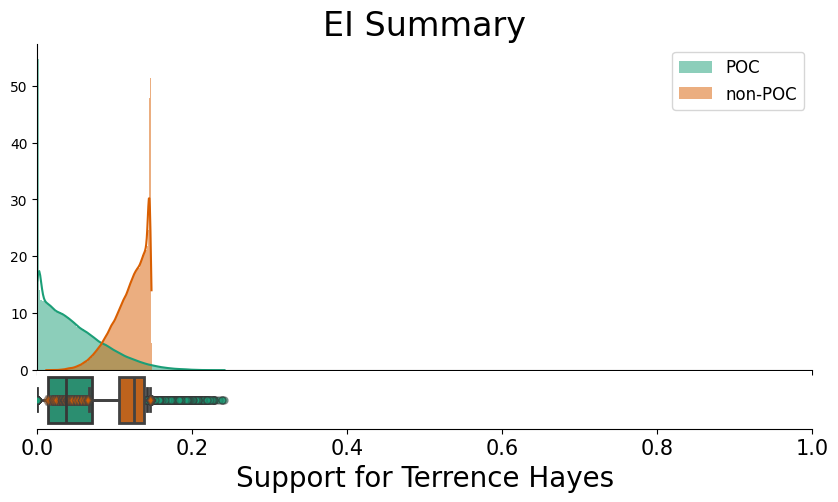

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Terrence Hayes is
        0.046
        The posterior mean for the district-level voting preference of
        non-POC for Terrence Hayes is
        0.119
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Terrence Hayes is
        [1.58939950e-05 1.41553253e-01]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Terrence Hayes is
        [0.0660989  0.14566397]
        
Steph Routh , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

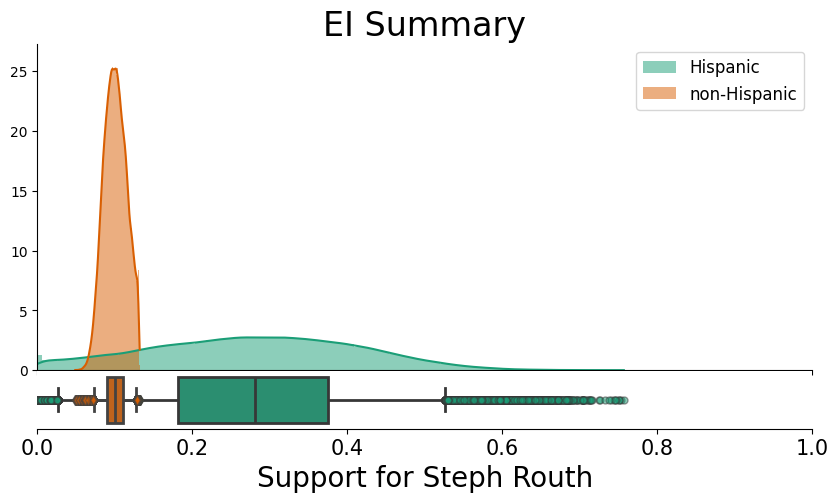

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Steph Routh is
        0.279
        The posterior mean for the district-level voting preference of
        non-Hispanic for Steph Routh is
        0.100
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Steph Routh is
        [0.02646149 0.52642257]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Steph Routh is
        [0.07359237 0.12787112]
        
Steph Routh , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

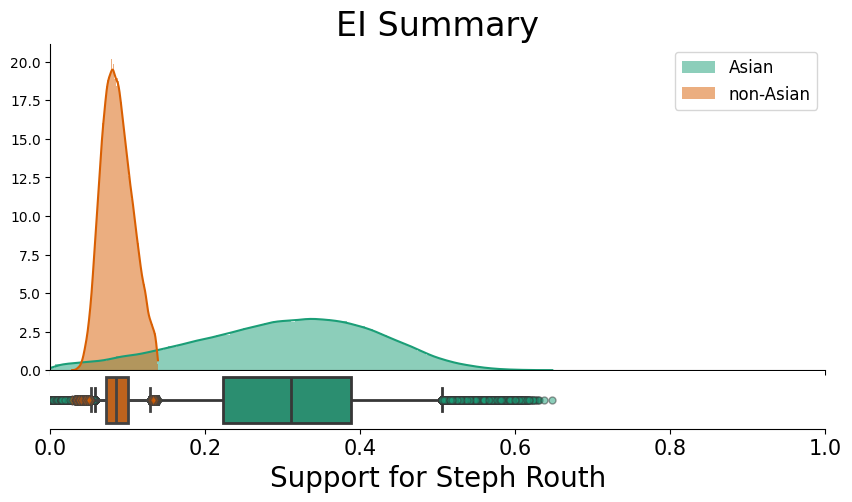

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Steph Routh is
        0.301
        The posterior mean for the district-level voting preference of
        non-Asian for Steph Routh is
        0.086
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Steph Routh is
        [0.05756462 0.50465055]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Steph Routh is
        [0.05188404 0.12822448]
        
Steph Routh , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

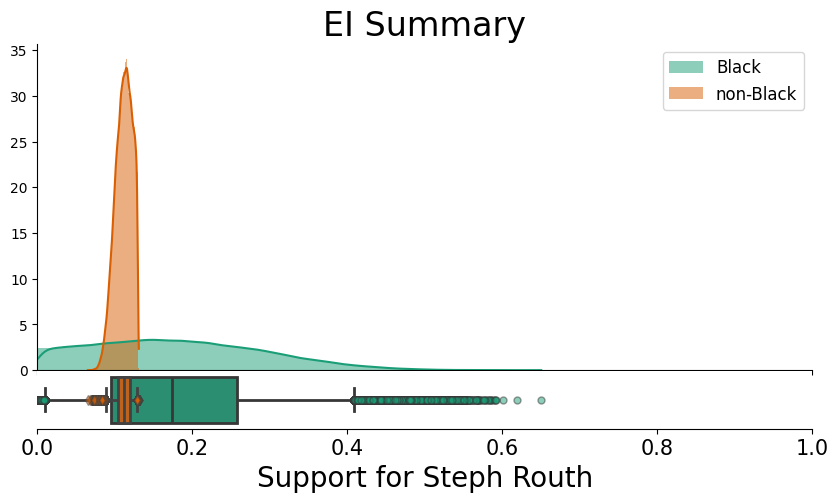

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Steph Routh is
        0.182
        The posterior mean for the district-level voting preference of
        non-Black for Steph Routh is
        0.111
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Steph Routh is
        [0.01049741 0.40863076]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Steph Routh is
        [0.08876432 0.12859885]
        
Steph Routh , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

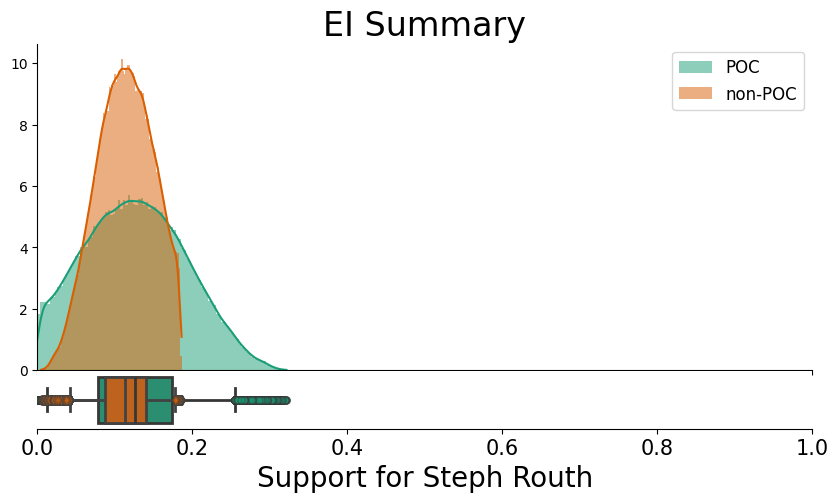

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Steph Routh is
        0.127
        The posterior mean for the district-level voting preference of
        non-POC for Steph Routh is
        0.113
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Steph Routh is
        [0.01183404 0.25454366]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Steph Routh is
        [0.0418995  0.17781243]
        
Timur Ender , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

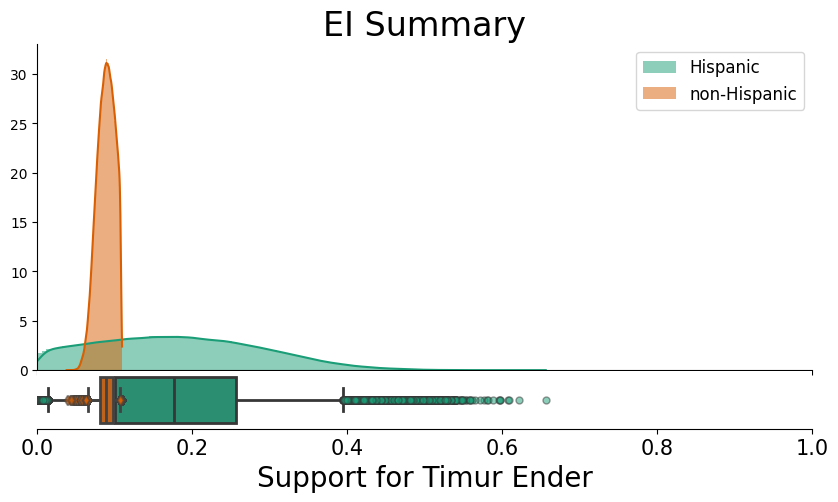

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Timur Ender is
        0.183
        The posterior mean for the district-level voting preference of
        non-Hispanic for Timur Ender is
        0.088
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Timur Ender is
        [0.01346277 0.39496753]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Timur Ender is
        [0.0653678  0.10677007]
        
Timur Ender , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

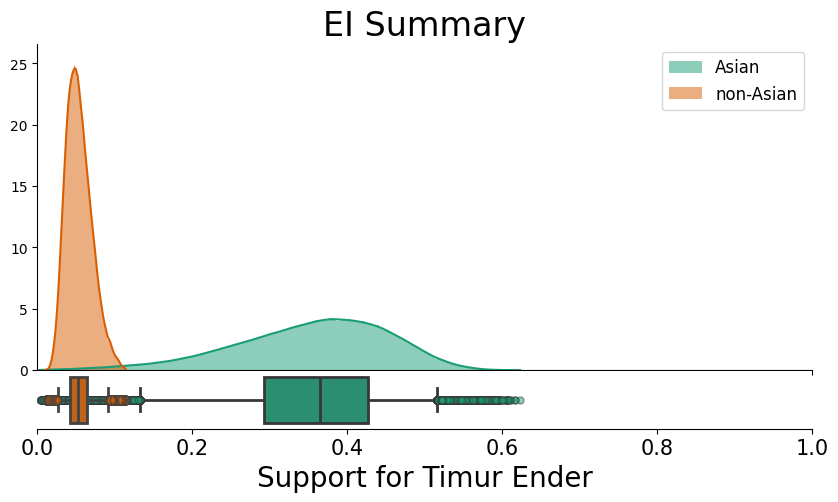

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Timur Ender is
        0.354
        The posterior mean for the district-level voting preference of
        non-Asian for Timur Ender is
        0.054
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Timur Ender is
        [0.13307765 0.51617185]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Timur Ender is
        [0.02657791 0.09147796]
        
Timur Ender , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

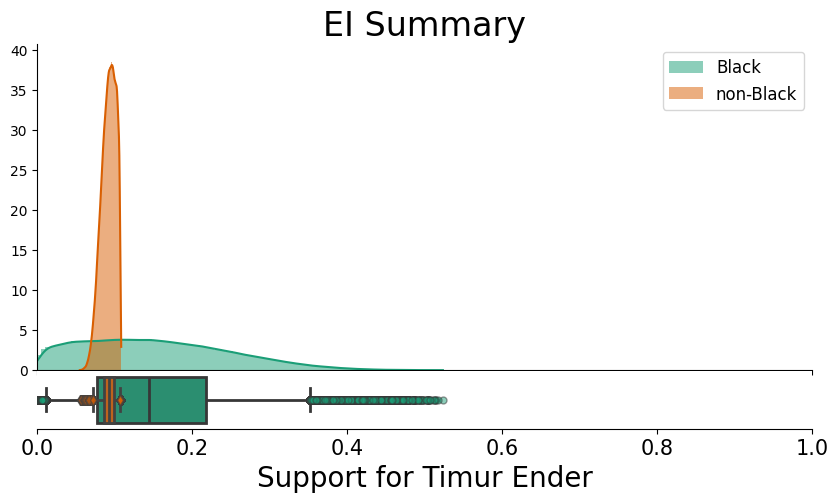

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Timur Ender is
        0.153
        The posterior mean for the district-level voting preference of
        non-Black for Timur Ender is
        0.092
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Timur Ender is
        [0.0107283  0.35208424]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Timur Ender is
        [0.07208096 0.10616873]
        
Timur Ender , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

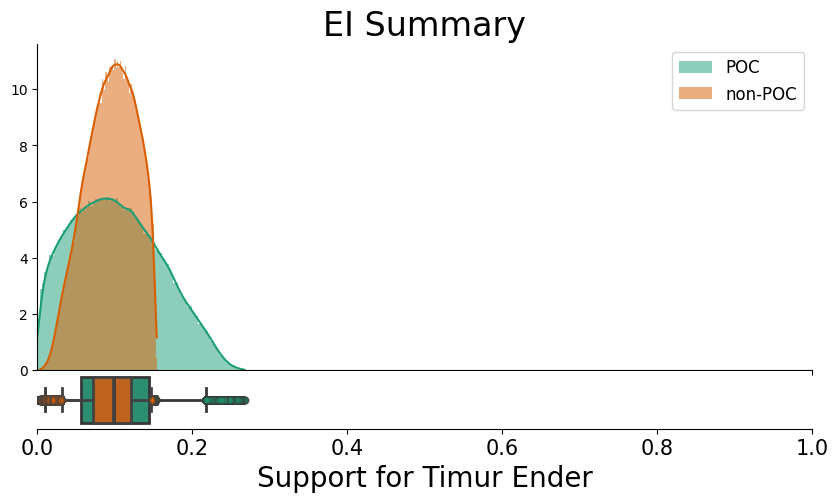

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Timur Ender is
        0.102
        The posterior mean for the district-level voting preference of
        non-POC for Timur Ender is
        0.095
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Timur Ender is
        [0.00950944 0.21708104]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Timur Ender is
        [0.03141052 0.14722028]
        
Other , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

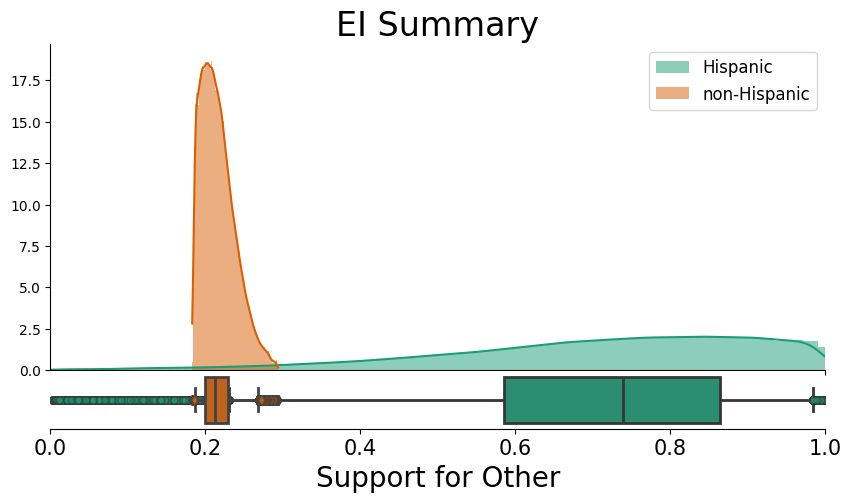

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Other is
        0.706
        The posterior mean for the district-level voting preference of
        non-Hispanic for Other is
        0.216
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Other is
        [0.2301222  0.98354093]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Other is
        [0.18627914 0.26812356]
        
Other , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

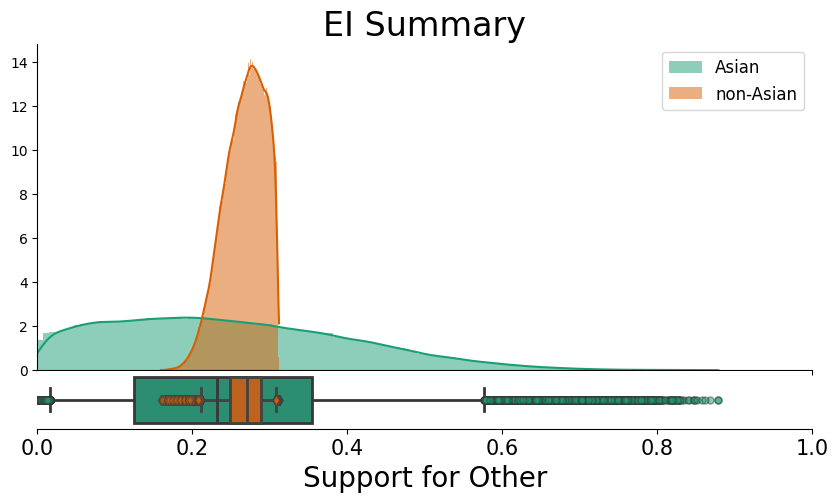

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Other is
        0.249
        The posterior mean for the district-level voting preference of
        non-Asian for Other is
        0.267
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Other is
        [0.01630685 0.57686793]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Other is
        [0.21078632 0.30737514]
        
Other , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

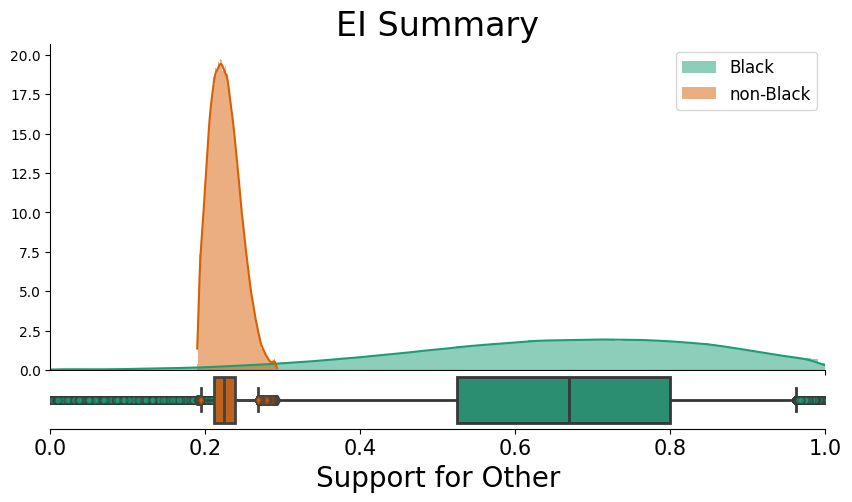

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Other is
        0.651
        The posterior mean for the district-level voting preference of
        non-Black for Other is
        0.226
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Other is
        [0.23270846 0.96231292]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Other is
        [0.19431182 0.26745546]
        
Other , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

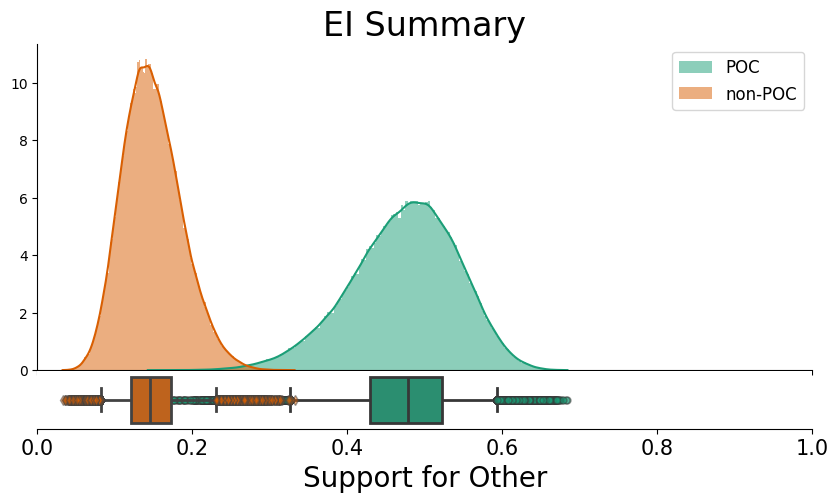

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Other is
        0.473
        The posterior mean for the district-level voting preference of
        non-POC for Other is
        0.149
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Other is
        [0.32633445 0.59360859]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Other is
        [0.08234721 0.22989199]
        


In [25]:
precinct_names = D1_precincts_df['Precinct']
demographic_groups = ["Hispanic", "Asian", "Black", "POC"]
election = "Borda 654321"
election_total_votes = "Condensed Borda 654321 total"

candidate_names = D1_candidates + ["Other"]
D1_precincts_df["Other " + election + " pct"] = 1 - D1_precincts_df[[name + " " + election + " pct" for name in D1_candidates]].sum(axis=1)

pop_pct_dict = {
    "Hispanic" : "HDVAP22 pct", 
    "Asian" : "AAPIDVAP22 pct", 
    "Black" : "BDVAP22 pct", 
    "POC": "POCDVAP22 pct",
    "White" : "WDVAP22 pct"
}


for i in range(len(candidate_names)):
    for demographic_group_name in demographic_groups:   
        candidate_name = candidate_names[i]
        votes_fraction = np.array(D1_precincts_df[candidate_name + " " + election + " pct"])
        precinct_votes = np.array(D1_precincts_df[election_total_votes])

        print(candidate_name, ',', demographic_group_name)
        group_fraction = np.array(D1_precincts_df[pop_pct_dict[demographic_group_name]])

        # Fitting a first 2 x 2 model

         # Create a TwobyTwoEI object
        ei_2by2 = TwoByTwoEI(model_name="king99_pareto_modification", pareto_scale=50, pareto_shape=10)

        # Fit the model
        ei_2by2.fit(group_fraction,
                votes_fraction,
                precinct_votes,
                demographic_group_name=demographic_group_name,
                candidate_name=candidate_name,
                precinct_names=precinct_names,
                draws=50000, # optional
                tune=10000, # optional
                target_accept=.999# optional
        )

        ei_2by2.plot()
        plt.show()

        # Plot the rhat and ess statistics and plot trace to see what's going on with these!
        #az.rhat(ei_2by2.sim_trace)
        #az.ess(ei_2by2.sim_trace)
        #az.plot_trace(ei_2by2.sim_trace, compact=True)

        # Generate a simple report to summarize the results
        print(ei_2by2.summary())

### Initial thoughts:
- POC vs. non-POC support for Avalos is reversed from in the Rank 1 version, but lots of overlap for both.
- Dunphy still does slightly better with POC than with White, but with a lot more overlap.
- Smith does more better with POC than in Rank 1 (but there are errors).
- Ernst has almost total overlap between White and POC distributions.
- Hayes still has more White support.
- Routh has almost total overlap between White and POC distributions.
- Ender has almost total overlap between White and POC distributions.
- Other has a LOT more POC support than in Rank 1, especially from Hispanic and Black - but not Asian.

### RxC:

Running ['Hispanic', 'Asian', 'Black', 'White+Other'] x ['Candace Avalos', 'Jamie Dunphy', 'Loretta Smith', 'Noah Ernst', 'Terrence Hayes', 'Steph Routh', 'Timur Ender', 'Other'] EI
r = 4 rows (demographic groups)
c = 8 columns (candidates or voting outcomes)
number of precincts = 27


  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

/opt/miniconda3/envs/gerry2024/lib/python3.12/site-packages/jax/_src/interpreters/mlir.py:910: UserWarning: Some donated buffers were not usable: ShapedArray(float64[4,50000,27,4,7]).
See an explanation at https://jax.readthedocs.io/en/latest/faq.html#buffer-donation.
  warnings.warn("Some donated buffers were not usable:"


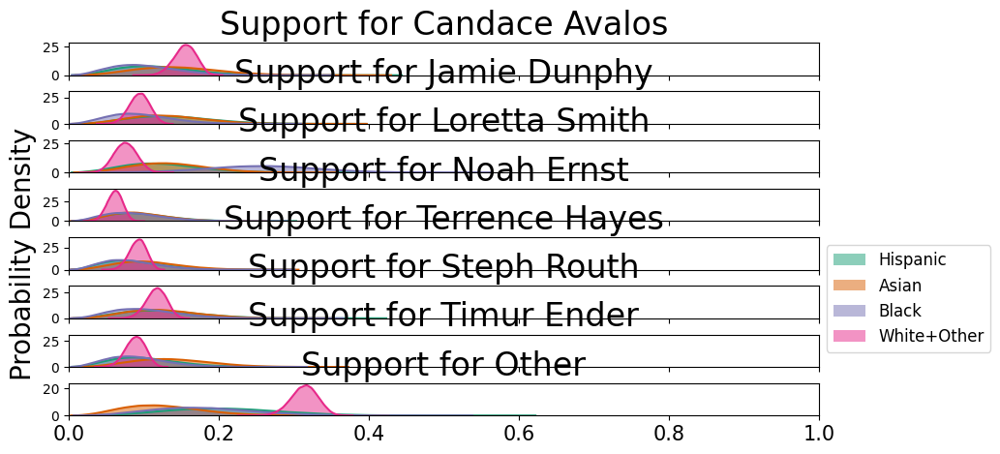


            Computed from the raw b_ samples by multiplying by group populations and then
            getting the proportion of the total pop
            (total pop=summed across all districts):
            The posterior mean for the district-level voting preference of
                Hispanic for Candace Avalos is
                0.119
                95% equal-tailed credible interval:  [0.03673674 0.23334804]
                The posterior mean for the district-level voting preference of
                Hispanic for Jamie Dunphy is
                0.138
                95% equal-tailed credible interval:  [0.04798155 0.25519289]
                The posterior mean for the district-level voting preference of
                Hispanic for Loretta Smith is
                0.125
                95% equal-tailed credible interval:  [0.03944384 0.2336186 ]
                The posterior mean for the district-level voting preference of
                Hispanic for Noah Ernst is
              

In [26]:
precinct_names = D1_precincts_df['Precinct']
demographic_group_names = ["Hispanic", "Asian", "Black", "White+Other"]
election = "Borda 654321"
election_total_votes = "Condensed Borda 654321 total"

candidate_names = D1_candidates + ["Other"]
D1_precincts_df["Other " + election + " pct"] = 1 - D1_precincts_df[[name + " " + election + " pct" for name in D1_candidates]].sum(axis=1)

D1_precincts_df['W+ODVAP22 pct'] = 1 - D1_precincts_df[['HDVAP22 pct', 'AAPIDVAP22 pct', 'BDVAP22 pct']].sum(axis=1)

votes_fractions = np.array(D1_precincts_df[[name + " " + election + " pct" for name in candidate_names]]).T
precinct_votes = np.array(D1_precincts_df[election_total_votes])

group_fractions = np.array(D1_precincts_df[['HDVAP22 pct', 'AAPIDVAP22 pct', 'BDVAP22 pct', 'W+ODVAP22 pct']]).T

ei = RowByColumnEI(model_name='multinomial-dirichlet')
ei.fit(group_fractions, votes_fractions, precinct_votes, demographic_group_names, candidate_names, draws=50000, target_accept=.999)

ei.plot()
plt.show()
print(ei.summary())

#ei.precinct_level_plot(D1_candidates[i])

### 2xC with POC combined:

Running ['POC', 'White'] x ['Candace Avalos', 'Jamie Dunphy', 'Loretta Smith', 'Noah Ernst', 'Terrence Hayes', 'Steph Routh', 'Timur Ender', 'Other'] EI
r = 2 rows (demographic groups)
c = 8 columns (candidates or voting outcomes)
number of precincts = 27


  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

/opt/miniconda3/envs/gerry2024/lib/python3.12/site-packages/jax/_src/interpreters/mlir.py:910: UserWarning: Some donated buffers were not usable: ShapedArray(float64[4,50000,27,2,7]).
See an explanation at https://jax.readthedocs.io/en/latest/faq.html#buffer-donation.
  warnings.warn("Some donated buffers were not usable:"


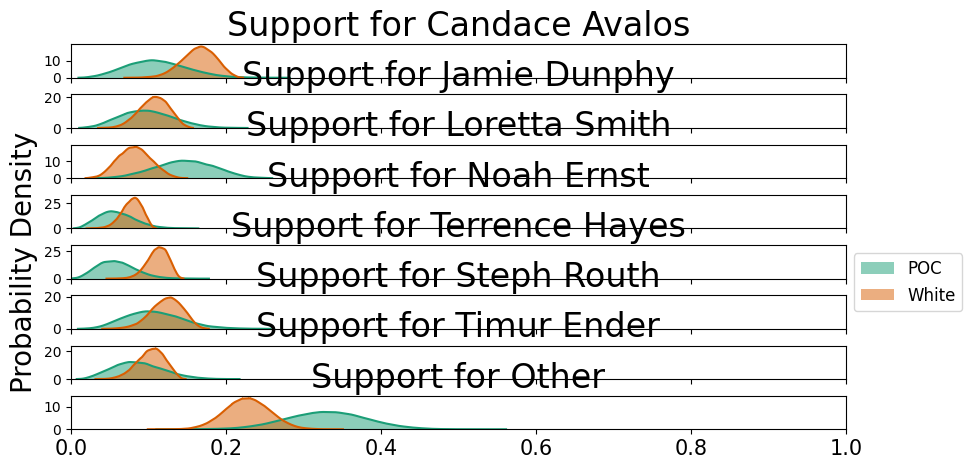


            Computed from the raw b_ samples by multiplying by group populations and then
            getting the proportion of the total pop
            (total pop=summed across all districts):
            The posterior mean for the district-level voting preference of
                POC for Candace Avalos is
                0.111
                95% equal-tailed credible interval:  [0.0422248  0.19194493]
                The posterior mean for the district-level voting preference of
                POC for Jamie Dunphy is
                0.099
                95% equal-tailed credible interval:  [0.03814254 0.16803401]
                The posterior mean for the district-level voting preference of
                POC for Loretta Smith is
                0.147
                95% equal-tailed credible interval:  [0.07329555 0.21723155]
                The posterior mean for the district-level voting preference of
                POC for Noah Ernst is
                0.059
            

In [27]:
precinct_names = D1_precincts_df['Precinct']
demographic_group_names = ["POC", "White"]
election = "Borda 654321"
election_total_votes = "Condensed Borda 654321 total"

candidate_names = D1_candidates + ["Other"]
D1_precincts_df["Other " + election + " pct"] = 1 - D1_precincts_df[[name + " " + election + " pct" for name in D1_candidates]].sum(axis=1)


votes_fractions = np.array(D1_precincts_df[[name + " " + election + " pct" for name in candidate_names]]).T
precinct_votes = np.array(D1_precincts_df[election_total_votes])

group_fractions = np.array(D1_precincts_df[['POCDVAP22 pct', 'WDVAP22 pct']]).T

ei = RowByColumnEI(model_name='multinomial-dirichlet')
ei.fit(group_fractions, votes_fractions, precinct_votes, demographic_group_names, candidate_names, draws=50000, target_accept=.999)

ei.plot()
plt.show()
print(ei.summary())

#ei.precinct_level_plot(D1_candidates[i])

### Borda 52100 score:

### Goodman's ER (with plots):

Candace Avalos , Hispanic
Goodmans ER, weighted by population
        Est. fraction of Hispanic
        voters who voted for Candace Avalos is
        0.666
        Est. fraction of non- Hispanic
        voters who voted for Candace Avalos is
        0.124
        
Candace Avalos , Asian
Goodmans ER, weighted by population
        Est. fraction of Asian
        voters who voted for Candace Avalos is
        0.253
        Est. fraction of non- Asian
        voters who voted for Candace Avalos is
        0.163
        
Candace Avalos , Black
Goodmans ER, weighted by population
        Est. fraction of Black
        voters who voted for Candace Avalos is
        -0.125
        Est. fraction of non- Black
        voters who voted for Candace Avalos is
        0.206
        
Candace Avalos , AMIN
Goodmans ER, weighted by population
        Est. fraction of AMIN
        voters who voted for Candace Avalos is
        1.112
        Est. fraction of non- AMIN
        voters who voted for Candac

/opt/miniconda3/envs/gerry2024/lib/python3.12/site-packages/pyei/goodmans_er.py:109: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


Goodmans ER, weighted by population
        Est. fraction of POC
        voters who voted for Steph Routh is
        0.173
        Est. fraction of non- POC
        voters who voted for Steph Routh is
        0.073
        
Timur Ender , Hispanic
Goodmans ER, weighted by population
        Est. fraction of Hispanic
        voters who voted for Timur Ender is
        0.186
        Est. fraction of non- Hispanic
        voters who voted for Timur Ender is
        0.082
        
Timur Ender , Asian
Goodmans ER, weighted by population
        Est. fraction of Asian
        voters who voted for Timur Ender is
        0.133
        Est. fraction of non- Asian
        voters who voted for Timur Ender is
        0.086
        
Timur Ender , Black
Goodmans ER, weighted by population
        Est. fraction of Black
        voters who voted for Timur Ender is
        -0.045
        Est. fraction of non- Black
        voters who voted for Timur Ender is
        0.106
        
Timur Ender , AMIN
Goo

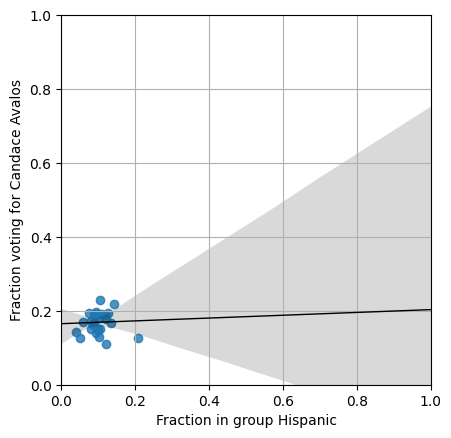

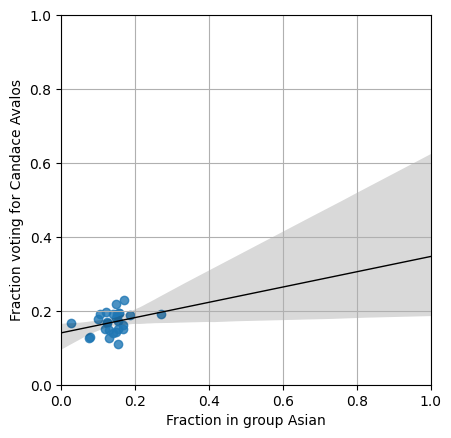

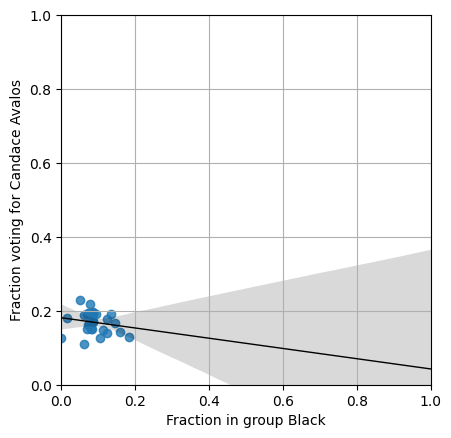

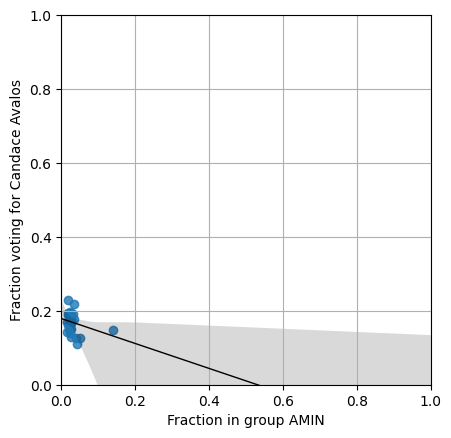

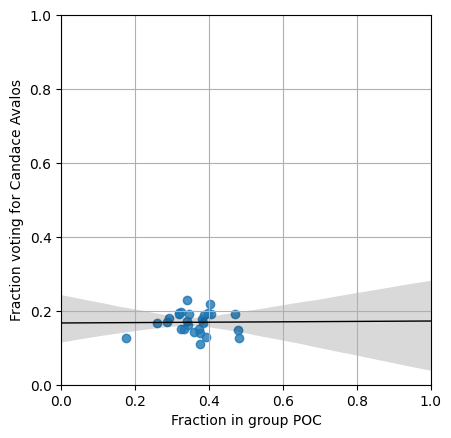

...

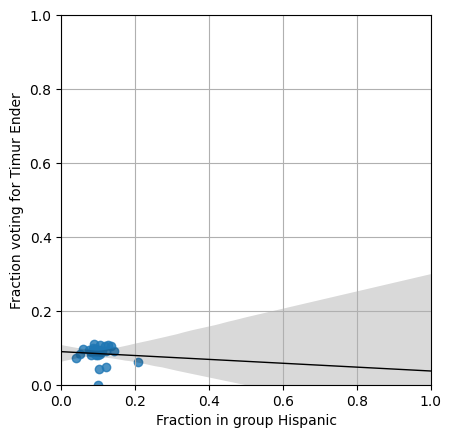

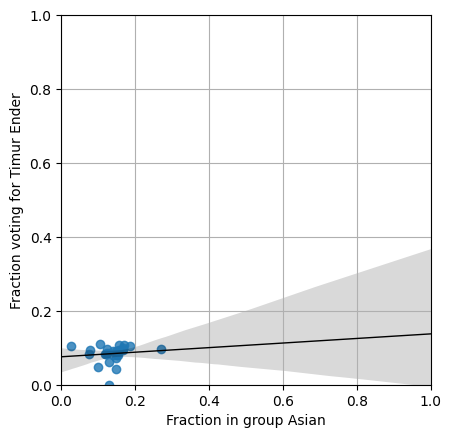

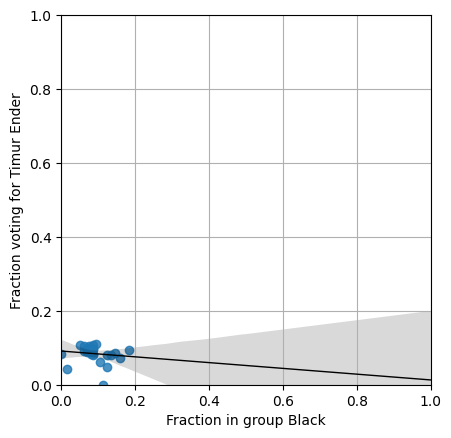

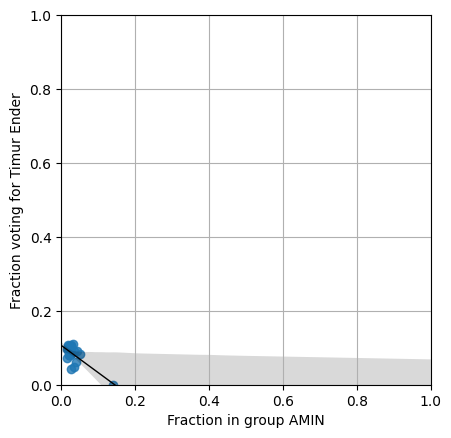

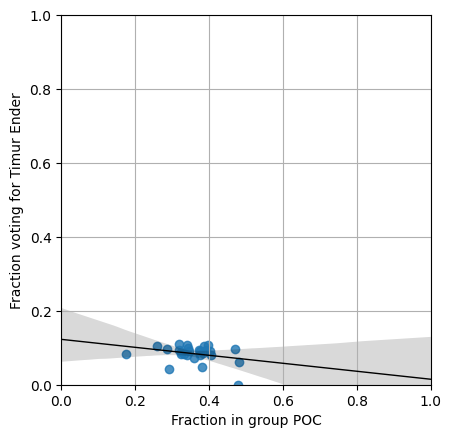

In [28]:
precinct_names = D1_precincts_df['Precinct']
demographic_groups = ["Hispanic", "Asian", "Black", "AMIN", "POC"]
election = "Borda 521000"
election_total_votes = "Condensed Borda 521000 total"


pop_pct_dict = {
    "Hispanic" : "HDVAP22 pct", 
    "Asian" : "AAPIDVAP22 pct", 
    "Black" : "BDVAP22 pct", 
    "AMIN": "AMINDVAP22 pct",
    "POC": "POCDVAP22 pct",
    "White" : "WDVAP22 pct"
}


for i in range(len(D1_candidates)):
    for demographic_group_name in demographic_groups:   
        candidate_name = D1_candidates[i]
        votes_fraction = np.array(D1_precincts_df[candidate_name + " " + election + " pct"])
        precinct_votes = np.array(D1_precincts_df[election_total_votes])

        print(candidate_name, ',', demographic_group_name)
        group_fraction = np.array(D1_precincts_df[pop_pct_dict[demographic_group_name]])

        # Fitting Goodman's ER - precincts weighted by population
        # Create a GoodmansER object
        goodmans_er = GoodmansER(is_weighted_regression=True)

        # Fit the model
        goodmans_er.fit(
            group_fraction,
            votes_fraction,
            precinct_votes,
            demographic_group_name=demographic_group_name,
            candidate_name=candidate_name
         )

        goodmans_er.plot(line_kws={"color":"black", "lw": 1})
        
        # Generate a simple report to summarize the results
        print(goodmans_er.summary())
    

### 2x2 EI:

Candace Avalos , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

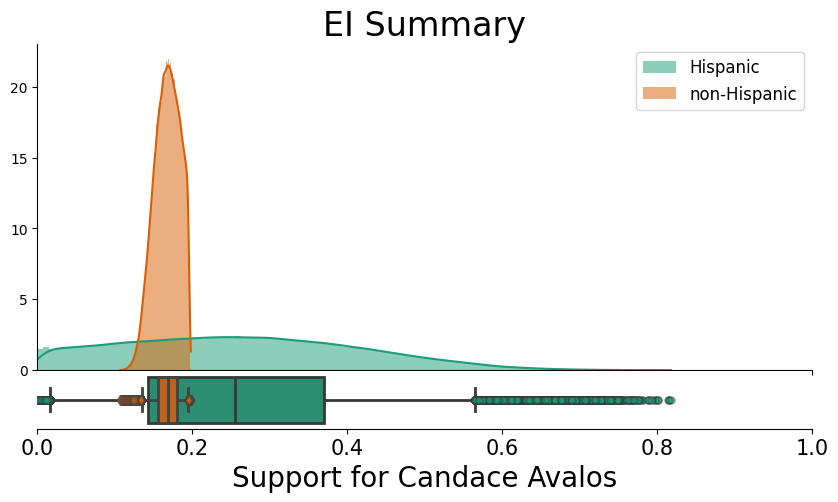

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Candace Avalos is
        0.263
        The posterior mean for the district-level voting preference of
        non-Hispanic for Candace Avalos is
        0.167
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Candace Avalos is
        [0.016169   0.56468136]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Candace Avalos is
        [0.13459397 0.19416563]
        
Candace Avalos , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

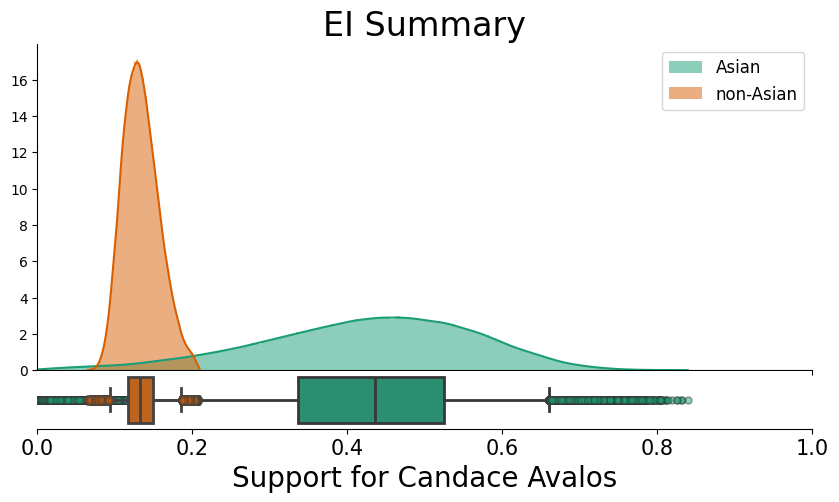

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Candace Avalos is
        0.425
        The posterior mean for the district-level voting preference of
        non-Asian for Candace Avalos is
        0.134
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Candace Avalos is
        [0.12804397 0.66028946]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Candace Avalos is
        [0.09361012 0.18493921]
        
Candace Avalos , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

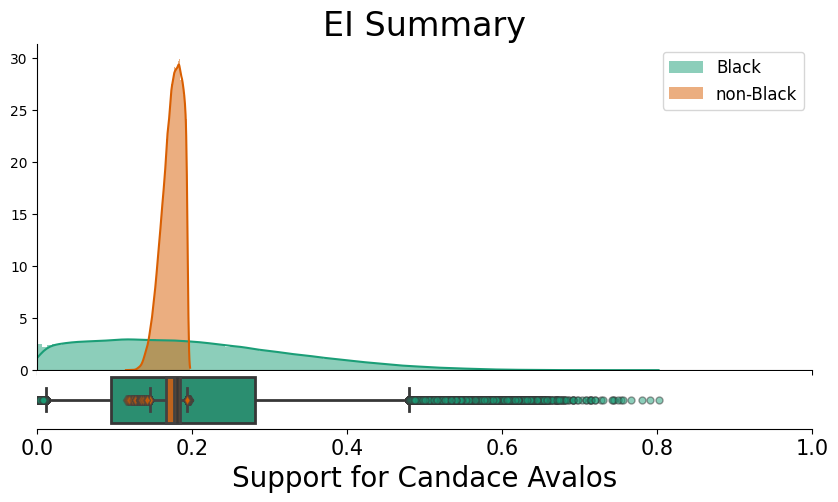

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Candace Avalos is
        0.197
        The posterior mean for the district-level voting preference of
        non-Black for Candace Avalos is
        0.174
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Candace Avalos is
        [0.01059659 0.47978637]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Candace Avalos is
        [0.14592047 0.1929072 ]
        
Candace Avalos , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

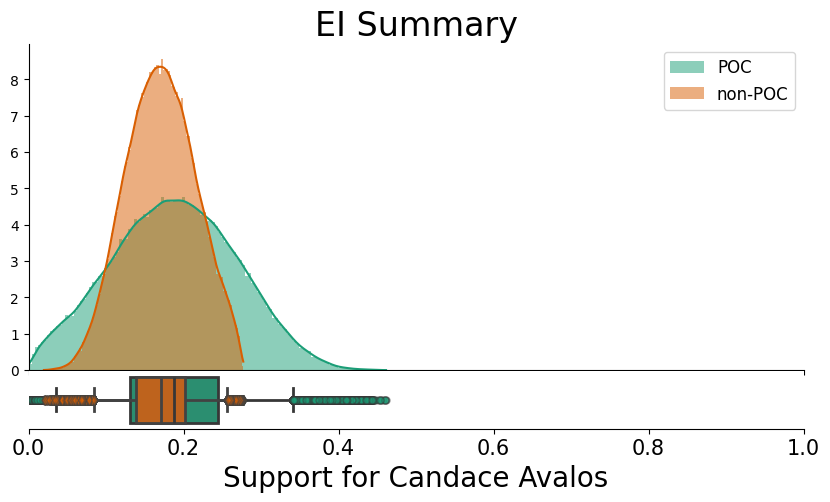

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Candace Avalos is
        0.188
        The posterior mean for the district-level voting preference of
        non-POC for Candace Avalos is
        0.170
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Candace Avalos is
        [0.03502099 0.3412041 ]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Candace Avalos is
        [0.0847831  0.25644526]
        
Jamie Dunphy , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

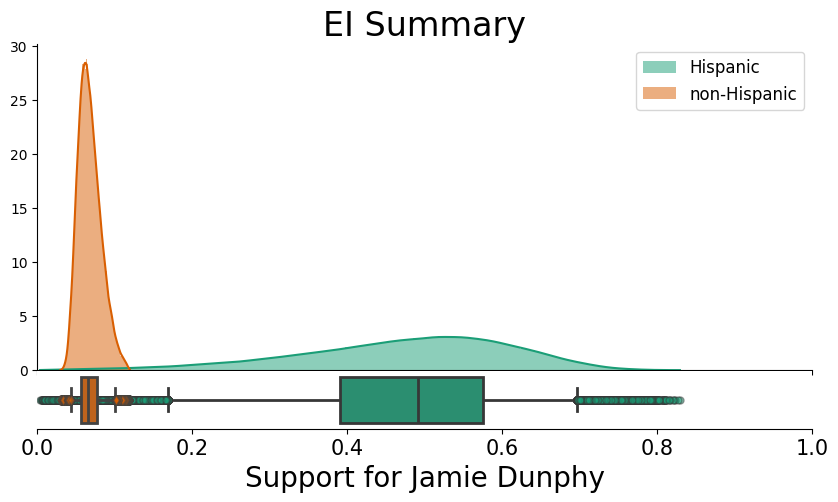

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Jamie Dunphy is
        0.475
        The posterior mean for the district-level voting preference of
        non-Hispanic for Jamie Dunphy is
        0.068
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Jamie Dunphy is
        [0.16906223 0.69678349]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Jamie Dunphy is
        [0.04364938 0.10072338]
        
Jamie Dunphy , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

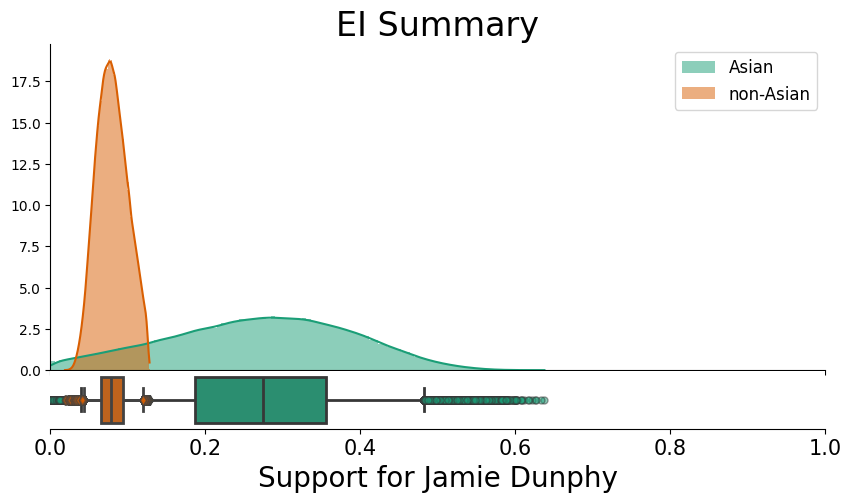

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Jamie Dunphy is
        0.269
        The posterior mean for the district-level voting preference of
        non-Asian for Jamie Dunphy is
        0.080
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Jamie Dunphy is
        [0.03878255 0.48238897]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Jamie Dunphy is
        [0.04362166 0.11912726]
        
Jamie Dunphy , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

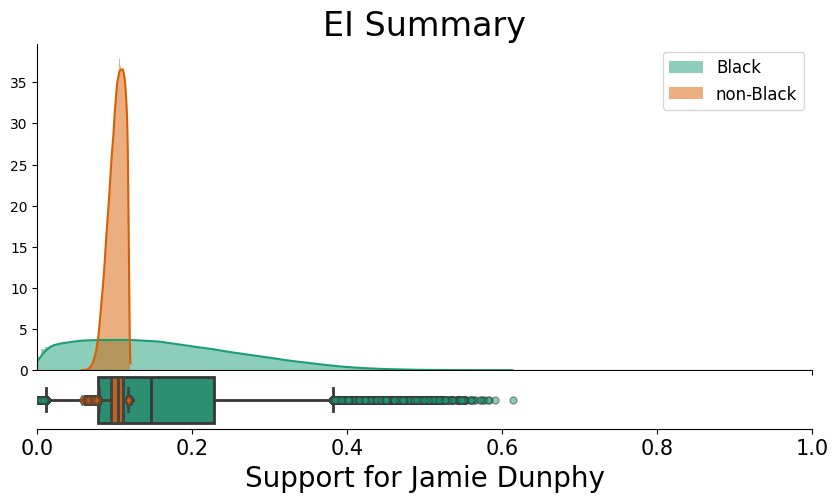

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Jamie Dunphy is
        0.160
        The posterior mean for the district-level voting preference of
        non-Black for Jamie Dunphy is
        0.102
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Jamie Dunphy is
        [0.01172811 0.3812005 ]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Jamie Dunphy is
        [0.08009942 0.11720108]
        
Jamie Dunphy , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

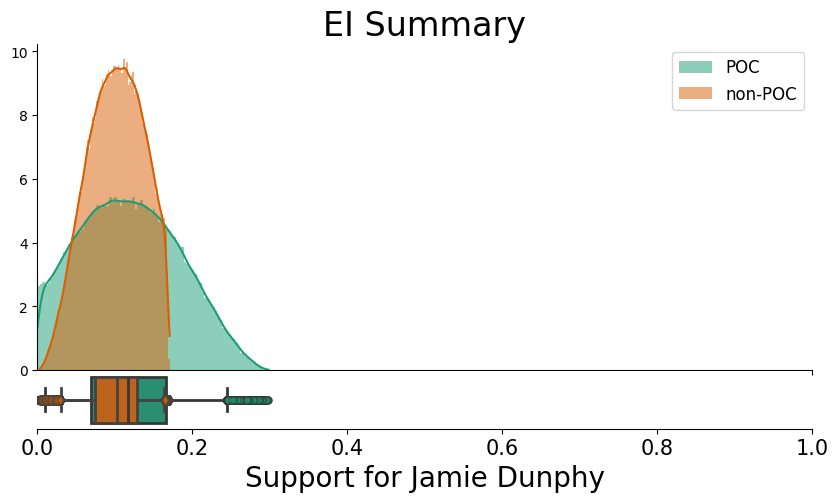

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Jamie Dunphy is
        0.119
        The posterior mean for the district-level voting preference of
        non-POC for Jamie Dunphy is
        0.101
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Jamie Dunphy is
        [0.00928546 0.24488344]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Jamie Dunphy is
        [0.03113338 0.16293886]
        
Loretta Smith , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

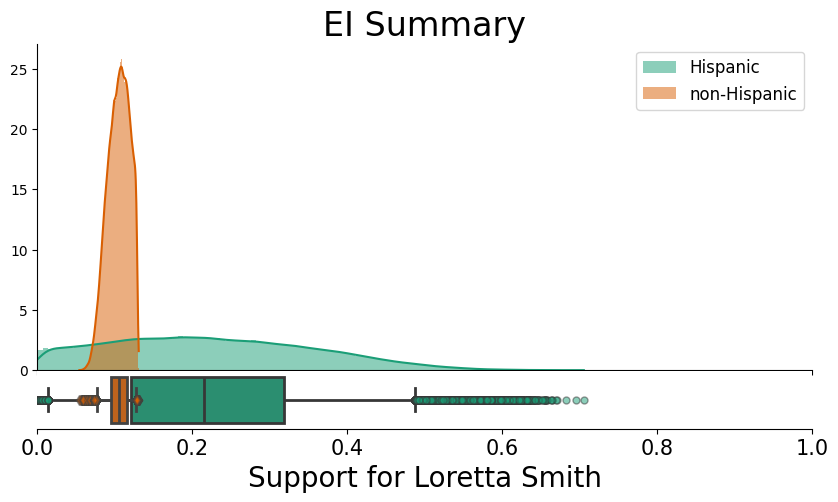

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Loretta Smith is
        0.224
        The posterior mean for the district-level voting preference of
        non-Hispanic for Loretta Smith is
        0.105
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Loretta Smith is
        [0.01414787 0.48760099]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Loretta Smith is
        [0.07638791 0.12755154]
        
Loretta Smith , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

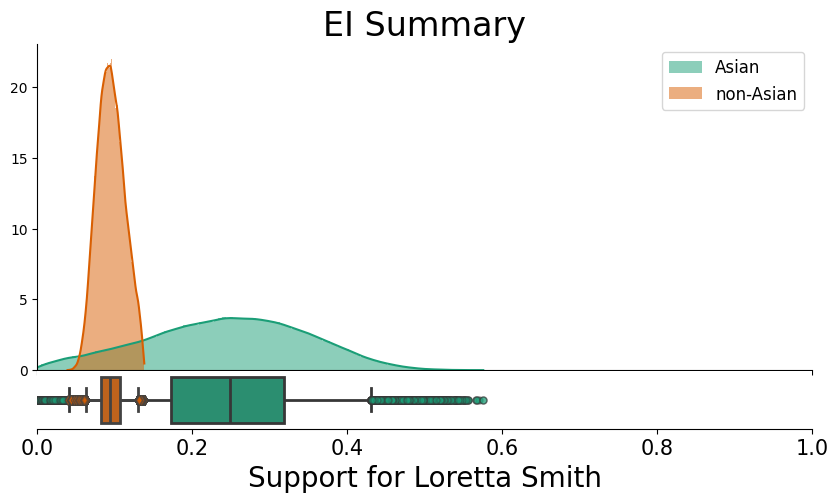

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Loretta Smith is
        0.244
        The posterior mean for the district-level voting preference of
        non-Asian for Loretta Smith is
        0.095
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Loretta Smith is
        [0.04145908 0.4311172 ]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Loretta Smith is
        [0.06297197 0.12958877]
        
Loretta Smith , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

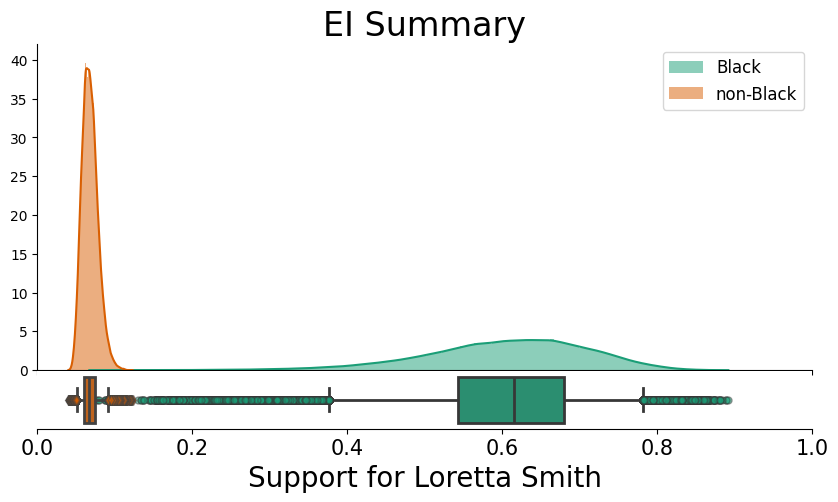

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Loretta Smith is
        0.606
        The posterior mean for the district-level voting preference of
        non-Black for Loretta Smith is
        0.068
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Loretta Smith is
        [0.37682669 0.78119952]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Loretta Smith is
        [0.05077297 0.09092204]
        
Loretta Smith , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

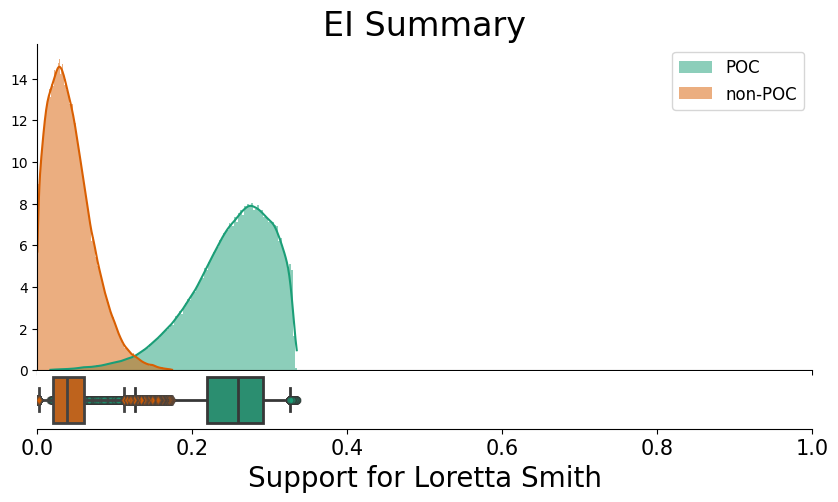

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Loretta Smith is
        0.250
        The posterior mean for the district-level voting preference of
        non-POC for Loretta Smith is
        0.043
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Loretta Smith is
        [0.12634203 0.32566637]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Loretta Smith is
        [0.00199913 0.11133467]
        
Noah Ernst , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

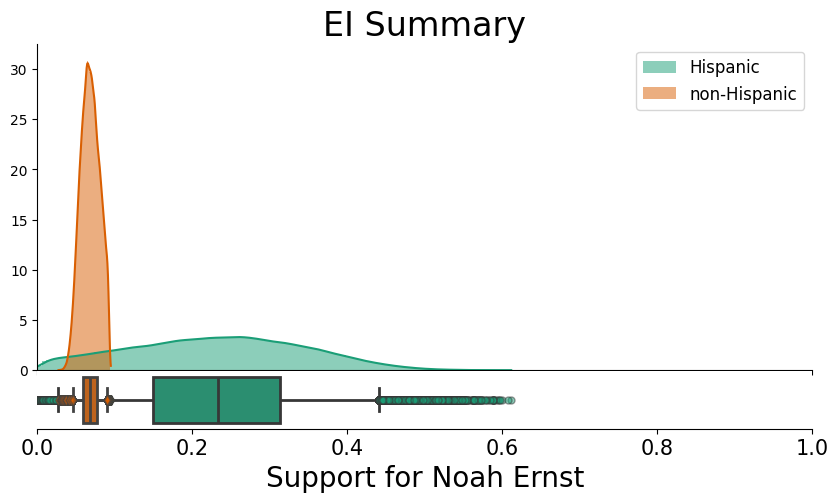

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Noah Ernst is
        0.231
        The posterior mean for the district-level voting preference of
        non-Hispanic for Noah Ernst is
        0.068
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Noah Ernst is
        [0.0270261  0.44036794]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Noah Ernst is
        [0.04571484 0.09022285]
        
Noah Ernst , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

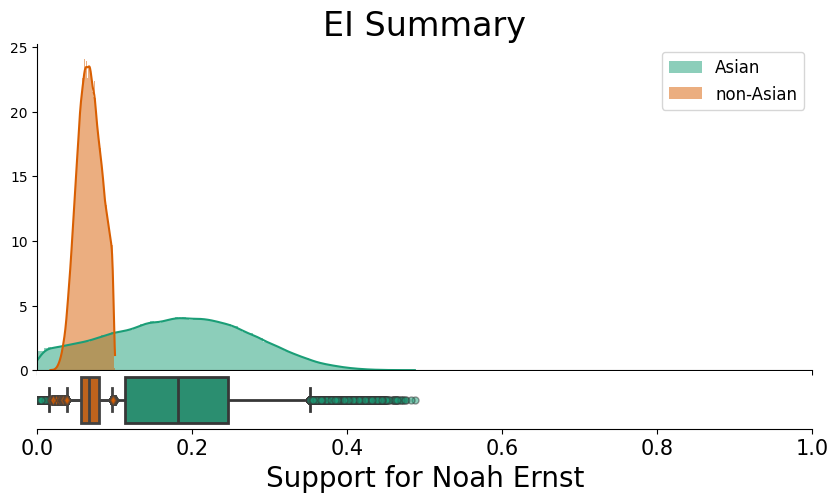

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Noah Ernst is
        0.181
        The posterior mean for the district-level voting preference of
        non-Asian for Noah Ernst is
        0.068
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Noah Ernst is
        [0.01560068 0.35127829]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Noah Ernst is
        [0.03876116 0.09590764]
        
Noah Ernst , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

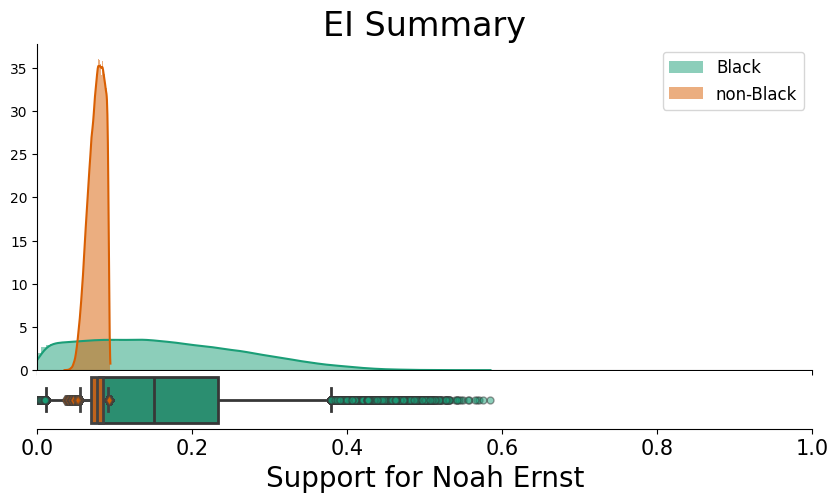

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Noah Ernst is
        0.162
        The posterior mean for the district-level voting preference of
        non-Black for Noah Ernst is
        0.076
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Noah Ernst is
        [0.01072131 0.37878256]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Noah Ernst is
        [0.05484929 0.09135609]
        
Noah Ernst , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

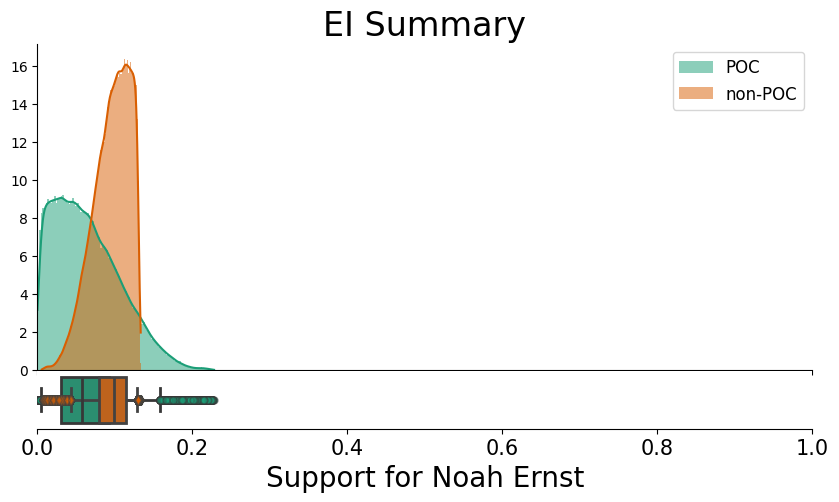

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Noah Ernst is
        0.064
        The posterior mean for the district-level voting preference of
        non-POC for Noah Ernst is
        0.095
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Noah Ernst is
        [0.0042103  0.15867476]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Noah Ernst is
        [0.04280742 0.12896938]
        
Terrence Hayes , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

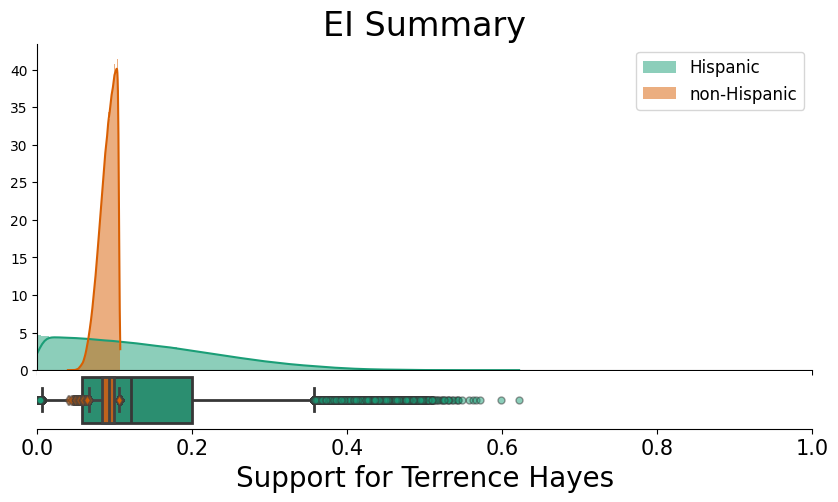

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Terrence Hayes is
        0.137
        The posterior mean for the district-level voting preference of
        non-Hispanic for Terrence Hayes is
        0.091
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Terrence Hayes is
        [0.00538812 0.35646014]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Terrence Hayes is
        [0.06685475 0.10485035]
        
Terrence Hayes , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

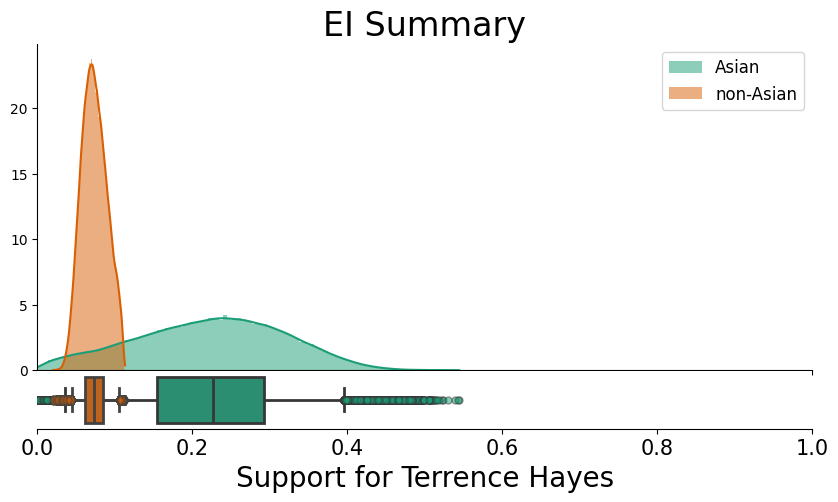

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Terrence Hayes is
        0.223
        The posterior mean for the district-level voting preference of
        non-Asian for Terrence Hayes is
        0.073
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Terrence Hayes is
        [0.03557778 0.39616737]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Terrence Hayes is
        [0.04419218 0.10550526]
        
Terrence Hayes , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

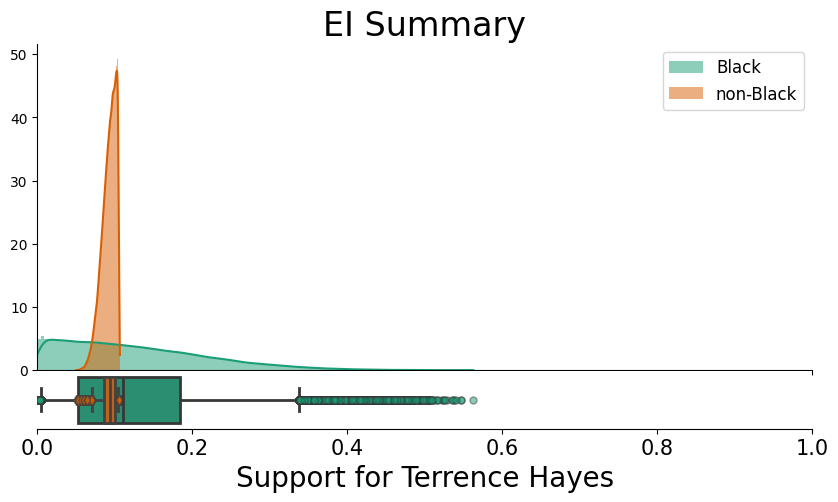

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Terrence Hayes is
        0.126
        The posterior mean for the district-level voting preference of
        non-Black for Terrence Hayes is
        0.092
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Terrence Hayes is
        [0.00498441 0.33719314]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Terrence Hayes is
        [0.07113452 0.10454388]
        
Terrence Hayes , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

There were 64 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


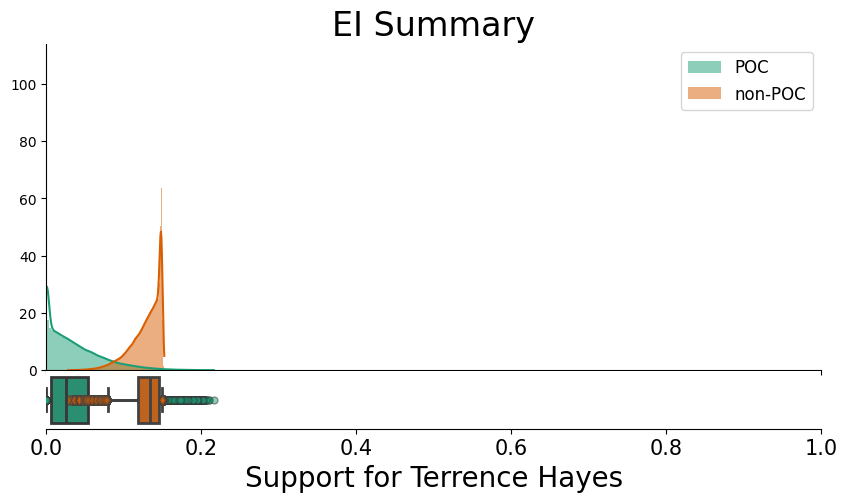

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Terrence Hayes is
        0.035
        The posterior mean for the district-level voting preference of
        non-POC for Terrence Hayes is
        0.129
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Terrence Hayes is
        [1.88467082e-07 1.22549301e-01]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Terrence Hayes is
        [0.07997746 0.14956825]
        
Steph Routh , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

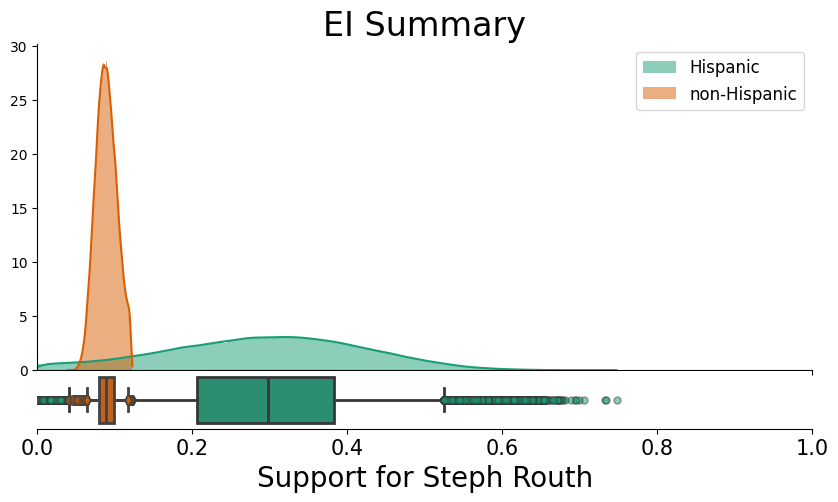

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Steph Routh is
        0.293
        The posterior mean for the district-level voting preference of
        non-Hispanic for Steph Routh is
        0.089
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Steph Routh is
        [0.0403299  0.52424237]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Steph Routh is
        [0.06395992 0.1164486 ]
        
Steph Routh , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

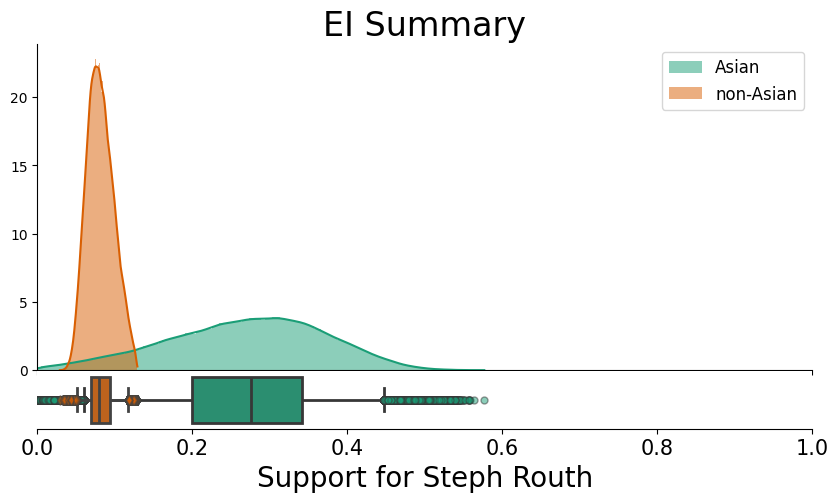

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Steph Routh is
        0.268
        The posterior mean for the district-level voting preference of
        non-Asian for Steph Routh is
        0.081
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Steph Routh is
        [0.05985779 0.44707421]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Steph Routh is
        [0.05109259 0.11728718]
        
Steph Routh , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

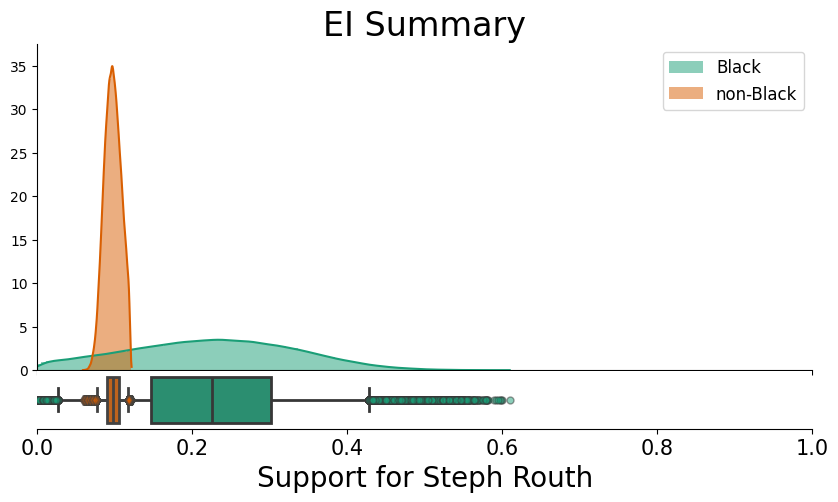

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Steph Routh is
        0.225
        The posterior mean for the district-level voting preference of
        non-Black for Steph Routh is
        0.097
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Steph Routh is
        [0.02607649 0.42743731]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Steph Routh is
        [0.07703227 0.11715593]
        
Steph Routh , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

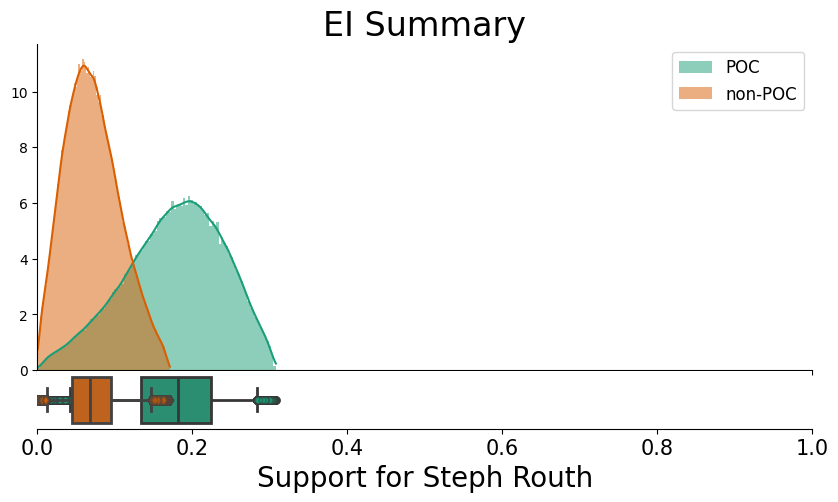

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Steph Routh is
        0.176
        The posterior mean for the district-level voting preference of
        non-POC for Steph Routh is
        0.071
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Steph Routh is
        [0.0426924 0.2839167]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Steph Routh is
        [0.01202273 0.14635328]
        
Timur Ender , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

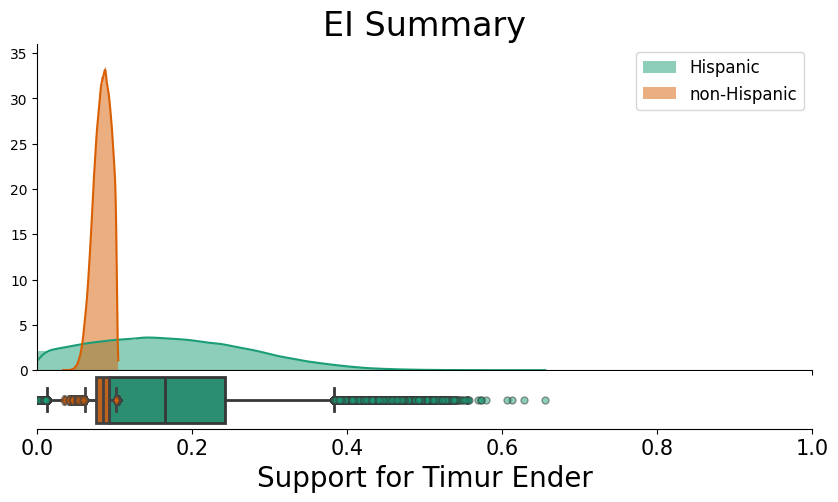

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Timur Ender is
        0.172
        The posterior mean for the district-level voting preference of
        non-Hispanic for Timur Ender is
        0.084
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Timur Ender is
        [0.01199621 0.3829786 ]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Timur Ender is
        [0.06110755 0.101341  ]
        
Timur Ender , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

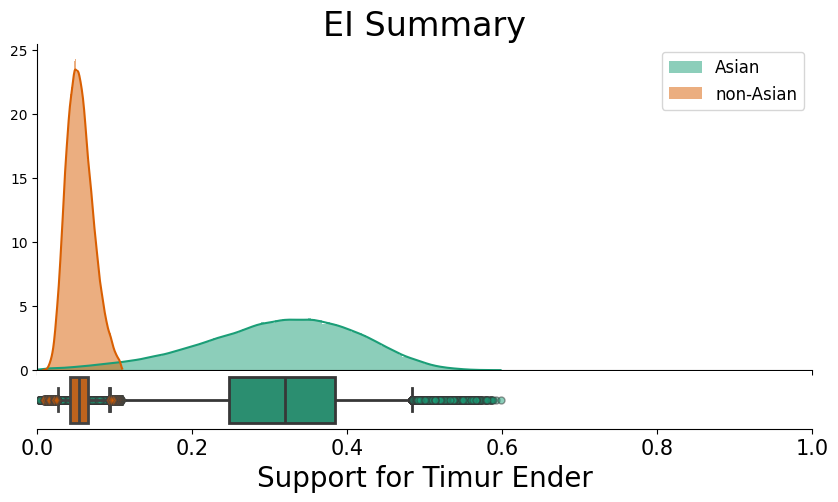

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Timur Ender is
        0.312
        The posterior mean for the district-level voting preference of
        non-Asian for Timur Ender is
        0.055
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Timur Ender is
        [0.0938646 0.4836283]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Timur Ender is
        [0.02621934 0.09235277]
        
Timur Ender , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

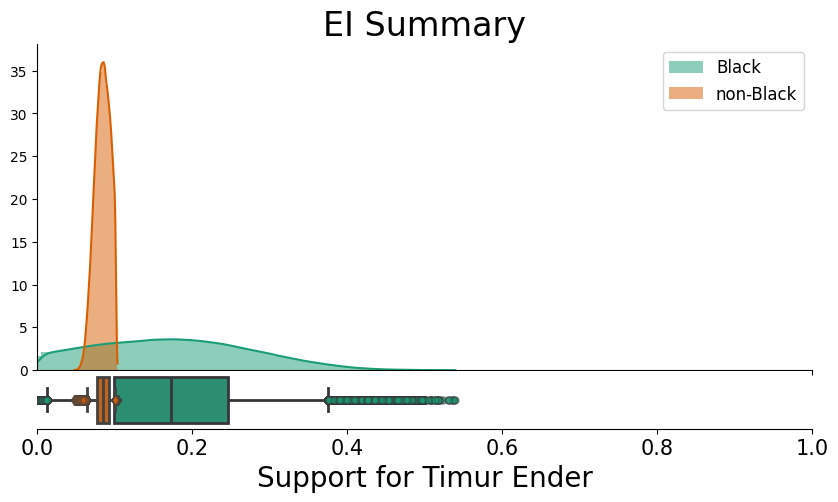

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Timur Ender is
        0.176
        The posterior mean for the district-level voting preference of
        non-Black for Timur Ender is
        0.084
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Timur Ender is
        [0.01285701 0.37473132]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Timur Ender is
        [0.06435672 0.10039787]
        
Timur Ender , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

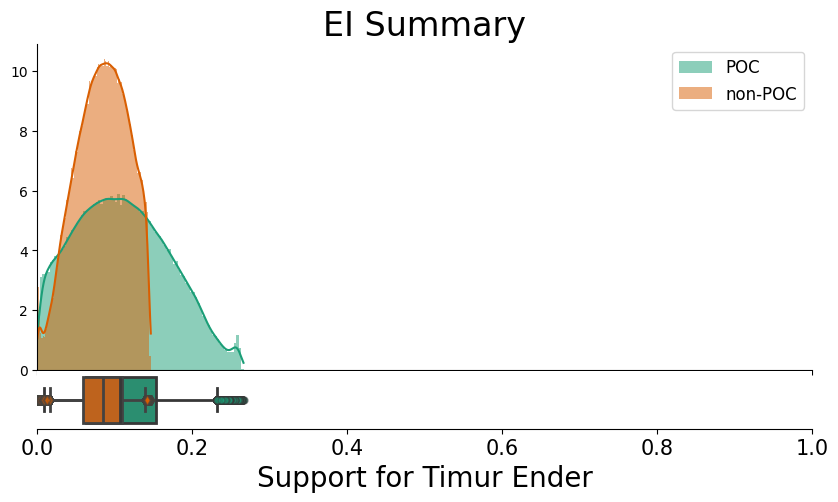

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Timur Ender is
        0.110
        The posterior mean for the district-level voting preference of
        non-POC for Timur Ender is
        0.083
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Timur Ender is
        [0.00913164 0.23151312]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Timur Ender is
        [0.01600205 0.13950868]
        
Other , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

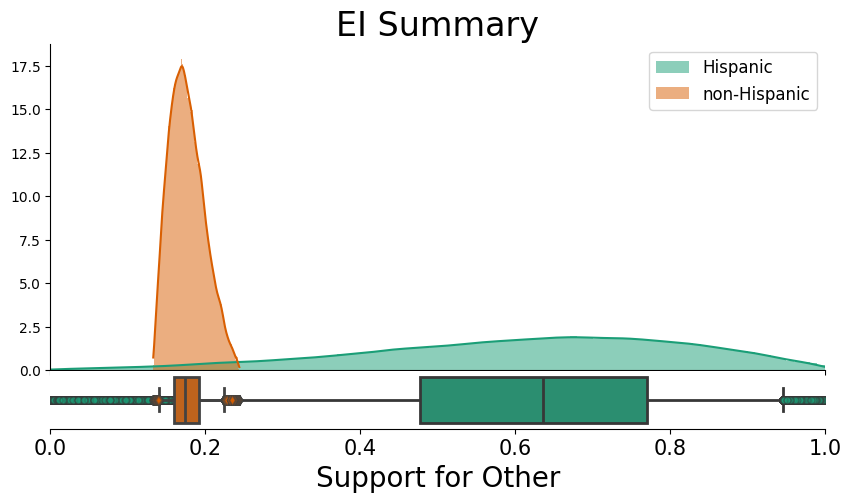

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Other is
        0.613
        The posterior mean for the district-level voting preference of
        non-Hispanic for Other is
        0.176
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Other is
        [0.16786095 0.94486287]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Other is
        [0.14010994 0.22441969]
        
Other , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

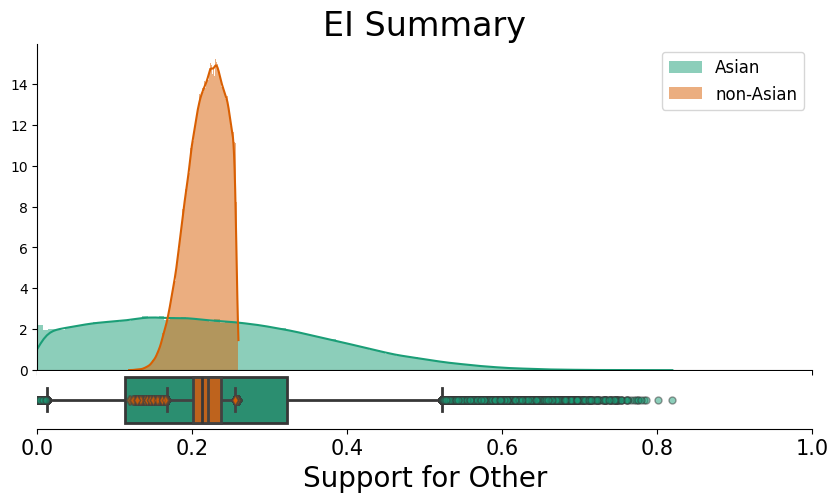

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Other is
        0.226
        The posterior mean for the district-level voting preference of
        non-Asian for Other is
        0.218
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Other is
        [0.01188282 0.52175401]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Other is
        [0.16700941 0.2547701 ]
        
Other , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

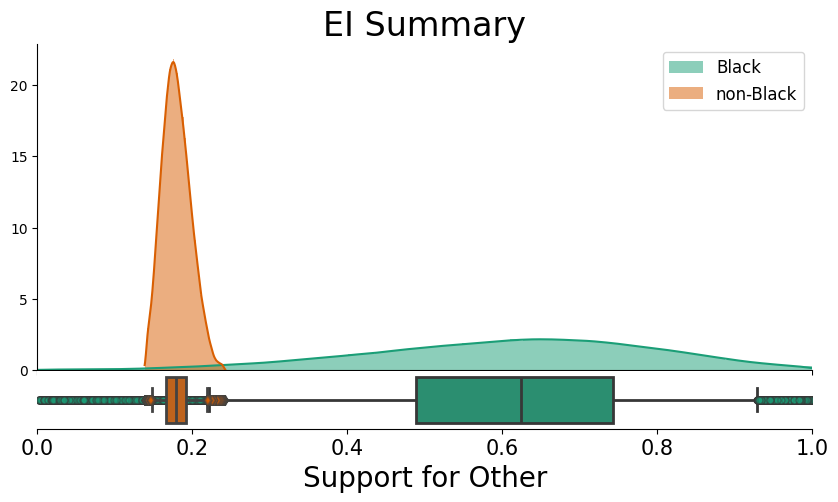

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Other is
        0.610
        The posterior mean for the district-level voting preference of
        non-Black for Other is
        0.180
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Other is
        [0.22183609 0.92922364]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Other is
        [0.14765599 0.21846275]
        
Other , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

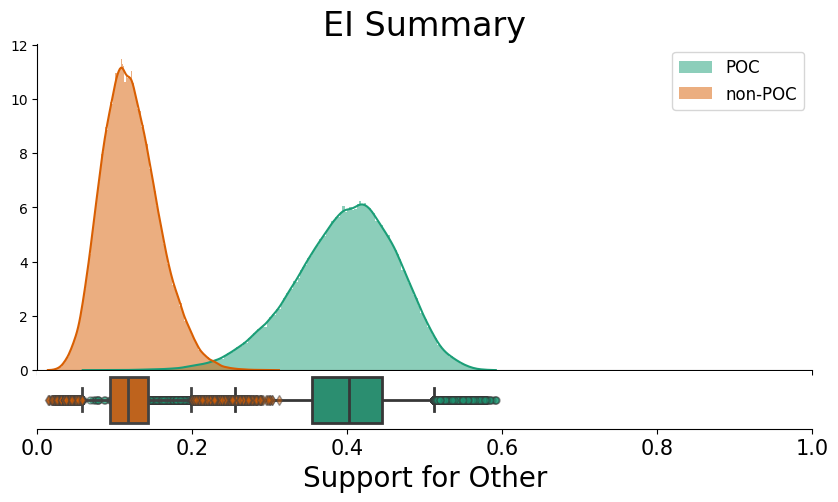

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Other is
        0.397
        The posterior mean for the district-level voting preference of
        non-POC for Other is
        0.120
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Other is
        [0.25494539 0.51221685]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Other is
        [0.05738789 0.19884617]
        


In [29]:
precinct_names = D1_precincts_df['Precinct']
demographic_groups = ["Hispanic", "Asian", "Black", "POC"]
election = "Borda 521000"
election_total_votes = "Condensed Borda 521000 total"

candidate_names = D1_candidates + ["Other"]
D1_precincts_df["Other " + election + " pct"] = 1 - D1_precincts_df[[name + " " + election + " pct" for name in D1_candidates]].sum(axis=1)

pop_pct_dict = {
    "Hispanic" : "HDVAP22 pct", 
    "Asian" : "AAPIDVAP22 pct", 
    "Black" : "BDVAP22 pct", 
    "POC": "POCDVAP22 pct",
    "White" : "WDVAP22 pct"
}


for i in range(len(candidate_names)):
    for demographic_group_name in demographic_groups:   
        candidate_name = candidate_names[i]
        votes_fraction = np.array(D1_precincts_df[candidate_name + " " + election + " pct"])
        precinct_votes = np.array(D1_precincts_df[election_total_votes])

        print(candidate_name, ',', demographic_group_name)
        group_fraction = np.array(D1_precincts_df[pop_pct_dict[demographic_group_name]])

        # Fitting a first 2 x 2 model

         # Create a TwobyTwoEI object
        ei_2by2 = TwoByTwoEI(model_name="king99_pareto_modification", pareto_scale=50, pareto_shape=10)

        # Fit the model
        ei_2by2.fit(group_fraction,
                votes_fraction,
                precinct_votes,
                demographic_group_name=demographic_group_name,
                candidate_name=candidate_name,
                precinct_names=precinct_names,
                draws=50000, # optional
                tune=10000, # optional
                target_accept=.999# optional
        )

        ei_2by2.plot()
        plt.show()

        # Plot the rhat and ess statistics and plot trace to see what's going on with these!
        #az.rhat(ei_2by2.sim_trace)
        #az.ess(ei_2by2.sim_trace)
        #az.plot_trace(ei_2by2.sim_trace, compact=True)

        # Generate a simple report to summarize the results
        print(ei_2by2.summary())

### RxC:

Running ['Hispanic', 'Asian', 'Black', 'White+Other'] x ['Candace Avalos', 'Jamie Dunphy', 'Loretta Smith', 'Noah Ernst', 'Terrence Hayes', 'Steph Routh', 'Timur Ender', 'Other'] EI
r = 4 rows (demographic groups)
c = 8 columns (candidates or voting outcomes)
number of precincts = 27


  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

/opt/miniconda3/envs/gerry2024/lib/python3.12/site-packages/jax/_src/interpreters/mlir.py:910: UserWarning: Some donated buffers were not usable: ShapedArray(float64[4,50000,27,4,7]).
See an explanation at https://jax.readthedocs.io/en/latest/faq.html#buffer-donation.
  warnings.warn("Some donated buffers were not usable:"


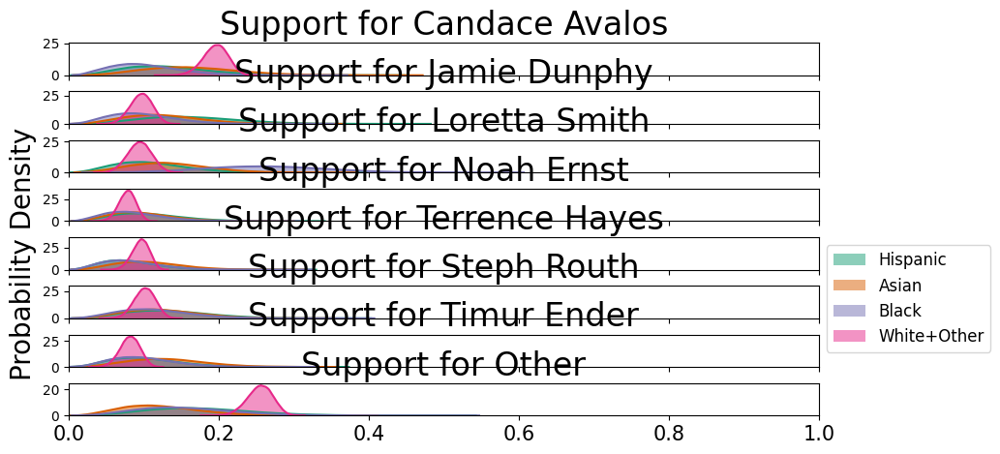


            Computed from the raw b_ samples by multiplying by group populations and then
            getting the proportion of the total pop
            (total pop=summed across all districts):
            The posterior mean for the district-level voting preference of
                Hispanic for Candace Avalos is
                0.131
                95% equal-tailed credible interval:  [0.0405535  0.25634711]
                The posterior mean for the district-level voting preference of
                Hispanic for Jamie Dunphy is
                0.162
                95% equal-tailed credible interval:  [0.0547336  0.29713307]
                The posterior mean for the district-level voting preference of
                Hispanic for Loretta Smith is
                0.109
                95% equal-tailed credible interval:  [0.03193131 0.2145185 ]
                The posterior mean for the district-level voting preference of
                Hispanic for Noah Ernst is
              

In [30]:
precinct_names = D1_precincts_df['Precinct']
demographic_group_names = ["Hispanic", "Asian", "Black", "White+Other"]
election = "Borda 521000"
election_total_votes = "Condensed Borda 521000 total"

candidate_names = D1_candidates + ["Other"]
D1_precincts_df["Other " + election + " pct"] = 1 - D1_precincts_df[[name + " " + election + " pct" for name in D1_candidates]].sum(axis=1)

D1_precincts_df['W+ODVAP22 pct'] = 1 - D1_precincts_df[['HDVAP22 pct', 'AAPIDVAP22 pct', 'BDVAP22 pct']].sum(axis=1)

votes_fractions = np.array(D1_precincts_df[[name + " " + election + " pct" for name in candidate_names]]).T
precinct_votes = np.array(D1_precincts_df[election_total_votes])

group_fractions = np.array(D1_precincts_df[['HDVAP22 pct', 'AAPIDVAP22 pct', 'BDVAP22 pct', 'W+ODVAP22 pct']]).T

ei = RowByColumnEI(model_name='multinomial-dirichlet')
ei.fit(group_fractions, votes_fractions, precinct_votes, demographic_group_names, candidate_names, draws=50000, target_accept=.999)

ei.plot()
plt.show()
print(ei.summary())

#ei.precinct_level_plot(D1_candidates[i])

### 2xC with POC combined:

Running ['POC', 'White'] x ['Candace Avalos', 'Jamie Dunphy', 'Loretta Smith', 'Noah Ernst', 'Terrence Hayes', 'Steph Routh', 'Timur Ender', 'Other'] EI
r = 2 rows (demographic groups)
c = 8 columns (candidates or voting outcomes)
number of precincts = 27


  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

/opt/miniconda3/envs/gerry2024/lib/python3.12/site-packages/jax/_src/interpreters/mlir.py:910: UserWarning: Some donated buffers were not usable: ShapedArray(float64[4,50000,27,2,7]).
See an explanation at https://jax.readthedocs.io/en/latest/faq.html#buffer-donation.
  warnings.warn("Some donated buffers were not usable:"


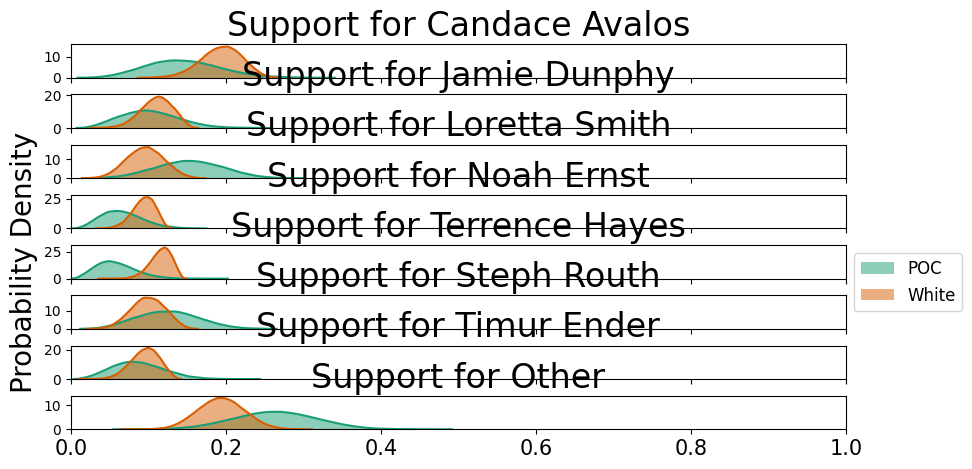


            Computed from the raw b_ samples by multiplying by group populations and then
            getting the proportion of the total pop
            (total pop=summed across all districts):
            The posterior mean for the district-level voting preference of
                POC for Candace Avalos is
                0.145
                95% equal-tailed credible interval:  [0.05971368 0.24400453]
                The posterior mean for the district-level voting preference of
                POC for Jamie Dunphy is
                0.102
                95% equal-tailed credible interval:  [0.03725982 0.17857574]
                The posterior mean for the district-level voting preference of
                POC for Loretta Smith is
                0.153
                95% equal-tailed credible interval:  [0.07060262 0.23531525]
                The posterior mean for the district-level voting preference of
                POC for Noah Ernst is
                0.066
            

In [31]:
precinct_names = D1_precincts_df['Precinct']
demographic_group_names = ["POC", "White"]
election = "Borda 521000"
election_total_votes = "Condensed Borda 521000 total"

candidate_names = D1_candidates + ["Other"]
D1_precincts_df["Other " + election + " pct"] = 1 - D1_precincts_df[[name + " " + election + " pct" for name in D1_candidates]].sum(axis=1)


votes_fractions = np.array(D1_precincts_df[[name + " " + election + " pct" for name in candidate_names]]).T
precinct_votes = np.array(D1_precincts_df[election_total_votes])

group_fractions = np.array(D1_precincts_df[['POCDVAP22 pct', 'WDVAP22 pct']]).T

ei = RowByColumnEI(model_name='multinomial-dirichlet')
ei.fit(group_fractions, votes_fractions, precinct_votes, demographic_group_names, candidate_names, draws=50000, target_accept=.999)

ei.plot()
plt.show()
print(ei.summary())

#ei.precinct_level_plot(D1_candidates[i])

### Ballot length:

### Goodman's ER (with plots):

Ballot length 1 , Hispanic
Goodmans ER, weighted by population
        Est. fraction of Hispanic
        voters who voted for Ballot length 1 is
        -0.059
        Est. fraction of non- Hispanic
        voters who voted for Ballot length 1 is
        0.158
        
Ballot length 1 , Asian
Goodmans ER, weighted by population
        Est. fraction of Asian
        voters who voted for Ballot length 1 is
        0.011
        Est. fraction of non- Asian
        voters who voted for Ballot length 1 is
        0.158
        
Ballot length 1 , Black
Goodmans ER, weighted by population
        Est. fraction of Black
        voters who voted for Ballot length 1 is
        0.193
        Est. fraction of non- Black
        voters who voted for Ballot length 1 is
        0.131
        
Ballot length 1 , AMIN
Goodmans ER, weighted by population
        Est. fraction of AMIN
        voters who voted for Ballot length 1 is
        -0.216
        Est. fraction of non- AMIN
        voters who vote

/opt/miniconda3/envs/gerry2024/lib/python3.12/site-packages/pyei/goodmans_er.py:109: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


Goodmans ER, weighted by population
        Est. fraction of POC
        voters who voted for Ballot length 6 is
        0.434
        Est. fraction of non- POC
        voters who voted for Ballot length 6 is
        0.372
        


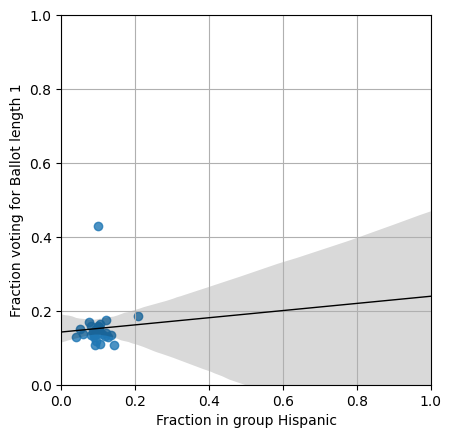

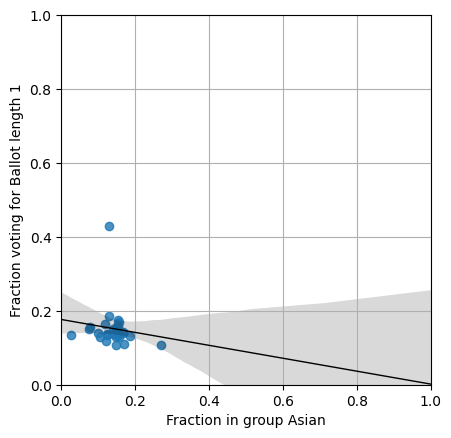

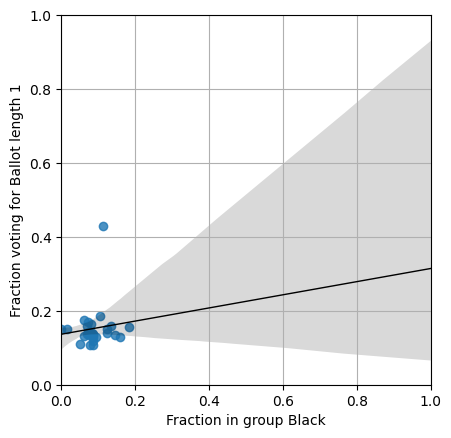

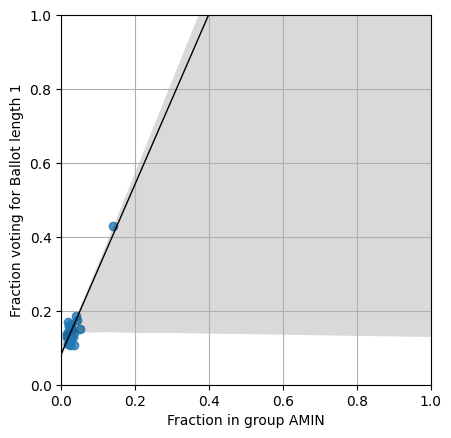

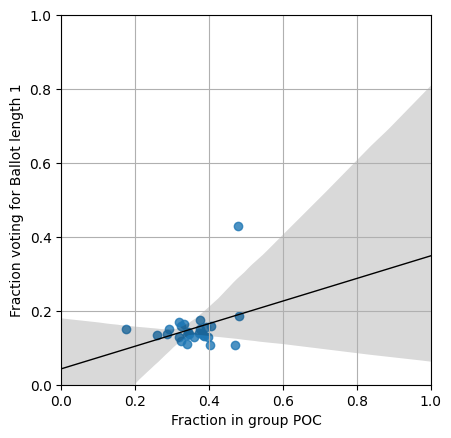

...

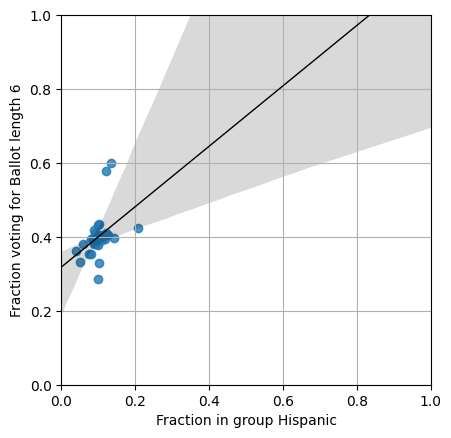

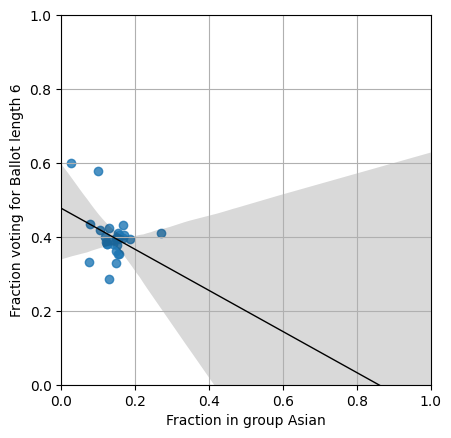

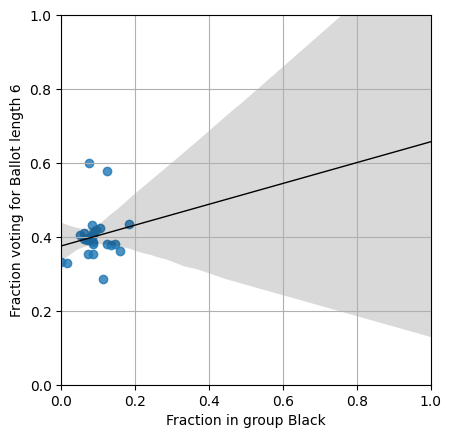

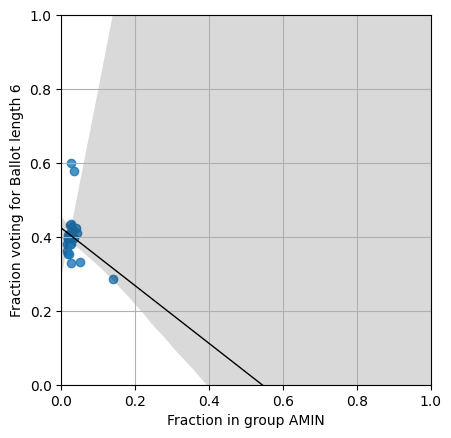

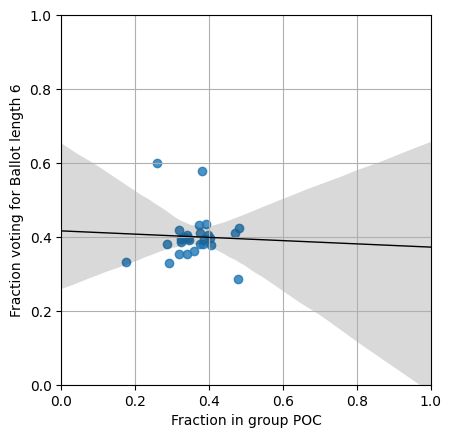

In [34]:
precinct_names = D1_precincts_df['Precinct']
demographic_groups = ["Hispanic", "Asian", "Black", "AMIN", "POC"]
election = "Ballot length"
election_total_votes = "Ballot length total"


pop_pct_dict = {
    "Hispanic" : "HDVAP22 pct", 
    "Asian" : "AAPIDVAP22 pct", 
    "Black" : "BDVAP22 pct", 
    "AMIN": "AMINDVAP22 pct",
    "POC": "POCDVAP22 pct",
    "White" : "WDVAP22 pct"
}


for i in range(1,7):
    for demographic_group_name in demographic_groups:   
        candidate_name = election + " " + str(i)
        votes_fraction = np.array(D1_precincts_df[candidate_name + " pct"])
        precinct_votes = np.array(D1_precincts_df[election_total_votes])

        print(candidate_name, ',', demographic_group_name)
        group_fraction = np.array(D1_precincts_df[pop_pct_dict[demographic_group_name]])

        # Fitting Goodman's ER - precincts weighted by population
        # Create a GoodmansER object
        goodmans_er = GoodmansER(is_weighted_regression=True)

        # Fit the model
        goodmans_er.fit(
            group_fraction,
            votes_fraction,
            precinct_votes,
            demographic_group_name=demographic_group_name,
            candidate_name=candidate_name
         )

        goodmans_er.plot(line_kws={"color":"black", "lw": 1})
        
        # Generate a simple report to summarize the results
        print(goodmans_er.summary())
    

### 2x2 EI:

Ballot length 1 , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

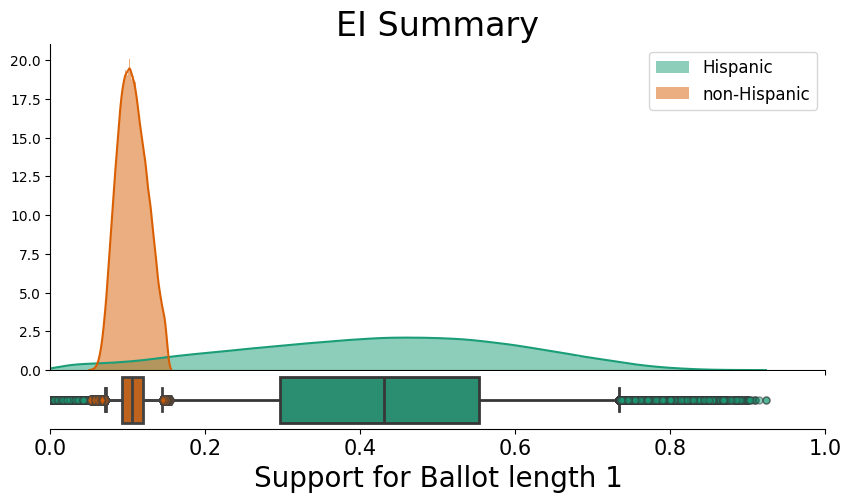

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Ballot length 1 is
        0.422
        The posterior mean for the district-level voting preference of
        non-Hispanic for Ballot length 1 is
        0.106
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Ballot length 1 is
        [0.07069536 0.73311342]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Ballot length 1 is
        [0.07219926 0.14376004]
        
Ballot length 1 , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

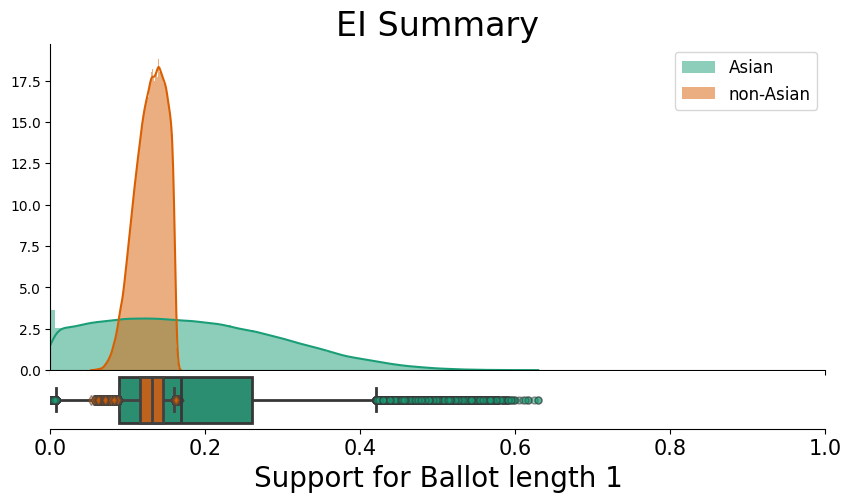

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Ballot length 1 is
        0.180
        The posterior mean for the district-level voting preference of
        non-Asian for Ballot length 1 is
        0.129
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Ballot length 1 is
        [0.00728139 0.42049219]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Ballot length 1 is
        [0.08836053 0.15910438]
        
Ballot length 1 , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

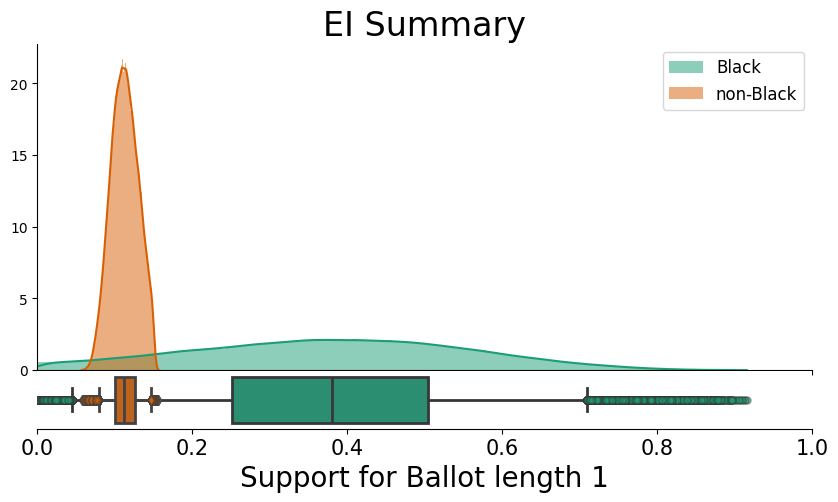

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Ballot length 1 is
        0.378
        The posterior mean for the district-level voting preference of
        non-Black for Ballot length 1 is
        0.113
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Ballot length 1 is
        [0.04490274 0.70947536]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Ballot length 1 is
        [0.07947824 0.14600638]
        
Ballot length 1 , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

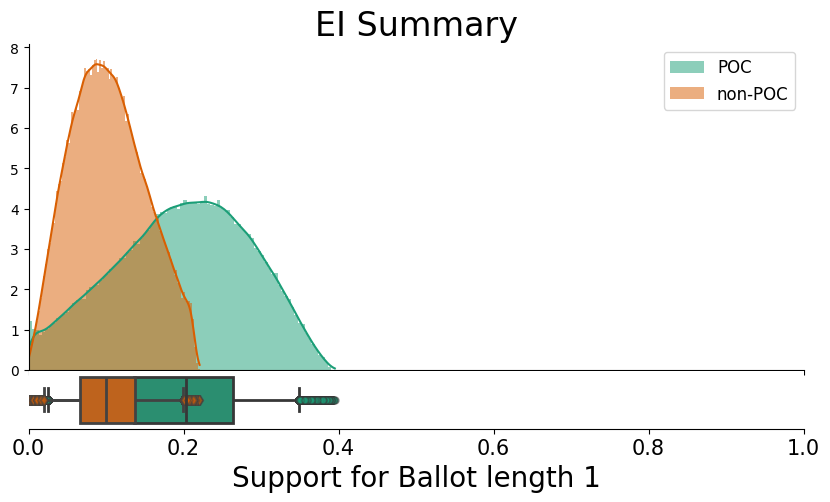

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Ballot length 1 is
        0.198
        The posterior mean for the district-level voting preference of
        non-POC for Ballot length 1 is
        0.103
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Ballot length 1 is
        [0.02478711 0.34886945]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Ballot length 1 is
        [0.02038645 0.19940687]
        
Ballot length 2 , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

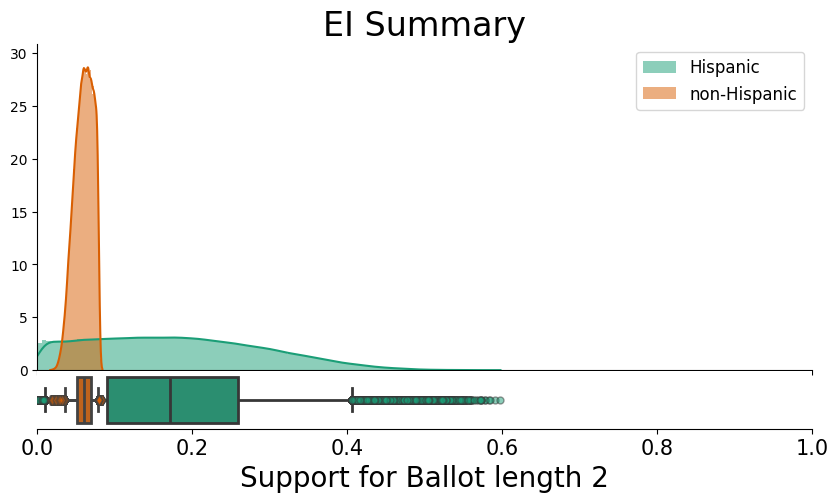

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Ballot length 2 is
        0.180
        The posterior mean for the district-level voting preference of
        non-Hispanic for Ballot length 2 is
        0.060
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Ballot length 2 is
        [0.00934523 0.40620207]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Ballot length 2 is
        [0.0356563  0.07860468]
        
Ballot length 2 , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

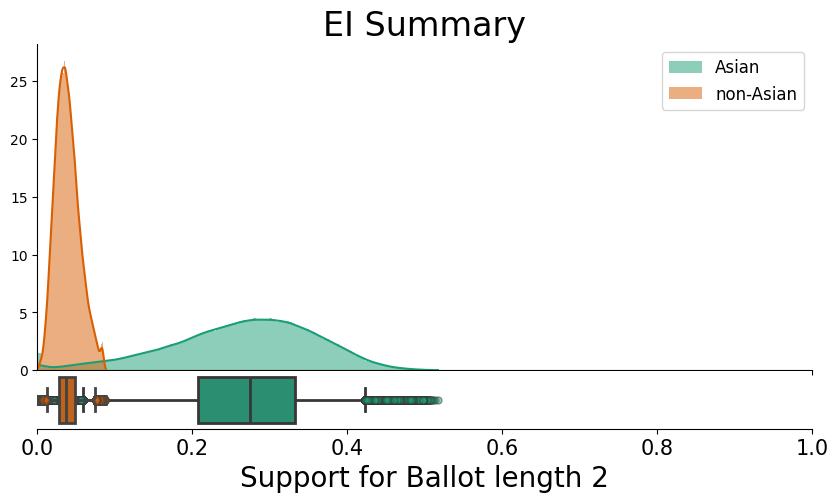

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Ballot length 2 is
        0.265
        The posterior mean for the district-level voting preference of
        non-Asian for Ballot length 2 is
        0.039
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Ballot length 2 is
        [0.05893268 0.42224709]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Ballot length 2 is
        [0.01276055 0.07392628]
        
Ballot length 2 , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

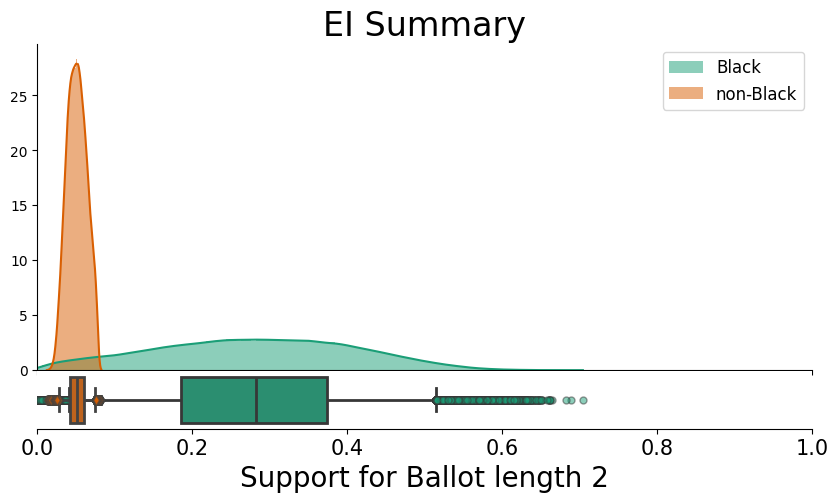

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Ballot length 2 is
        0.280
        The posterior mean for the district-level voting preference of
        non-Black for Ballot length 2 is
        0.051
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Ballot length 2 is
        [0.04068663 0.51445547]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Ballot length 2 is
        [0.02792935 0.07499291]
        
Ballot length 2 , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

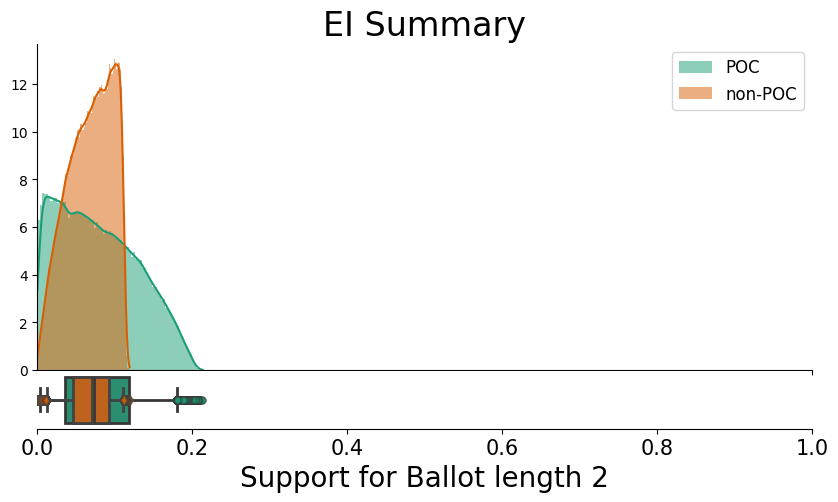

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Ballot length 2 is
        0.079
        The posterior mean for the district-level voting preference of
        non-POC for Ballot length 2 is
        0.068
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Ballot length 2 is
        [0.00389542 0.17984258]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Ballot length 2 is
        [0.01223588 0.10997151]
        
Ballot length 3 , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

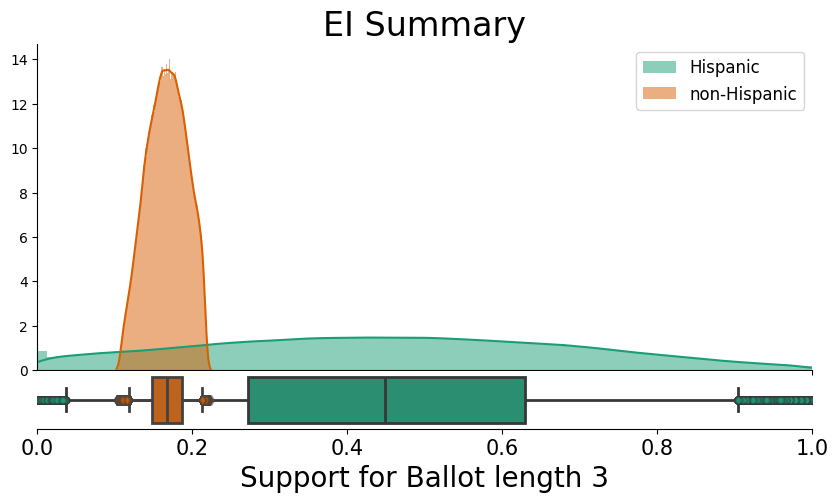

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Ballot length 3 is
        0.453
        The posterior mean for the district-level voting preference of
        non-Hispanic for Ballot length 3 is
        0.167
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Ballot length 3 is
        [0.03636376 0.90443804]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Ballot length 3 is
        [0.11800024 0.21223868]
        
Ballot length 3 , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

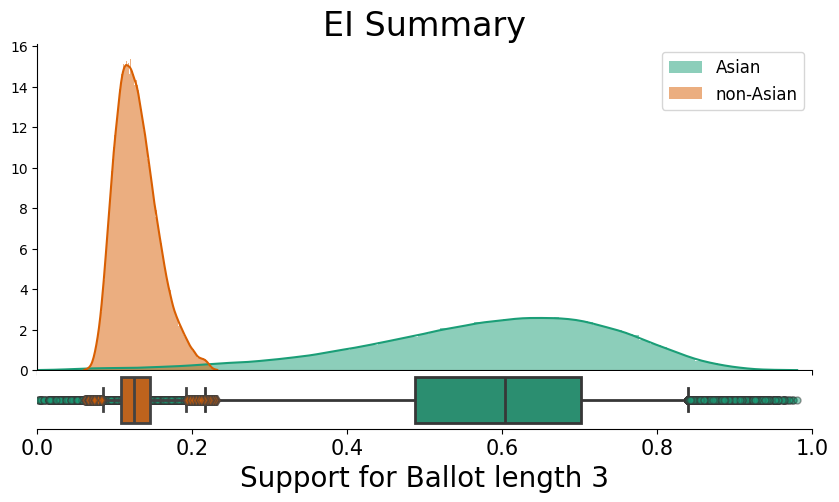

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Ballot length 3 is
        0.584
        The posterior mean for the district-level voting preference of
        non-Asian for Ballot length 3 is
        0.128
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Ballot length 3 is
        [0.21581015 0.83931246]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Ballot length 3 is
        [0.08442006 0.19166963]
        
Ballot length 3 , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

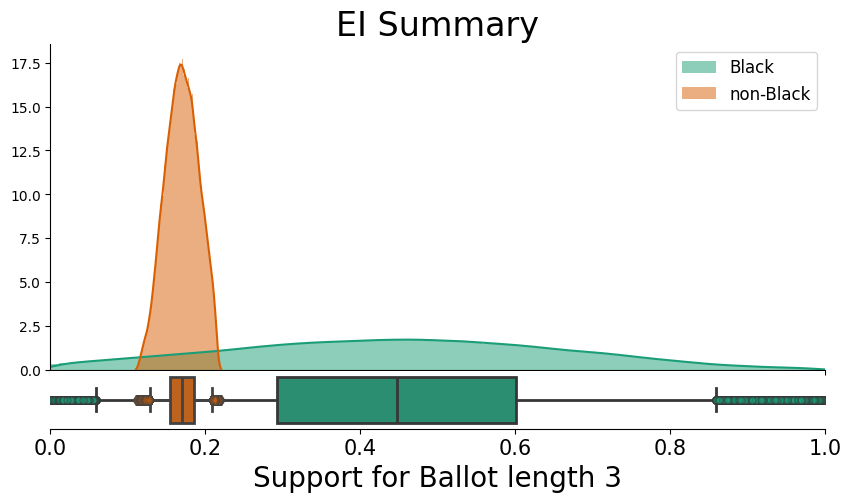

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Ballot length 3 is
        0.449
        The posterior mean for the district-level voting preference of
        non-Black for Ballot length 3 is
        0.170
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Ballot length 3 is
        [0.058222   0.85912563]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Ballot length 3 is
        [0.12841791 0.20881461]
        
Ballot length 3 , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

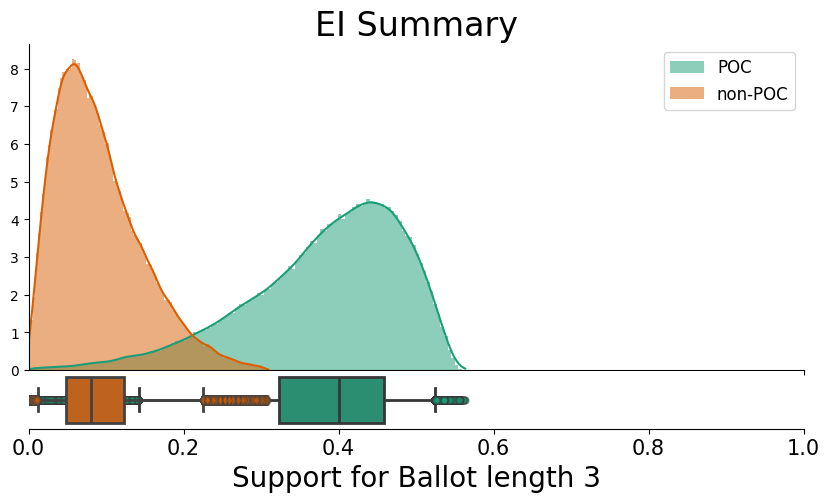

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Ballot length 3 is
        0.382
        The posterior mean for the district-level voting preference of
        non-POC for Ballot length 3 is
        0.091
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Ballot length 3 is
        [0.14182338 0.52442434]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Ballot length 3 is
        [0.01265676 0.22483357]
        
Ballot length 4 , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

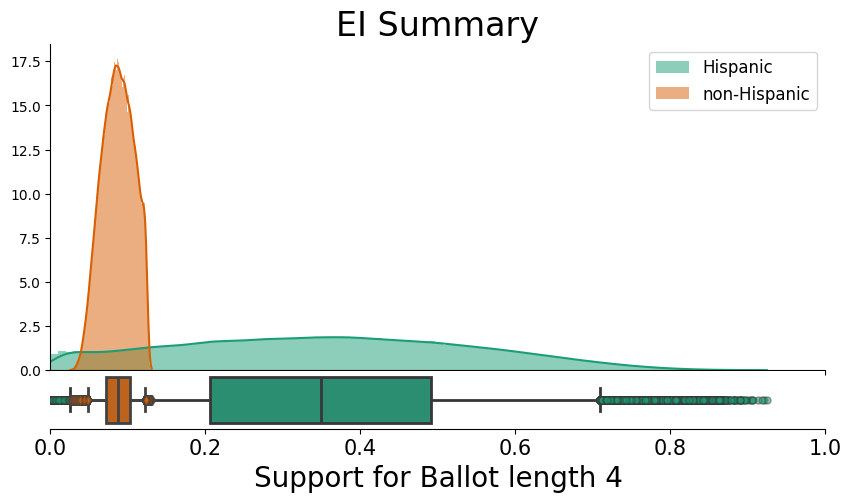

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Ballot length 4 is
        0.352
        The posterior mean for the district-level voting preference of
        non-Hispanic for Ballot length 4 is
        0.087
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Ballot length 4 is
        [0.0252096  0.70938011]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Ballot length 4 is
        [0.04829496 0.12237822]
        
Ballot length 4 , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

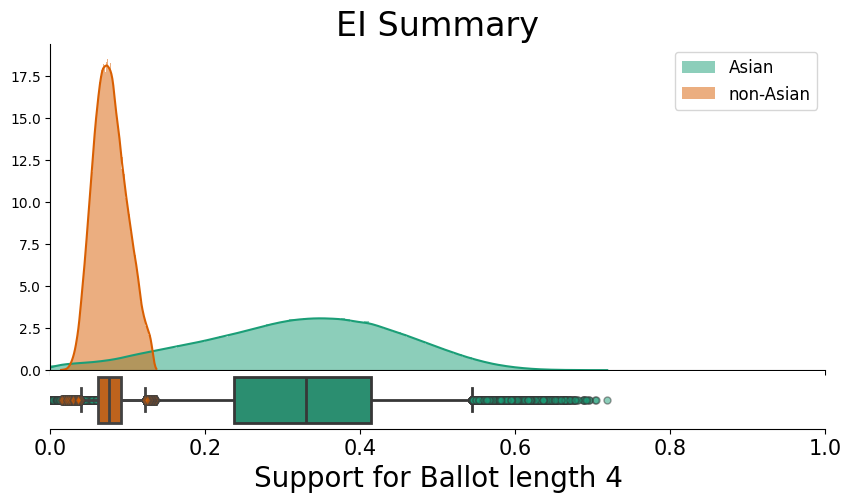

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Ballot length 4 is
        0.322
        The posterior mean for the district-level voting preference of
        non-Asian for Ballot length 4 is
        0.077
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Ballot length 4 is
        [0.0626634  0.54432687]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Ballot length 4 is
        [0.03971529 0.12151437]
        
Ballot length 4 , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

There were 23 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


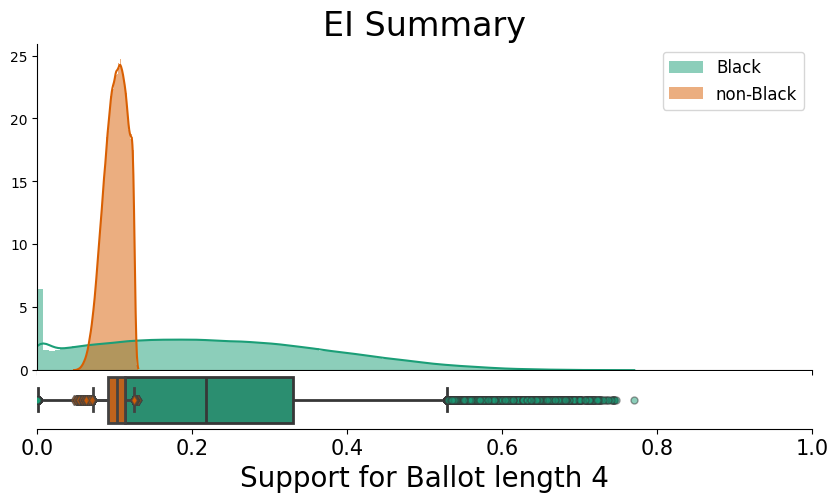

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Ballot length 4 is
        0.228
        The posterior mean for the district-level voting preference of
        non-Black for Ballot length 4 is
        0.101
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Ballot length 4 is
        [2.21649767e-04 5.28534114e-01]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Ballot length 4 is
        [0.07130466 0.12436336]
        
Ballot length 4 , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

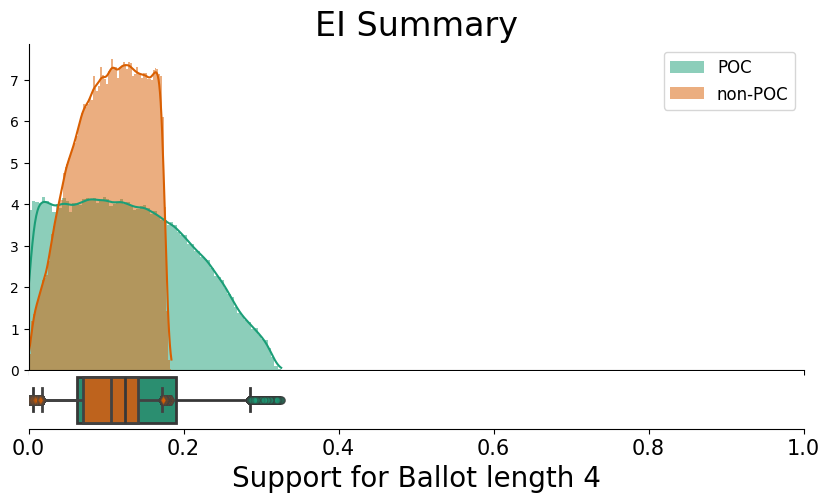

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Ballot length 4 is
        0.129
        The posterior mean for the district-level voting preference of
        non-POC for Ballot length 4 is
        0.104
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Ballot length 4 is
        [0.00630521 0.28516878]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Ballot length 4 is
        [0.01792761 0.17267746]
        
Ballot length 5 , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

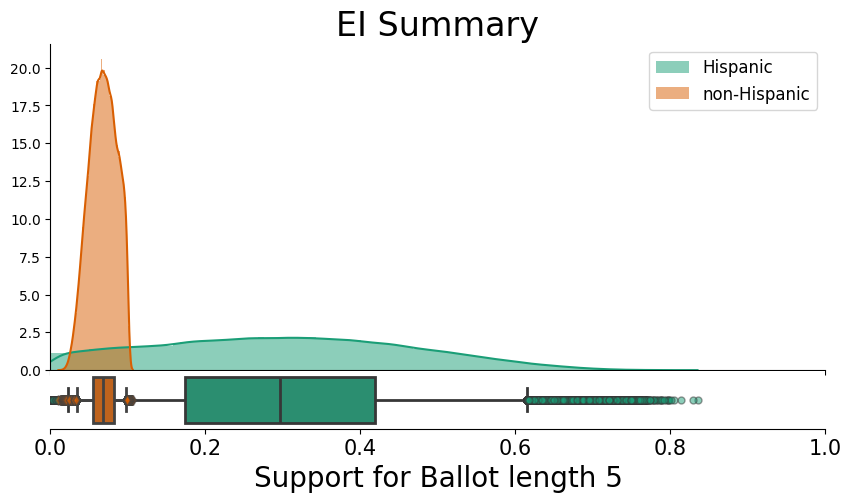

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Ballot length 5 is
        0.300
        The posterior mean for the district-level voting preference of
        non-Hispanic for Ballot length 5 is
        0.068
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Ballot length 5 is
        [0.02214763 0.61493388]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Ballot length 5 is
        [0.03380438 0.09792388]
        
Ballot length 5 , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

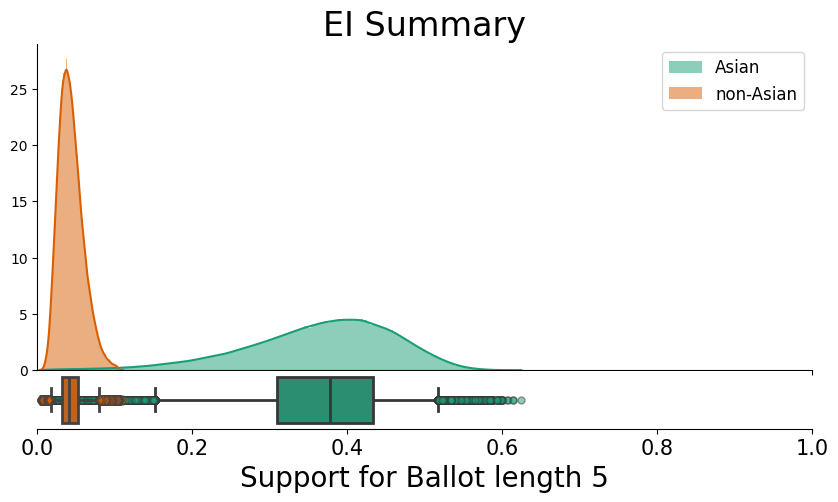

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Ballot length 5 is
        0.366
        The posterior mean for the district-level voting preference of
        non-Asian for Ballot length 5 is
        0.043
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Ballot length 5 is
        [0.15198184 0.51750727]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Ballot length 5 is
        [0.01817165 0.07989732]
        
Ballot length 5 , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

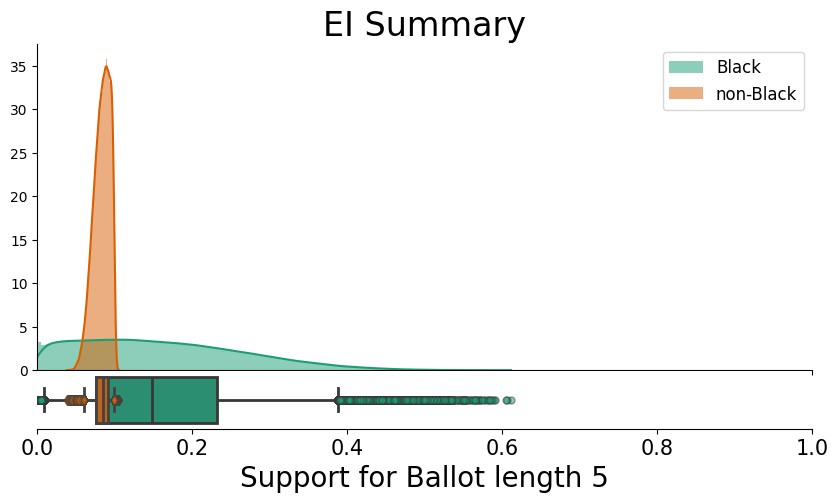

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Ballot length 5 is
        0.161
        The posterior mean for the district-level voting preference of
        non-Black for Ballot length 5 is
        0.083
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Ballot length 5 is
        [0.00803476 0.38804364]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Ballot length 5 is
        [0.06060954 0.09905811]
        
Ballot length 5 , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

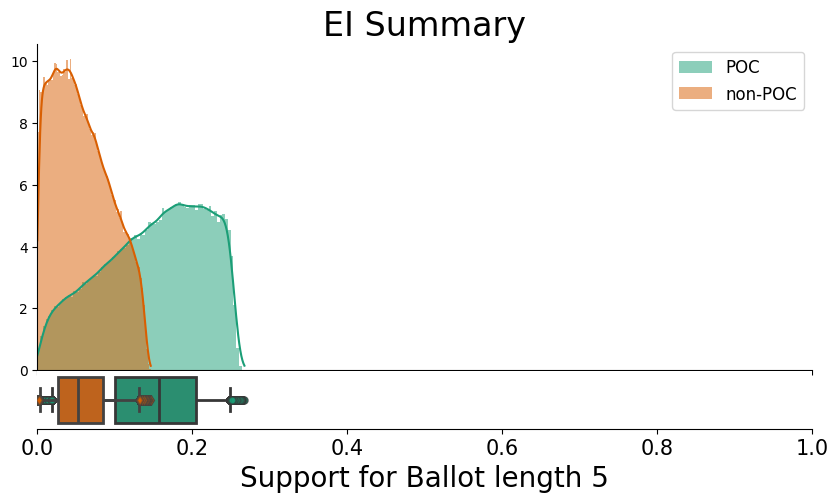

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Ballot length 5 is
        0.150
        The posterior mean for the district-level voting preference of
        non-POC for Ballot length 5 is
        0.058
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Ballot length 5 is
        [0.01858348 0.24911339]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Ballot length 5 is
        [0.00308404 0.13101914]
        
Ballot length 6 , Hispanic


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

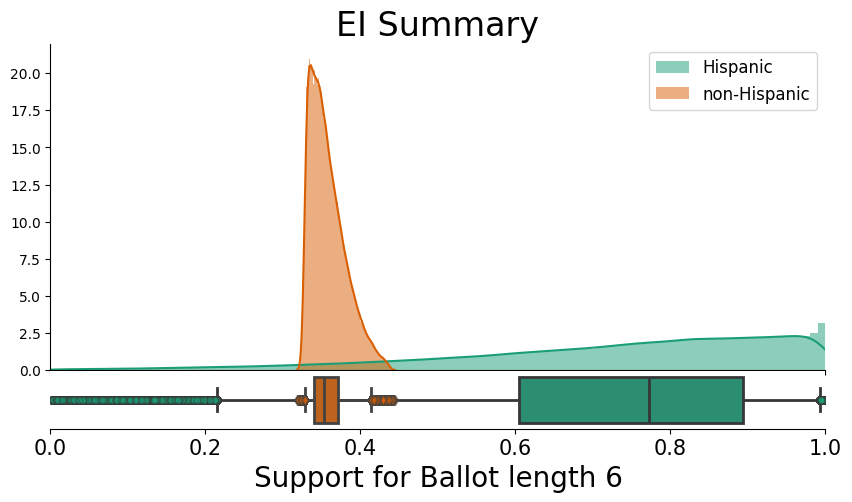

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Hispanic for Ballot length 6 is
        0.727
        The posterior mean for the district-level voting preference of
        non-Hispanic for Ballot length 6 is
        0.358
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Hispanic for Ballot length 6 is
        [0.21527708 0.99256224]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Hispanic for Ballot length 6 is
        [0.32828387 0.41370184]
        
Ballot length 6 , Asian


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

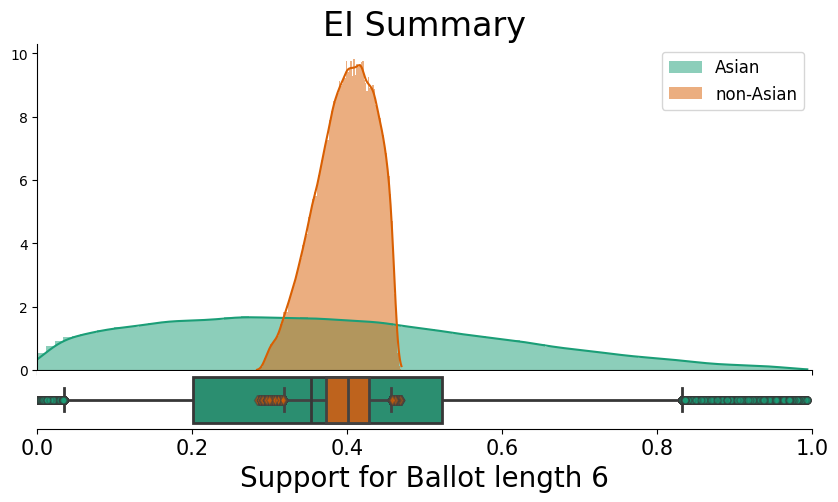

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Asian for Ballot length 6 is
        0.373
        The posterior mean for the district-level voting preference of
        non-Asian for Ballot length 6 is
        0.398
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Asian for Ballot length 6 is
        [0.03412243 0.83128949]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Asian for Ballot length 6 is
        [0.31840918 0.45648922]
        
Ballot length 6 , Black


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

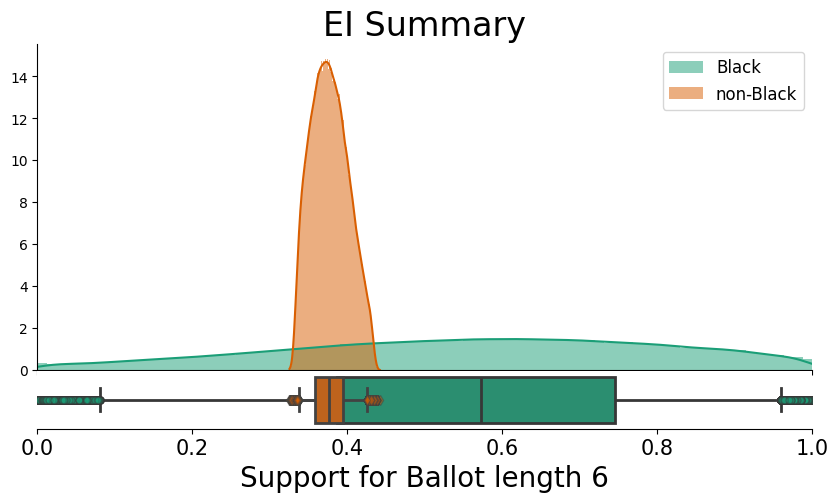

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        Black for Ballot length 6 is
        0.559
        The posterior mean for the district-level voting preference of
        non-Black for Ballot length 6 is
        0.377
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        Black for Ballot length 6 is
        [0.08028797 0.95918256]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-Black for Ballot length 6 is
        [0.33698244 0.42538634]
        
Ballot length 6 , POC


  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

  0%|          | 0/60000 [00:00<?, ?it/s]

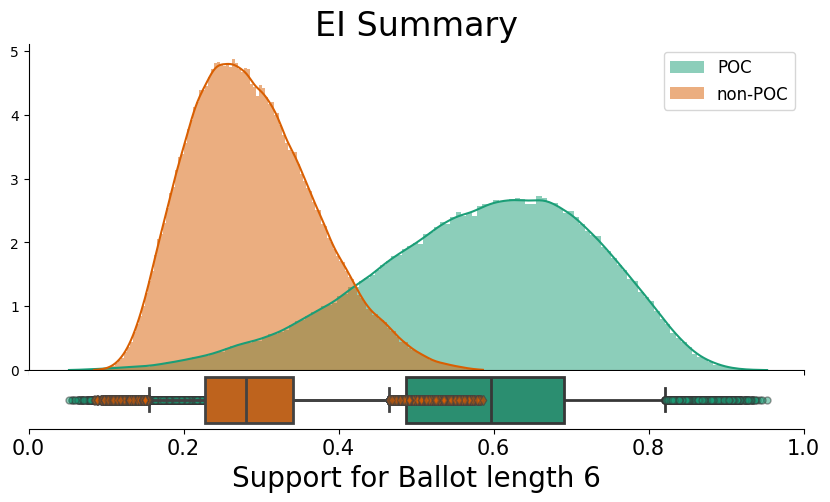

Model: king99_pareto_modification
        Computed from the raw b_i samples by multiplying by population and then getting
        the proportion of the total pop (total pop=summed across all districts):
        The posterior mean for the district-level voting preference of
        POC for Ballot length 6 is
        0.582
        The posterior mean for the district-level voting preference of
        non-POC for Ballot length 6 is
        0.289
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        POC for Ballot length 6 is
        [0.26691893 0.82175823]
        95% equal-tailed Bayesian credible interval for district-level voting preference of
        non-POC for Ballot length 6 is
        [0.15499336 0.46510085]
        


In [35]:
precinct_names = D1_precincts_df['Precinct']
demographic_groups = ["Hispanic", "Asian", "Black", "POC"]
election = "Ballot length"
election_total_votes = "Ballot length total"


pop_pct_dict = {
    "Hispanic" : "HDVAP22 pct", 
    "Asian" : "AAPIDVAP22 pct", 
    "Black" : "BDVAP22 pct", 
    "POC": "POCDVAP22 pct",
    "White" : "WDVAP22 pct"
}


for i in range(1,7):
    for demographic_group_name in demographic_groups:   
        candidate_name = election + " " + str(i)
        votes_fraction = np.array(D1_precincts_df[candidate_name + " pct"])
        precinct_votes = np.array(D1_precincts_df[election_total_votes])

        print(candidate_name, ',', demographic_group_name)
        group_fraction = np.array(D1_precincts_df[pop_pct_dict[demographic_group_name]])

        # Fitting a first 2 x 2 model

         # Create a TwobyTwoEI object
        ei_2by2 = TwoByTwoEI(model_name="king99_pareto_modification", pareto_scale=50, pareto_shape=10)

        # Fit the model
        ei_2by2.fit(group_fraction,
                votes_fraction,
                precinct_votes,
                demographic_group_name=demographic_group_name,
                candidate_name=candidate_name,
                precinct_names=precinct_names,
                draws=50000, # optional
                tune=10000, # optional
                target_accept=.999# optional
        )

        ei_2by2.plot()
        plt.show()

        # Plot the rhat and ess statistics and plot trace to see what's going on with these!
        #az.rhat(ei_2by2.sim_trace)
        #az.ess(ei_2by2.sim_trace)
        #az.plot_trace(ei_2by2.sim_trace, compact=True)

        # Generate a simple report to summarize the results
        print(ei_2by2.summary())

### RxC:

Running ['Hispanic', 'Asian', 'Black', 'White+Other'] x ['Ballot length 1', 'Ballot length 2', 'Ballot length 3', 'Ballot length 4', 'Ballot length 5', 'Ballot length 6'] EI
r = 4 rows (demographic groups)
c = 6 columns (candidates or voting outcomes)
number of precincts = 27


  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

/opt/miniconda3/envs/gerry2024/lib/python3.12/site-packages/jax/_src/interpreters/mlir.py:910: UserWarning: Some donated buffers were not usable: ShapedArray(float64[4,50000,27,4,5]).
See an explanation at https://jax.readthedocs.io/en/latest/faq.html#buffer-donation.
  warnings.warn("Some donated buffers were not usable:"


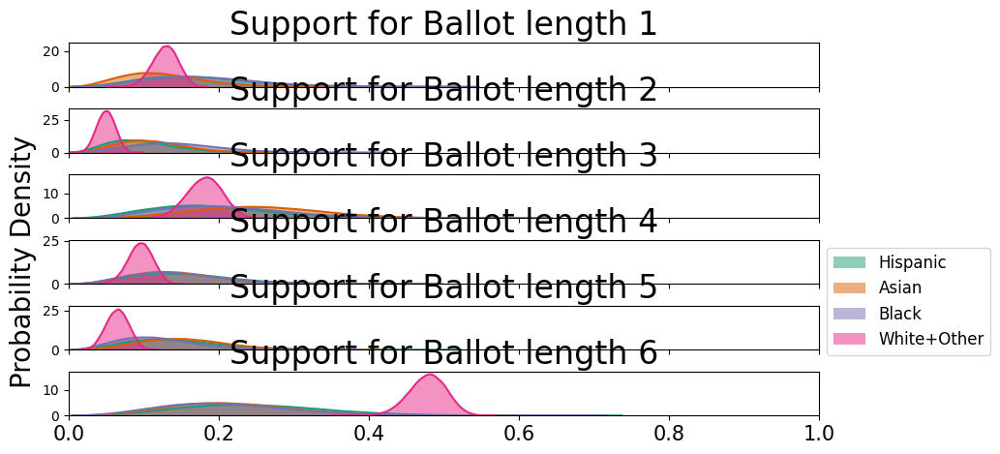


            Computed from the raw b_ samples by multiplying by group populations and then
            getting the proportion of the total pop
            (total pop=summed across all districts):
            The posterior mean for the district-level voting preference of
                Hispanic for Ballot length 1 is
                0.171
                95% equal-tailed credible interval:  [0.0552205  0.32322971]
                The posterior mean for the district-level voting preference of
                Hispanic for Ballot length 2 is
                0.098
                95% equal-tailed credible interval:  [0.02845825 0.19610483]
                The posterior mean for the district-level voting preference of
                Hispanic for Ballot length 3 is
                0.188
                95% equal-tailed credible interval:  [0.05782789 0.35819239]
                The posterior mean for the district-level voting preference of
                Hispanic for Ballot length 4 is
   

In [36]:
precinct_names = D1_precincts_df['Precinct']
demographic_group_names = ["Hispanic", "Asian", "Black", "White+Other"]
election = "Ballot length"
election_total_votes = "Ballot length total"

candidate_names = [election + " " + str(i) for i in range(1,7)]

votes_fractions = np.array(D1_precincts_df[[name + " pct" for name in candidate_names]]).T
precinct_votes = np.array(D1_precincts_df[election_total_votes])

group_fractions = np.array(D1_precincts_df[['HDVAP22 pct', 'AAPIDVAP22 pct', 'BDVAP22 pct', 'W+ODVAP22 pct']]).T

ei = RowByColumnEI(model_name='multinomial-dirichlet')
ei.fit(group_fractions, votes_fractions, precinct_votes, demographic_group_names, candidate_names, draws=50000, target_accept=.999)

ei.plot()
plt.show()
print(ei.summary())

#ei.precinct_level_plot(D1_candidates[i])

### Support by race for Ballot length 6 looks REALLY different in 2x2 than in RxC.  I don't know how to interpret that.

### 2xC with POC combined:

Running ['POC', 'White'] x ['Ballot length 1', 'Ballot length 2', 'Ballot length 3', 'Ballot length 4', 'Ballot length 5', 'Ballot length 6'] EI
r = 2 rows (demographic groups)
c = 6 columns (candidates or voting outcomes)
number of precincts = 27


  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

  0%|          | 0/51500 [00:00<?, ?it/s]

/opt/miniconda3/envs/gerry2024/lib/python3.12/site-packages/jax/_src/interpreters/mlir.py:910: UserWarning: Some donated buffers were not usable: ShapedArray(float64[4,50000,27,2,5]).
See an explanation at https://jax.readthedocs.io/en/latest/faq.html#buffer-donation.
  warnings.warn("Some donated buffers were not usable:"


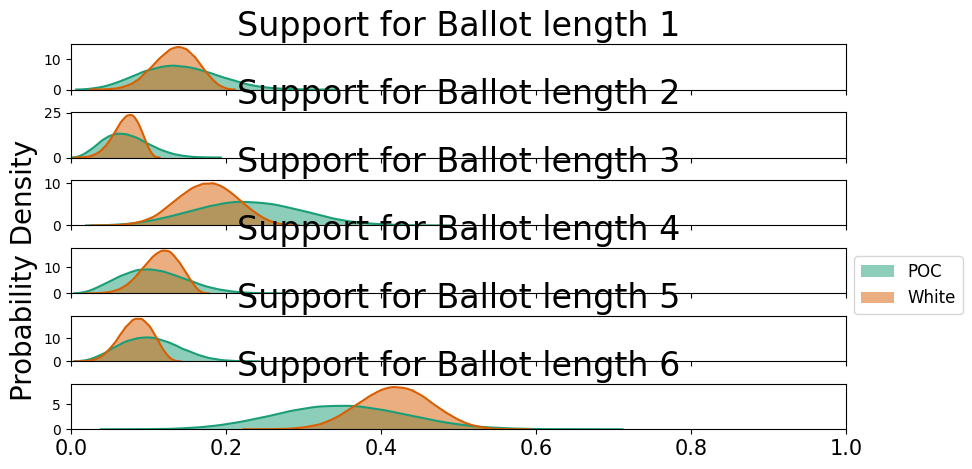


            Computed from the raw b_ samples by multiplying by group populations and then
            getting the proportion of the total pop
            (total pop=summed across all districts):
            The posterior mean for the district-level voting preference of
                POC for Ballot length 1 is
                0.140
                95% equal-tailed credible interval:  [0.05225771 0.23972538]
                The posterior mean for the district-level voting preference of
                POC for Ballot length 2 is
                0.072
                95% equal-tailed credible interval:  [0.02238784 0.13438025]
                The posterior mean for the district-level voting preference of
                POC for Ballot length 3 is
                0.229
                95% equal-tailed credible interval:  [0.1005041  0.36429255]
                The posterior mean for the district-level voting preference of
                POC for Ballot length 4 is
                0.107
 

In [37]:
precinct_names = D1_precincts_df['Precinct']
demographic_group_names = ["POC", "White"]
election = "Ballot length"
election_total_votes = "Ballot length total"

candidate_names = [election + " " + str(i) for i in range(1,7)]

votes_fractions = np.array(D1_precincts_df[[name + " pct" for name in candidate_names]]).T
precinct_votes = np.array(D1_precincts_df[election_total_votes])

group_fractions = np.array(D1_precincts_df[['POCDVAP22 pct', 'WDVAP22 pct']]).T

ei = RowByColumnEI(model_name='multinomial-dirichlet')
ei.fit(group_fractions, votes_fractions, precinct_votes, demographic_group_names, candidate_names, draws=50000, target_accept=.999)

ei.plot()
plt.show()
print(ei.summary())

#ei.precinct_level_plot(D1_candidates[i])

### So, what's up for Rank 1 vs. Borda for Avalos?

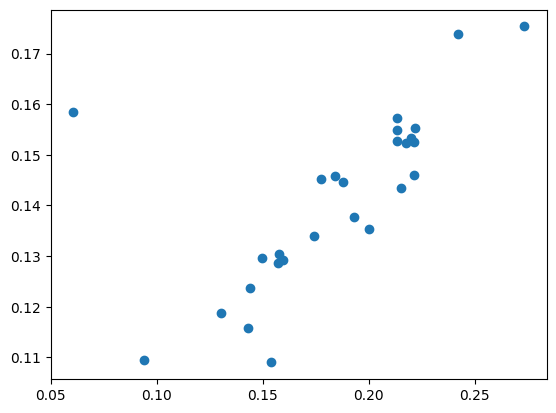

In [40]:
Avalos_Rank1 = list(D1_precincts_df['Candace Avalos Rank 1 pct'])
Avalos_Borda = list(D1_precincts_df['Candace Avalos Borda 654321 pct'])

plt.scatter(Avalos_Rank1, Avalos_Borda)

### Okay, so there's one extreme outlier precinct where her Borda percentage is WAY higher than her Rank 1 percentage.  What's up with that precinct?

In [44]:
D1_precincts_df[['Condensed total votes', 'POCDVAP22 pct', 'Candace Avalos Rank 1 pct', 'Candace Avalos Borda 654321 pct']]

,Condensed total votes,POCDVAP22 pct,Candace Avalos Rank 1 pct,Candace Avalos Borda 654321 pct
0,7,0.478131,0.142857,0.115789
1,15,0.259924,0.200000,0.135338
2,4157,0.382643,0.177532,0.145166
3,608,0.360383,0.149671,0.129583
4,1676,0.340636,0.273270,0.175338
5,1694,0.469254,0.217828,0.152395
6,2495,0.403235,0.242084,0.173834
7,1412,0.284812,0.184136,0.145768
8,3086,0.376659,0.144200,0.123641
9,2169,0.330902,0.159521,0.129182


### So the oulier is at index 25.  And there's a less extreme outlier in the other direction at index 20.

In [45]:
D1_precincts_df.loc[[20, 25]]

,Unnamed: 0,Precinct,District,TOTPOP20,VAP20,HVAP20,AAPIVAP20,BVAP20,AMINVAP20,WVAP20,DVAP22,HDVAP22,AAPIDVAP22,BDVAP22,AMINDVAP22,WDVAP22,Candace Avalos Condensed Rank 1,Jamie Dunphy Condensed Rank 1,Loretta Smith Condensed Rank 1,Noah Ernst Condensed Rank 1,Terrence Hayes Condensed Rank 1,Steph Routh Condensed Rank 1,Timur Ender Condensed Rank 1,Doug Clove Condensed Rank 1,Peggy Sue Owens Condensed Rank 1,David Linn Condensed Rank 1,Joe Allen Condensed Rank 1,Michael (Mike) Sands Condensed Rank 1,Deian Salazar Condensed Rank 1,Cayle Tern Condensed Rank 1,Thomas Shervey Condensed Rank 1,Joe Furi Condensed Rank 1,Uncertified Write In Condensed Rank 1,Candace Avalos Condensed Rank 2,Jamie Dunphy Condensed Rank 2,Loretta Smith Condensed Rank 2,Noah Ernst Condensed Rank 2,Terrence Hayes Condensed Rank 2,Steph Routh Condensed Rank 2,Timur Ender Condensed Rank 2,Doug Clove Condensed Rank 2,Peggy Sue Owens Condensed Rank 2,David Linn Condensed Rank 2,Joe Allen Condensed Rank 2,Michael (Mike) Sands Condensed Rank 2,Deian Salazar Condensed Rank 2,Cayle Tern Condensed Rank 2,Thomas Shervey Condensed Rank 2,Joe Furi Condensed Rank 2,Uncertified Write In Condensed Rank 2,Candace Avalos Condensed Rank 3,Jamie Dunphy Condensed Rank 3,Loretta Smith Condensed Rank 3,Noah Ernst Condensed Rank 3,Terrence Hayes Condensed Rank 3,Steph Routh Condensed Rank 3,Timur Ender Condensed Rank 3,Doug Clove Condensed Rank 3,Peggy Sue Owens Condensed Rank 3,David Linn Condensed Rank 3,Joe Allen Condensed Rank 3,Michael (Mike) Sands Condensed Rank 3,Deian Salazar Condensed Rank 3,Cayle Tern Condensed Rank 3,Thomas Shervey Condensed Rank 3,Joe Furi Condensed Rank 3,Uncertified Write In Condensed Rank 3,Candace Avalos Condensed Rank 4,Jamie Dunphy Condensed Rank 4,Loretta Smith Condensed Rank 4,Noah Ernst Condensed Rank 4,Terrence Hayes Condensed Rank 4,Steph Routh Condensed Rank 4,Timur Ender Condensed Rank 4,Doug Clove Condensed Rank 4,Peggy Sue Owens Condensed Rank 4,David Linn Condensed Rank 4,Joe Allen Condensed Rank 4,Michael (Mike) Sands Condensed Rank 4,Deian Salazar Condensed Rank 4,Cayle Tern Condensed Rank 4,Thomas Shervey Condensed Rank 4,Joe Furi Condensed Rank 4,Uncertified Write In Condensed Rank 4,Candace Avalos Condensed Rank 5,Jamie Dunphy Condensed Rank 5,Loretta Smith Condensed Rank 5,Noah Ernst Condensed Rank 5,Terrence Hayes Condensed Rank 5,Steph Routh Condensed Rank 5,Timur Ender Condensed Rank 5,Doug Clove Condensed Rank 5,Peggy Sue Owens Condensed Rank 5,David Linn Condensed Rank 5,Joe Allen Condensed Rank 5,Michael (Mike) Sands Condensed Rank 5,Deian Salazar Condensed Rank 5,Cayle Tern Condensed Rank 5,Thomas Shervey Condensed Rank 5,Joe Furi Condensed Rank 5,Uncertified Write In Condensed Rank 5,Candace Avalos Condensed Rank 6,Jamie Dunphy Condensed Rank 6,Loretta Smith Condensed Rank 6,Noah Ernst Condensed Rank 6,Terrence Hayes Condensed Rank 6,Steph Routh Condensed Rank 6,Timur Ender Condensed Rank 6,Doug Clove Condensed Rank 6,Peggy Sue Owens Condensed Rank 6,David Linn Condensed Rank 6,Joe Allen Condensed Rank 6,Michael (Mike) Sands Condensed Rank 6,Deian Salazar Condensed Rank 6,Cayle Tern Condensed Rank 6,Thomas Shervey Condensed Rank 6,Joe Furi Condensed Rank 6,Uncertified Write In Condensed Rank 6,Condensed total votes,Candace Avalos Condensed Borda 654321,Jamie Dunphy Condensed Borda 654321,Loretta Smith Condensed Borda 654321,Noah Ernst Condensed Borda 654321,Terrence Hayes Condensed Borda 654321,Steph Routh Condensed Borda 654321,Timur Ender Condensed Borda 654321,Doug Clove Condensed Borda 654321,Peggy Sue Owens Condensed Borda 654321,David Linn Condensed Borda 654321,Joe Allen Condensed Borda 654321,Michael (Mike) Sands Condensed Borda 654321,Deian Salazar Condensed Borda 654321,Cayle Tern Condensed Borda 654321,Thomas Shervey Condensed Borda 654321,Joe Furi Condensed Borda 654321,Uncertified Write In Condensed Borda 654321,Condensed Borda 654321 total,Candace Avalos Condensed Borda 521000,Jamie Dunphy Condensed Borda 5

### Oh look, it's the Clackamas precinct!  With only 80 people in DVAP!
### But it IS extremely white, and gave Avalos not many Rank 1 votes but lots of Rank 2 and 3 votes.
### Conversely, the outlier in the other direction is 48% POC - but still small.